In [2]:
import os
# limit GPU allocation
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID" #issue #152
os.environ['CUDA_VISIBLE_DEVICES'] = '1'
import numpy as np
np.random.seed(42)
import importlib
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import SparsePCA, PCA
from sklearn.base import clone
from collections import Counter
import pandas as pd
import tqdm
import glob
import fnmatch
import gzip
import re
import sys
import random
import itertools
# Import all models
from joblib import dump, load
from sklearn.ensemble import IsolationForest
from pyod.models.abod import ABOD
from pyod.models.cblof import CBLOF
# from pyod.models.feature_bagging import FeatureBagging
from pyod.models.hbos import HBOS
from pyod.models.iforest import IForest
from pyod.models.knn import KNN
from pyod.models.lof import LOF
from pyod.models.mcd import MCD
from pyod.models.ocsvm import OCSVM
from pyod.models.lscp import LSCP
from pyod.models.auto_encoder import AutoEncoder
from pyod.models.vae import VAE
import shap

from subprocess import check_output
%matplotlib inline

home = '/home/vagrant'
model_dir = os.path.join(home, 'models')
paper_data_folder = os.path.join(home, 'paper_data')

# check if folders exist if not create
if not os.path.exists(model_dir):
    os.makedirs(model_dir)
if not os.path.exists(paper_data_folder):
    os.makedirs(paper_data_folder)

paper_data = os.path.join(paper_data_folder,"training_jcsd2021.csv")
paper_data_test = os.path.join(paper_data_folder,"testing_jcsd2021.csv")

# Load data
df_paper = pd.read_csv(paper_data, index_col=0) # set index as first colmn (datetime)
df_paper_test = pd.read_csv(paper_data_test, index_col=0)

In [3]:
def filter_low_variance(df_work):
    print("Checking low variance columns ...")
    print("Starting Clean dataset")
    uniques = df_work.apply(lambda x: x.nunique())
    rm_columns = []
    for uindex, uvalue in uniques.iteritems():
        if uvalue == 1:
            rm_columns.append(uindex)
    print(f"First pass columns to be removed {len(rm_columns)}")
    print(rm_columns)
    print(f"Initial shape: {df_work.shape}")
    df_work_filtered = df_work.drop(rm_columns, inplace=False, axis=1)
    print(f"Filtered shape: {df_work_filtered.shape}")
    return df_work_filtered, rm_columns

def add_agg_traffic(df):
    for f,e,w in ((f, 'eth.'+f, 'wifi.'+f) for f in (
            f+'.rate' for f  in ['txe', 'rxe', 'txb', 'rxb', 'txp', 'rxp'])):
        if e in df and w in df:
            df[f] = df[e].fillna(0) + df[w].fillna(0)
        elif e in df:
            df[f] = df[e].fillna(0)
        elif w in df:
            df[f] = df[w].fillna(0)
    for f in ['b.rate', 'p.rate']:
        if 'rx'+f in df and 'tx'+f in df:
            df['sum.x'+f]  = df['rx'+f] + df['tx'+f]
            df['diff.x'+f] = df['rx'+f] - df['tx'+f]
        else:
            return False
    return True

def load_hd_data(hdf):
    f = gzip.open(hdf)
    df = pd.read_csv(f, index_col=0)
    df.index = pd.to_datetime(df.index)
    return(df)


def load_filter_low_variance(data_loc,
                             reg_file,
                             low_varaince=True,
                             dropcol=['name', 'uid', 'id',]):
    """
    :param data_loc: directory where files are located
    :param reg_file: name of the csv to be loaded, if * at end only specified node is considered,
    if * at the beginning specifies time
    :param dropcol: list of columns to drop from all df
    :return: dataframe
    """
    print("Data location: ")
    print(data_loc)
    print("Work dir")
    print(os.getcwd())
    print("Checking files in data location ...")

    # print(reg_file.split('.')[0][-1])
    if reg_file.split('.')[0][-1] == "*":
        same_node = False
    else:
        same_node = True

    files = glob.glob(os.path.join(data_loc, reg_file))
    # print(files)
    # sys.exit()
    if same_node:
        # Load files for a particular node based on reg_file

        list_df = []
        for f in tqdm.tqdm(files):
            # print(f)
            df = pd.read_csv(f)
            df.drop(dropcol, inplace=True, axis=1)
            add_agg_traffic(df)
            list_df.append(df)

        # Get Column file
        column_size = []
        for d in list_df:
            # print(d.shape)
            column_size.append(d.shape[-1])
        if low_varaince:
            from collections import Counter
            items = Counter(column_size).keys()
            print("Unique column size: {}".format(items))
            print(f"Columns found: {list_df[0].columns}")

            df_work = list_df[0]
            print("Checking low variance columns ...")
            print("Starting Clean dataset")
            uniques = df_work.apply(lambda x: x.nunique())
            rm_columns = []
            for uindex, uvalue in uniques.iteritems():
                if uvalue == 1:
                    rm_columns.append(uindex)
            print("First pass columns to be removed")
            print(rm_columns)

            # Find common low variance elements in list of low variance columns
            list_low_varaince = []
            for df in list_df:
            # Check for monotonous columns and remove them
                print("Checking low variance columns ...")
                print("Starting Clean dataset")
                uniques = df.apply(lambda x: x.nunique())
                rm_columns = []
                for uindex, uvalue in uniques.iteritems():
                    if uvalue == 1:
                        rm_columns.append(uindex)
                print(rm_columns)
                list_low_varaince.append(rm_columns)

            common_low_variance = list(set.intersection(*map(set, list_low_varaince)))
            print("Common low variance columns:")
            print(common_low_variance)

            # Remove common low variance columns
            for df in list_df:
                df.drop(common_low_variance, inplace=True, axis=1)

        # Concat all dataframes
        df_concat = pd.concat(list_df, ignore_index=True)
        print(f"Concatenated all data, new shape is {df_concat.shape} and columns are:")
        print(df_concat.shape)
        return df_concat
    else:
        dict_all_df = {}
        for e in files:
            node_id = e.split("/")[-1].split('.')[0].split('-')[-1] # add node values
            df = pd.read_csv(e, index_col=0)
            # df = pd.read_csv(f, index_col=0)
            df.index = pd.to_datetime(df.index)
            # drop specified columns
            df.drop(dropcol, inplace=True, axis=1)
            add_agg_traffic(df)
            if node_id not in dict_all_df.keys():
                dict_all_df[node_id] = [df]
            else:
                dict_all_df[node_id].append(df)

        # print(dict_all_df)
        print("Consolidating individual dataframe ...")
        dict_all_concat_df = {}
        for k, v in tqdm.tqdm(dict_all_df.items()): # todo: fix node 6 issues
            # Concat on rows
            df_concat = pd.concat(v, ignore_index=False)
            # df_filtered = df_concat.filter(like="rate", axis=1)
            # Save dataframe
            # df_concat.add_suffix(f'_{k}').to_csv(os.path.join(concat_dir, f'state_{k}.csv'), index=False)
            dict_all_concat_df[k] = df_concat.add_suffix(f'-{k}')
        # print(dict_all_concat_df['7'])
        df_all = pd.DataFrame()

        print("Consolidating all columns ...")
        for k,v in tqdm.tqdm(dict_all_concat_df.items()):
            # filter based on columns containing rate
            # df_filtered = v.filter(like="rate", axis=1)
            df_all = pd.concat([df_all, v], axis=1)
        if low_varaince:
            print("Checking low variance columns ...")
            print("Starting Clean dataset")
            uniques = df_all.apply(lambda x: x.nunique())
            rm_columns = []
            for uindex, uvalue in uniques.iteritems():
                if uvalue == 1:
                    rm_columns.append(uindex)
            print(f"First pass columns to be removed: {len(rm_columns)}")

            df_all.drop(rm_columns, inplace=True, axis=1)
        return df_all

def filter_columns_wildcard(df_work, wild_card, keep=True):
    """
    :param df_work: dataframe to filer
    :param wild_card: str wildcard of columns to be filtered
    :param keep: if keep True, only cols with wildcard are kept, of False they will be deleted
    :return: filtered dataframe
    """
    filter_col_wildcard = wild_card
    filtr_list = []
    mask = df_work.columns.str.contains(filter_col_wildcard)
    filtr_list.extend(list(df_work.loc[:,mask].columns.values))
    print("Columns to be filtered:")
    print(filtr_list)
    if keep:
        df_concat_filtered = df_work[filtr_list]
    else:
        df_concat_filtered = df_work.drop(filtr_list, axis=1)

    print(f"Filtered shape: {df_concat_filtered.shape}")
    print("Columns of filtered data:")
    print(df_concat_filtered.columns)
    return df_concat_filtered

def filter_nan_col(df_concat_filtered,
                   drop_threashold=0.4,
                   fillna=True,
                   verbose=0):
    """
    :param df_concat_filtered: dataframe to be processed
    :param drop_threashold: threashold for dropping columns based on NaN values
    :param fillna: Fill NaN with 0
    """
    # Count nan values per column and set drop threashold
    drop_list_th = []
    for c in df_concat_filtered.columns.values:
        percentage_nan = 100*df_concat_filtered[c].isna().sum()/len(df_concat_filtered)
        if verbose:
            print(f"Length of column {c} is {len(df_concat_filtered)}")
            print(f"Of which {df_concat_filtered[c].isna().sum()} are nan")
            print(f"Percentage of nan in {c} is {percentage_nan/100}")
        if percentage_nan/100 > drop_threashold:
            # print(f"Percentage of nan in {c} is {percentage_nan}")
            drop_list_th.append(c)
    print(f"Colsumns before nan drop: {df_concat_filtered.shape[-1]}")
    print(f"Columns to be droped {len(drop_list_th)}")
    # print(drop_list_th)
    # print(df_concat_filtered.columns)
    df_concat_filtered.drop(drop_list_th, axis=1, inplace=True)
    if fillna:
        df_concat_filtered.fillna(value=0, inplace=True)

def plot_on_features(data, pred, features=[], anomay_label=-1):
    """
    :param data: dataset used for training or prediction
    :param pred: model prediction
    :param anomay_label: label for anomaly instances (differs from method to method)
    :return:
    """
    if not features:
        col_names_plt = list(data.columns.values)
    else:
        col_names_plt = features
    data['anomaly'] = pred
    for feature in col_names_plt:
        if feature == 'epoch' or feature == 'anomaly':
            pass
        else:
            # fig, ax = plt.subplots(figsize=(15,10))
            a = data[data['anomaly'] == anomay_label] #anomaly
            _ = plt.figure(figsize=(18,6))
            _ = plt.plot(data[feature], color='blue', label='Normal')
            _ = plt.plot(a[feature], linestyle='none', marker='X', color='red', markersize=4, label='Anomaly')
            _ = plt.xlabel('Date and Time')
            _ = plt.ylabel(f'{feature}')
            _ = plt.title(f'{feature} Anomalies')
            _ = plt.grid()
            _ = plt.legend(loc='best')
            plt.show();
# def l_plot(df,
#            pred,
#            anomaly_label = -1,
#            title=0):
#     sum_xb_rate = []
#     for f in df.columns:
#         if(re.search(r'sum.xb.rate', f)):
#             sum_xb_rate.append(f)
#     traffic_var = pd.DataFrame(
#             df[sum_xb_rate].var(axis=0), columns=['var']).sort_values(by='var', ascending=False)

#     # plot features
#     res = df[traffic_var.index[range(32)]]
#     anomaly_index_df = np.where(pred==anomaly_label)
#     anomalies = df.index[anomaly_index_df]

#     print(f"Number of anomalies: {len(anomalies)}")
#     # fig = plt.figure(figsize=(20,20))
#     fig, ax = plt.subplots(nrows=16, ncols=2, sharex='col', figsize=(20, 20))
#     # plt.xlim(start, end)
#     res.plot(ax=ax, subplots=True, fontsize=8, rot=45)
#     # mark anomalies
#     if title:
#         res.loc[anomalies].plot(ax=ax, subplots=True, ls="none", marker="o", color='blue', fontsize=8, rot=45, legend=False,
#                                 title=title)
#     else:
#         res.loc[anomalies].plot(ax=ax, subplots=True, ls="none", marker="o", color='blue', fontsize=8, rot=45, legend=False)
#     plt.show()

def l_plot(df,
           pred,
           anomaly_label = -1,
           title=0):
    sum_xb_rate = []
    for f in df.columns:
        if(re.search(r'sum.xb.rate', f)):
            sum_xb_rate.append(f)
    traffic_var = pd.DataFrame(
            df[sum_xb_rate].var(axis=0), columns=['var']).sort_values(by='var', ascending=False)

    # plot features
    res = df[traffic_var.index[range(32)]]
    anomaly_index_df = np.where(pred==anomaly_label)
    anomalies = df.index[anomaly_index_df]
    
    print(f"Number of anomalies: {len(anomalies)}")
    # fig = plt.figure(figsize=(20,20))
    fig, ax = plt.subplots(nrows=16, ncols=2, sharex='col', figsize=(20, 20))
    # plt.xlim(start, end)
    res.plot(ax=ax, subplots=True, markevery=list(anomaly_index_df[0]), marker="o", mfc = "blue", fontsize=8, rot=45)
    # mark anomalies
#     print(res.index)
#     print(res.loc[anomalies])
#     if title:
#         res.loc[anomalies].plot(ax=ax, subplots=True, ls="none", marker="o", fontsize=8, rot=45, legend=False,
#                                 title=title)
#     else:
#         res.loc[anomalies].plot(ax=ax, subplots=True, ls="none", marker="o", color='blue', fontsize=8, rot=45, legend=False)
    plt.show()
        
def decision_boundary(model,
                      data,
                      method,
                      anomaly_label=-1,
                     ):
    """
    :param model: model to be refitted with 2 features (PCA)
    :param data: dataset
    :param method: method used for plotting decision boundary
    :param anomaly_label: label for anomaly instances (differs from method to method)
    """
    transformer = PCA(n_components=2)
    transformer.fit(data)
    data = transformer.transform(data)
    # print("PCA data shape: {}".format(data.shape))
    # fit model
    model_clone = clone(model)
    try:
        model_clone.set_params(
            max_features=data.shape[-1])  # becouse we have only two features we must override previous setting
    except ValueError:
        try:
            model_clone.set_params(
                encoder_neurons=[2, 64, 32],
                decoder_neurons=[32, 64, 2]
            )
            print("DNN detected")
        except ValueError:
            model_clone = model
            pass

    model_clone.fit(data)
    y_pred_outliers = model_clone.predict(data)

    # get anomaly index
    anomaly_index_rf = np.where(y_pred_outliers == anomaly_label)

    # Get anomalies based on index
    ano_rf = data[anomaly_index_rf]
    # plot the line, the samples, and the nearest vectors to the plane
#     xx, yy = np.meshgrid(np.linspace(-15, 25, 80), np.linspace(-5, 20, 80))
    xx, yy = np.meshgrid(np.linspace(-5, 5, 80), np.linspace(-3, 7, 80))
    Z = model_clone.decision_function(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    plt.title(f"Decision Boundary for {method}")
    plt.contourf(xx, yy, Z, cmap=plt.cm.Blues_r)
    plt.contour(xx, yy, Z, levels=[0], linewidths=2, colors='black')
    b1 = plt.scatter(data[:, 0], data[:, 1], c='white',
                     s=20, edgecolor='k')
    c = plt.scatter(ano_rf[:, 0], ano_rf[:, 1], c='red',
                    s=20, edgecolor='k')
    plt.axis('tight')
    plt.xlim((-5, 5))
    plt.ylim((-3, 7))
    plt.legend([b1, c],
               ["normal",
                "anomaly", ],
               loc="upper left")
    plot_name = f"Decision_Boundary_{method}.png"
    plt.savefig(os.path.join(paper_data_folder, plot_name))
    plt.show()
    plt.close();

In [4]:
df_paper, rm_col = filter_low_variance(df_paper)

# Convert index to datetime format
df_paper.index = pd.to_datetime(df_paper.index)

df_paper

Checking low variance columns ...
Starting Clean dataset
First pass columns to be removed 802
['iowait.rate-23', 'irq.rate-23', 'nice.rate-23', 'swap_cache-23', 'swap-23', 'eth.txe.rate-23', 'eth.rxe.rate-23', 'eth.txb.rate-23', 'eth.rxb.rate-23', 'eth.txp.rate-23', 'eth.rxp.rate-23', 'wifi.txe.rate-23', 'wifi.rxe.rate-23', 'txe.rate-23', 'rxe.rate-23', 'iowait.rate-61', 'irq.rate-61', 'nice.rate-61', 'swap_cache-61', 'swap-61', 'eth.txe.rate-61', 'eth.rxe.rate-61', 'eth.txb.rate-61', 'eth.rxb.rate-61', 'eth.txp.rate-61', 'eth.rxp.rate-61', 'wifi.txe.rate-61', 'wifi.rxe.rate-61', 'txe.rate-61', 'rxe.rate-61', 'iowait.rate-75', 'irq.rate-75', 'nice.rate-75', 'swap_cache-75', 'swap-75', 'eth.txe.rate-75', 'eth.rxe.rate-75', 'eth.rxb.rate-75', 'eth.rxp.rate-75', 'wifi.txe.rate-75', 'wifi.rxe.rate-75', 'txe.rate-75', 'rxe.rate-75', 'iowait.rate-11', 'irq.rate-11', 'nice.rate-11', 'swap_cache-11', 'swap-11', 'eth.txe.rate-11', 'eth.rxe.rate-11', 'wifi.txe.rate-11', 'wifi.rxe.rate-11', 'txe.

,processes-23,loadavg-m1-23,softirq.rate-23,intr.rate-23,system.rate-23,idle.rate-23,user.rate-23,ctxt.rate-23,nr_slab_unreclaimable-23,nr_anon_pages-23,...,eth.txp.rate-62,eth.rxp.rate-62,txb.rate-62,rxb.rate-62,txp.rate-62,rxp.rate-62,sum.xb.rate-62,diff.xb.rate-62,sum.xp.rate-62,diff.xp.rate-62
datetime,,,,,,,,,,,,,,,,,,,,,
2021-03-16 00:00:00,50.0,0.04,2.473333,566.093333,1.903333,93.803333,2.230000,1015.890000,7311.0,1636.0,...,363.460000,20.876667,284892.376667,3234.010000,363.460000,20.876667,288126.386667,-281658.366667,384.336667,-342.583333
2021-03-16 00:05:00,50.0,0.05,2.456667,543.230000,1.943333,92.643333,3.286667,948.376667,7313.0,1635.0,...,16.873333,36.260000,1917.726667,59959.760000,16.873333,36.260000,61877.486667,58042.033333,53.133333,19.386667
2021-03-16 00:10:00,50.0,0.14,2.426667,557.646667,1.853333,93.330000,2.780000,964.766667,7317.0,1635.0,...,3.380000,20.943333,724.430000,3256.290000,3.380000,20.943333,3980.720000,2531.860000,24.323333,17.563333
2021-03-16 00:15:00,50.0,0.04,2.210000,541.173333,2.050000,93.130000,2.663333,917.260000,7321.0,1636.0,...,38.656667,63.573333,4355.600000,159617.053333,38.656667,63.573333,163972.653333,155261.453333,102.230000,24.916667
2021-03-16 00:20:00,50.0,0.04,2.383333,530.743333,2.016667,92.536667,2.956667,930.190000,7322.0,1636.0,...,3.280000,20.583333,711.650000,3186.466667,3.280000,20.583333,3898.116667,2474.816667,23.863333,17.303333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-04-12 23:35:00,51.0,0.01,3.210000,658.593333,2.876667,88.896667,4.040000,1359.230000,7262.0,2512.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2021-04-12 23:40:00,50.0,0.10,3.160000,656.106667,2.393333,91.570000,2.893333,1359.540000,7262.0,2487.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2021-04-12 23:45:00,50.0,0.15,3.226667,673.886667,2.523333,92.926667,4.763333,1371.416667,7262.0,2485.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [5]:
df_paper_test = df_paper_test.drop(rm_col, axis=1)
df_paper_test

,processes-23,loadavg-m1-23,softirq.rate-23,intr.rate-23,system.rate-23,idle.rate-23,user.rate-23,ctxt.rate-23,nr_slab_unreclaimable-23,nr_anon_pages-23,...,eth.txp.rate-62,eth.rxp.rate-62,txb.rate-62,rxb.rate-62,txp.rate-62,rxp.rate-62,sum.xb.rate-62,diff.xb.rate-62,sum.xp.rate-62,diff.xp.rate-62
datetime,,,,,,,,,,,,,,,,,,,,,
2021-04-13 00:00:00,50.0,0.09,3.246667,657.993333,2.443333,89.776667,3.600000,1349.706667,7264.0,2485.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2021-04-13 00:05:00,50.0,0.00,3.100000,641.490000,2.630000,91.180000,4.063333,1328.993333,7266.0,2487.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2021-04-13 00:10:00,50.0,0.13,2.750000,632.903333,2.386667,90.536667,3.586667,1262.756667,7270.0,2487.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2021-04-13 00:15:00,50.0,0.02,3.286667,692.846667,2.640000,97.313333,3.416667,1406.570000,7278.0,2486.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2021-04-13 00:20:00,49.0,0.27,3.030000,640.466667,2.486667,83.040000,4.570000,1323.026667,7270.0,2486.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-04-15 23:40:00,50.0,0.41,3.096667,638.180000,2.350000,91.046667,3.183333,1334.853333,7128.0,2554.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2021-04-15 23:45:00,50.0,0.03,2.920000,616.673333,2.243333,91.333333,3.520000,1267.746667,7132.0,2552.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2021-04-15 23:50:00,50.0,0.52,3.030000,624.900000,2.333333,91.423333,3.186667,1260.600000,7129.0,2552.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [6]:
filter_nan_col(df_paper, drop_threashold=1, verbose=False)

filter_nan_col(df_paper_test, drop_threashold=1, verbose=False)

Colsumns before nan drop: 1585
Columns to be droped 0
Colsumns before nan drop: 1585
Columns to be droped 0


In [7]:
# Calculate and save Pearson corr training
# p_data = df_paper.corr()
# training_corr = os.path.join(paper_data_folder, "training_corr.csv")
# p_data.to_csv(training_corr)

In [8]:
# Generate mask for upper half
# mask = np.triu(np.ones_like(p_data, dtype=bool))

# # Set up the matplotlib figure
# f, ax = plt.subplots(figsize=(25, 15))

# # Custom color map
# # cmap = sns.diverging_palette(230, 20, as_cmap=True)
# # ax = plt.axes()

# ht_hm = sns.heatmap(p_data, mask=mask, ax=ax, cmap='coolwarm', annot=True)
# ax.set_title('Person correlation', fontsize=20)
# plt.show()



# plt.subplots(figsize=(35, 35))
# sns.heatmap(df_paper.corr(), annot=True)
# plt.show()

In [9]:
# Calculate and save Pearson corr training
# p_data_test = df_paper_test.corr()
# test_corr = os.path.join(paper_data_folder, "test_corr.csv")
# p_data_test.to_csv(test_corr)

In [10]:
# Generate mask for upper half
# mask_test = np.triu(np.ones_like(p_data_test, dtype=bool))

# # Set up the matplotlib figure
# f, ax = plt.subplots(figsize=(25, 15))

# ht_hm_test = sns.heatmap(p_data_test, mask=mask_test, ax=ax, cmap='coolwarm', annot=True)
# ax.set_title('Person correlation Test', fontsize=20)
# plt.show()

# plt.subplots(figsize=(35, 35))
# sns.heatmap(df_paper_test.corr(), annot=True)
# plt.show()

In [11]:
# Scaling Data
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler
# scaler = StandardScaler(with_std=False)
# scaler = StandardScaler()
# scaler = RobustScaler()
scaler = MinMaxScaler()
scaler.fit(df_paper)
scaled = scaler.transform(df_paper)

# Scaled training data back to df from np.array
df_work_filtered_scaled = pd.DataFrame(scaled, index=df_paper.index, columns=df_paper.columns)
df_work_filtered_scaled

,processes-23,loadavg-m1-23,softirq.rate-23,intr.rate-23,system.rate-23,idle.rate-23,user.rate-23,ctxt.rate-23,nr_slab_unreclaimable-23,nr_anon_pages-23,...,eth.txp.rate-62,eth.rxp.rate-62,txb.rate-62,rxb.rate-62,txp.rate-62,rxp.rate-62,sum.xb.rate-62,diff.xb.rate-62,sum.xp.rate-62,diff.xp.rate-62
datetime,,,,,,,,,,,,,,,,,,,,,
2021-03-16 00:00:00,0.877193,0.057143,0.119077,0.126785,0.118128,0.144982,0.086546,0.112358,0.941169,0.645110,...,0.043362,0.006176,0.013045,0.000288,0.043362,0.006176,0.008838,0.651142,0.041292,0.658631
2021-03-16 00:05:00,0.877193,0.071429,0.118275,0.121665,0.120610,0.143189,0.127555,0.104891,0.941426,0.644716,...,0.002013,0.010727,0.000088,0.005339,0.002013,0.010727,0.001898,0.661708,0.005708,0.692145
2021-03-16 00:10:00,0.877193,0.200000,0.116830,0.124893,0.115025,0.144250,0.107891,0.106704,0.941941,0.644716,...,0.000403,0.006196,0.000033,0.000290,0.000403,0.006196,0.000122,0.659982,0.002613,0.691976
2021-03-16 00:15:00,0.877193,0.057143,0.106399,0.121204,0.127230,0.143941,0.103364,0.101450,0.942456,0.645110,...,0.004612,0.018808,0.000199,0.014212,0.004612,0.018808,0.005030,0.664733,0.010983,0.692657
2021-03-16 00:20:00,0.877193,0.057143,0.114744,0.118868,0.125162,0.143024,0.114748,0.102880,0.942585,0.645110,...,0.000391,0.006090,0.000033,0.000284,0.000391,0.006090,0.000120,0.659980,0.002564,0.691952
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-04-12 23:35:00,0.894737,0.014286,0.154544,0.147502,0.178536,0.137398,0.156792,0.150332,0.934861,0.990536,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.659903,0.000000,0.690350
2021-04-12 23:40:00,0.877193,0.142857,0.152136,0.146945,0.148539,0.141530,0.112290,0.150366,0.934861,0.980678,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.659903,0.000000,0.690350
2021-04-12 23:45:00,0.877193,0.214286,0.155346,0.150927,0.156607,0.143627,0.184864,0.151680,0.934861,0.979890,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.659903,0.000000,0.690350


In [12]:
scaled_testing = scaler.transform(df_paper_test)
df_work_filtered_scaled_testing = pd.DataFrame(scaled_testing, index=df_paper_test.index, columns=df_paper_test.columns)
df_work_filtered_scaled_testing

,processes-23,loadavg-m1-23,softirq.rate-23,intr.rate-23,system.rate-23,idle.rate-23,user.rate-23,ctxt.rate-23,nr_slab_unreclaimable-23,nr_anon_pages-23,...,eth.txp.rate-62,eth.rxp.rate-62,txb.rate-62,rxb.rate-62,txp.rate-62,rxp.rate-62,sum.xb.rate-62,diff.xb.rate-62,sum.xp.rate-62,diff.xp.rate-62
datetime,,,,,,,,,,,,,,,,,,,,,
2021-04-13 00:00:00,0.877193,0.128571,0.156309,0.147367,0.151642,0.138758,0.139715,0.149279,0.935118,0.979890,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.659903,0.0,0.69035
2021-04-13 00:05:00,0.877193,0.000000,0.149248,0.143671,0.163227,0.140927,0.157697,0.146988,0.935376,0.980678,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.659903,0.0,0.69035
2021-04-13 00:10:00,0.877193,0.185714,0.132397,0.141748,0.148125,0.139933,0.139198,0.139662,0.935891,0.980678,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.659903,0.0,0.69035
2021-04-13 00:15:00,0.877193,0.028571,0.158235,0.155173,0.163848,0.150407,0.132600,0.155568,0.936921,0.980284,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.659903,0.0,0.69035
2021-04-13 00:20:00,0.859649,0.385714,0.145878,0.143442,0.154332,0.128346,0.177361,0.146328,0.935891,0.980284,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.659903,0.0,0.69035
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-04-15 23:40:00,0.877193,0.585714,0.149087,0.142930,0.145849,0.140721,0.123545,0.147636,0.917611,1.007098,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.659903,0.0,0.69035
2021-04-15 23:45:00,0.877193,0.042857,0.140582,0.138113,0.139229,0.141164,0.136611,0.140214,0.918126,1.006309,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.659903,0.0,0.69035
2021-04-15 23:50:00,0.877193,0.742857,0.145878,0.139956,0.144815,0.141303,0.123674,0.139423,0.917739,1.006309,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.659903,0.0,0.69035


First pass using anomaly detection methods:
Isolation Forest

Anomalies in dataset of size 7237 found: 37
Initial shape: (7237, 1585)
PCA data shape: (7237, 2)


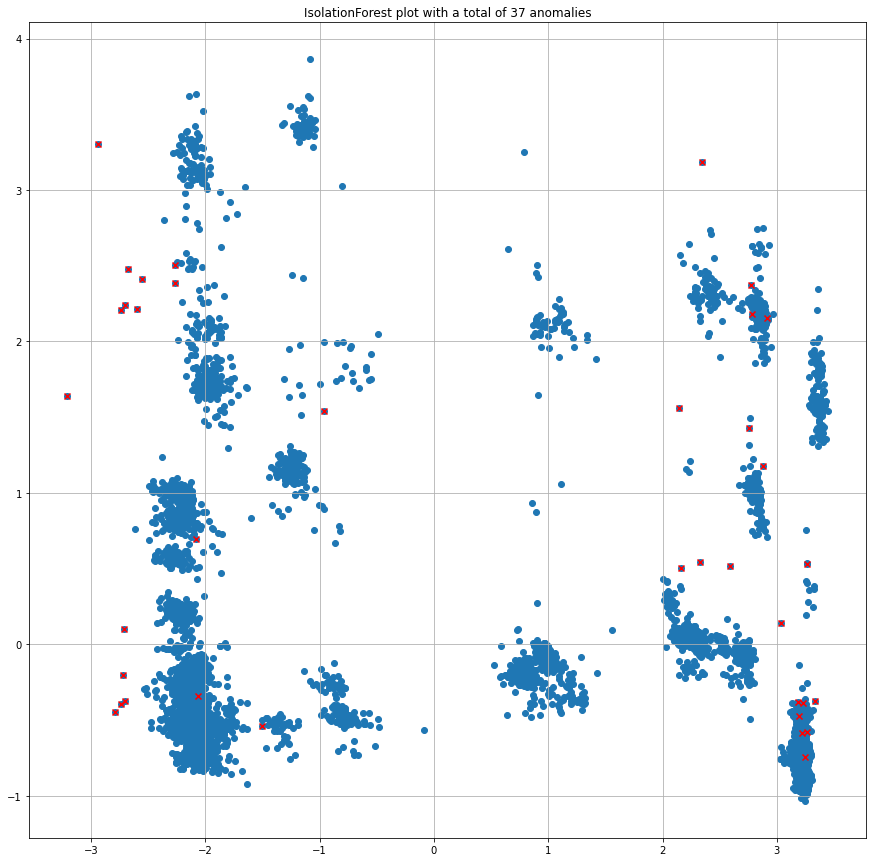

In [13]:
contamination = 0.005
max_features = 8
# contamination = "auto"

clf_if = IsolationForest(n_estimators=10,
                         warm_start=False,
                         contamination=contamination,
                         max_features=max_features,
                         random_state=np.random.RandomState(42))
clf_clone = clone(clf_if)
clf_if.fit(df_work_filtered_scaled)
pred = clf_if.predict(df_work_filtered_scaled)
print("Anomalies in dataset of size {} found: {}".format(len(list(pred)),list(pred).count(-1)))


# Get anomaly index and the values based on said index
anomaly_index_df = np.where(pred==-1)

transformer = PCA(n_components=2)
transformer.fit(df_work_filtered_scaled)
X_transformed = transformer.transform(df_work_filtered_scaled)
print("Initial shape: {}".format(df_work_filtered_scaled.shape))
print("PCA data shape: {}".format(X_transformed.shape))
# dataset_rf  = X_transformed

# Get anomalies based on index
values_rf = X_transformed[anomaly_index_df]

#Plot prediction on 2d
fig = plt.figure(figsize=(15,15))
plt.scatter(X_transformed[:,0], X_transformed[:,1])
plt.scatter(values_rf[:,0], values_rf[:,1], color='r', marker='x')
plt.title("IsolationForest plot with a total of {} anomalies".format(list(pred).count(-1)))
plt.grid()
plt.show()

(7237, 3)


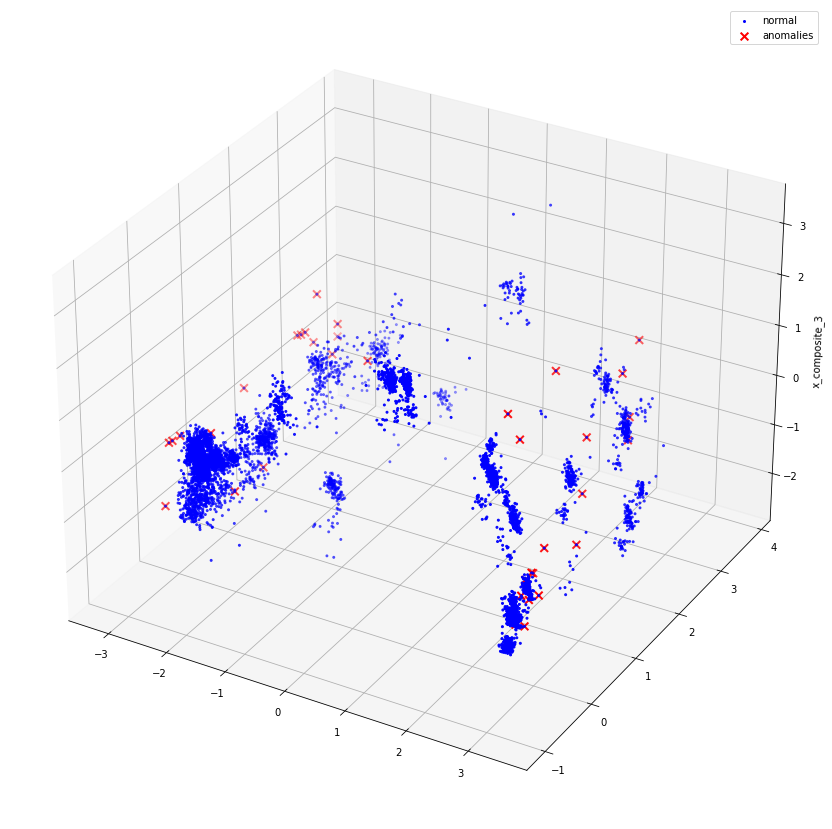

In [14]:
# Data preprocessing options (3d)
transformer = PCA(n_components=3)
transformer.fit(df_work_filtered_scaled)
X_transformed_3d = transformer.transform(df_work_filtered_scaled)
print(X_transformed_3d.shape)


# Plot 3D anomaly map
fig = plt.figure(figsize=(15,15))

ax = fig.add_subplot(111, projection='3d')
ax.set_zlabel("x_composite_3")
# Plot the compressed data points
ax.scatter(X_transformed_3d[:, 0], X_transformed_3d[:, 1], zs=X_transformed_3d[:, 2], s=4, lw=1, label="normal",c="blue")
# Plot x's for the ground truth outliers
ax.scatter(X_transformed_3d[anomaly_index_df,0],X_transformed_3d[anomaly_index_df,1], X_transformed_3d[anomaly_index_df,2],
           lw=2, s=60, marker="x", c="red", label="anomalies")
ax.legend()
plt.show()


In [15]:
df_anomalies_only = df_work_filtered_scaled.iloc[anomaly_index_df]
df_anomalies_only.shape


#%
# ff = filter_columns_wildcard(df_work_filtered_scaled,'sum', keep=True)
# plot_on_features(ff, pred)

(37, 1585)

Number of anomalies: 37


Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


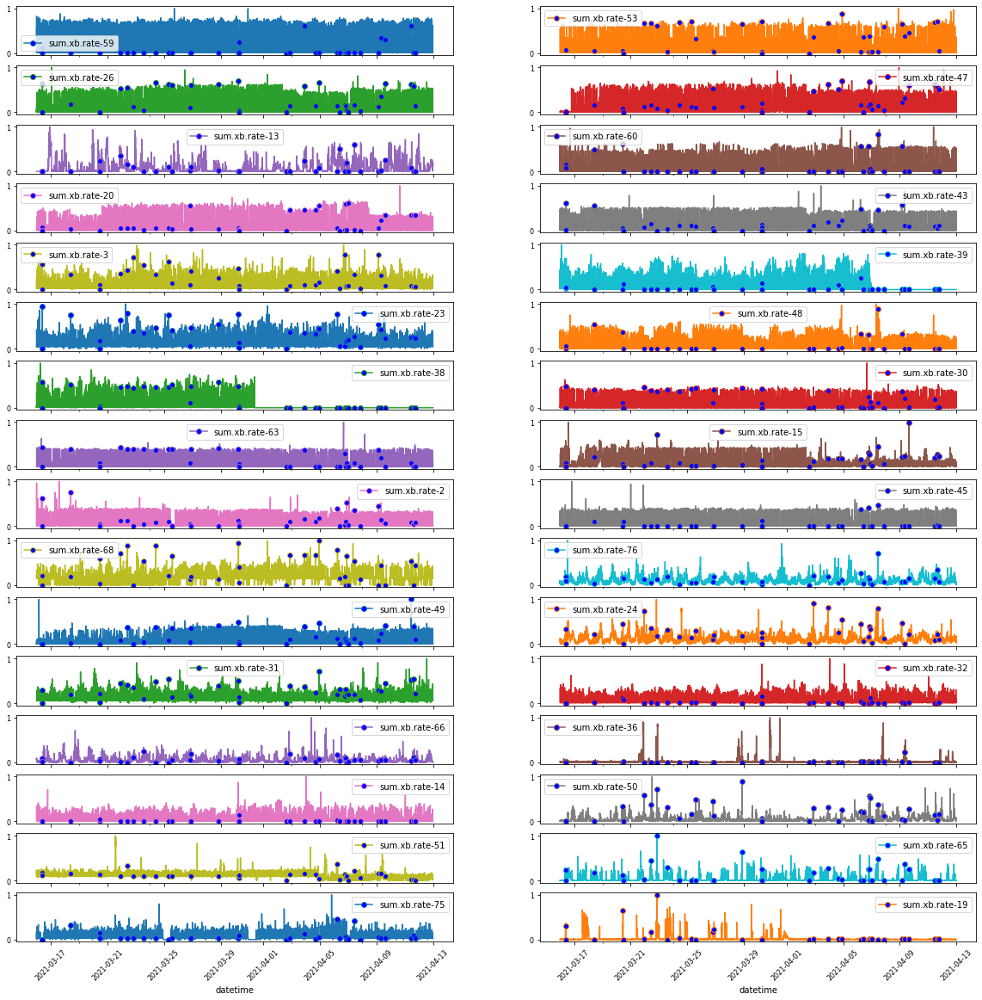

In [16]:
# Choose features to plot (Llorenc)
l_plot(df=df_work_filtered_scaled, pred=pred, title="IsolationForest plot with a total of {} anomalies".format(list(pred).count(-1)))

Run on testing set

In [17]:
# Window imp data range
# df_work_filtered_scaled_sample = df_work_filtered_scaled_testing.loc["2021-04-14 01:55:00":"2021-04-14 23:50:00"] # exact anomaly frames
df_work_filtered_scaled_sample = df_work_filtered_scaled_testing
pred_test = clf_if.predict(df_work_filtered_scaled_sample)
print("Anomalies in dataset of size {} found: {}".format(len(list(pred_test)),list(pred_test).count(-1)))



print(pred_test)
anomaly_index_df = np.where(pred_test==-1)
print(anomaly_index_df)
anomalies = df_work_filtered_scaled_sample.index[anomaly_index_df]

print(anomalies)

df_test = df_work_filtered_scaled_sample.copy(deep=True)
df_test['pred'] = pred_test

print(df_test[df_test['pred'] == -1])

# df_work_filtered_scaled_sample.loc[anomalies].plot()
# plt.show()

# plot_on_features(df_work_filtered_scaled_sample, pred_test)

Anomalies in dataset of size 694 found: 10
[ 1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1 -1  1  1  1  1  1  1 -1  1  1  1  1  1  1  1  1  1  1
  1  1  

Number of anomalies: 10


Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


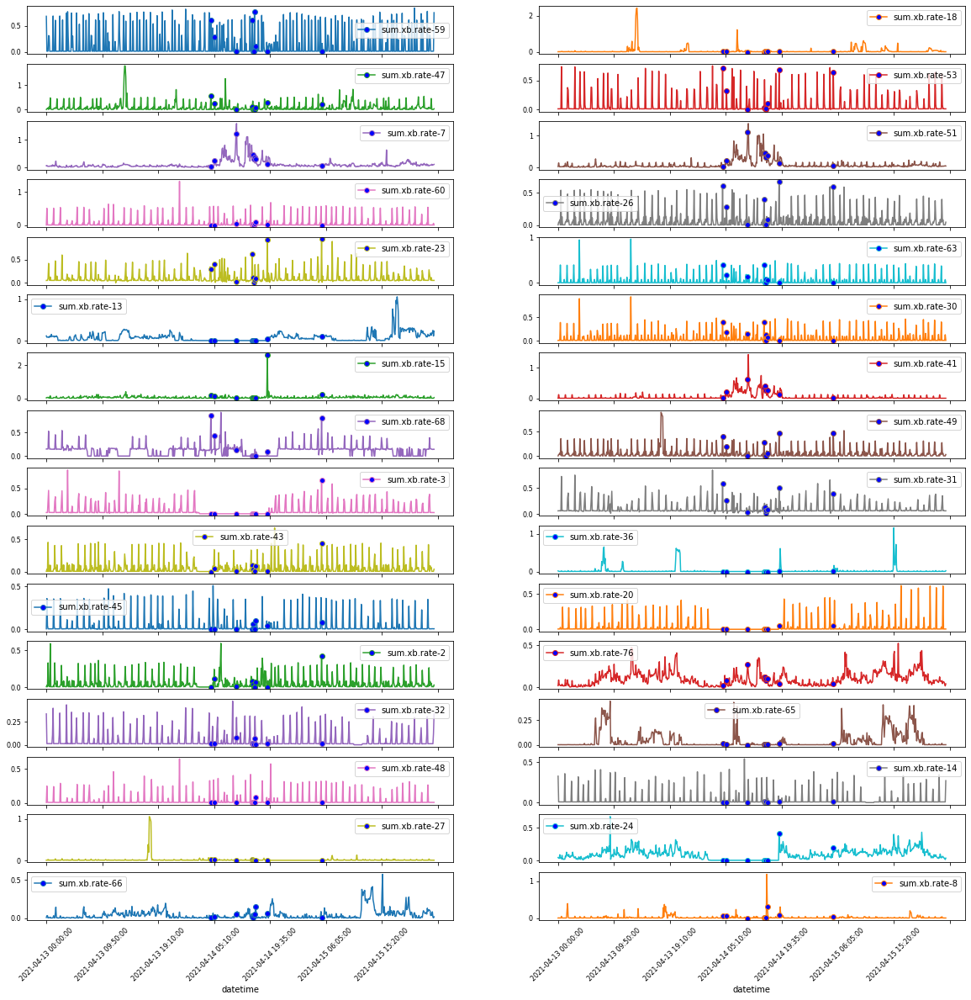

In [18]:

l_plot(df_work_filtered_scaled_sample, pred_test)

In [19]:
# Add anomalies to all columns from raw dataframe
# plot_on_features(dataset_raw, pred, anomay_label=-1) # todo: add list of columns to be ploted


Anomaly detection method experiments

In [20]:
# Define nine outlier detection tools to be compared

# initialize a set of detectors for LSCP
detector_list = [LOF(n_neighbors=5), LOF(n_neighbors=10), LOF(n_neighbors=15),
                 LOF(n_neighbors=20), LOF(n_neighbors=25), LOF(n_neighbors=30),
                 LOF(n_neighbors=35), LOF(n_neighbors=40), LOF(n_neighbors=45),
                 LOF(n_neighbors=50)]
# Parameters
contamination_est = 0.005
random_state = np.random.RandomState(42)
anomaly_label = 1
# random_state  =42
classifiers = {
    # 'Angle-based Outlier Detector (ABOD)':
    #     ABOD(contamination=contamination_est),
    'Cluster-based Local Outlier Factor (CBLOF)':
        CBLOF(contamination=contamination_est,
              check_estimator=False,
              n_clusters=8,
              alpha=0.9,
              beta=5,
              use_weights=False,
              random_state=random_state,
              n_jobs=-1),
    # 'Histogram-base Outlier Detection (HBOS)': HBOS(
    #     contamination=contamination_est),
    'Isolation Forest': IForest(n_estimators=20,
                                max_samples=0.7,
                                contamination=contamination_est,
                                random_state=42,
                                max_features=1.0,
                                bootstrap=False,
                                n_jobs=-1),
    # 'K Nearest Neighbors (KNN)': KNN(
    #     contamination=contamination_est),
    # 'Average KNN': KNN(method='mean',
    #                    contamination=contamination_est,
    #                    n_jobs=-1),
    # 'Local Outlier Factor (LOF)':
    #     LOF(n_neighbors=35, contamination=contamination_est,
    #         n_jobs=-1),
    # 'Minimum Covariance Determinant (MCD)': MCD(
    #     contamination=contamination_est,
    #     random_state=random_state),
    # 'One-class SVM (OCSVM)': OCSVM(contamination=contamination_est),
    # 'Locally Selective Combination (LSCP)': LSCP(
    #     detector_list,
    #     contamination=contamination_est,
    #     random_state=random_state),
#     'Auto Encoder (AE)':
#     AutoEncoder(hidden_neurons=[64, 32, 32, 64], epochs=30, batch_size=32, dropout_rate=0.2,
#                 contamination=contamination_est, verbose=1),
    'Variational auto encoder (VAE)':
    VAE(encoder_neurons=[128, 64, 32], decoder_neurons=[32, 64, 128], epochs=30, batch_size=32,
        dropout_rate=0.2,contamination=contamination_est, verbose=1),
}
# Show all detectors
for i, clf in enumerate(classifiers.keys()):
    print('Model', i + 1, clf)

Model 1 Cluster-based Local Outlier Factor (CBLOF)
Model 2 Isolation Forest
Model 3 Variational auto encoder (VAE)


1 fitting Cluster-based Local Outlier Factor (CBLOF)


'n_jobs' was deprecated in version 0.23 and will be removed in 1.0 (renaming of 0.25).


Completed Cluster-based Local Outlier Factor (CBLOF) training in:  6.099541664123535
Completed Cluster-based Local Outlier Factor (CBLOF) prediction in:  0.6326723098754883
Training decision function ...
[-3.47237699 -2.94070316 -2.33755792 ... -1.37012607 -1.37364025
 -1.60174032]


No handles with labels found to put in legend.


Initial shape: (7237, 1585)
PCA data shape: (7237, 2)
[0 0 0 ... 0 0 0]
Anomalies in dataset of size 7237 found: 37


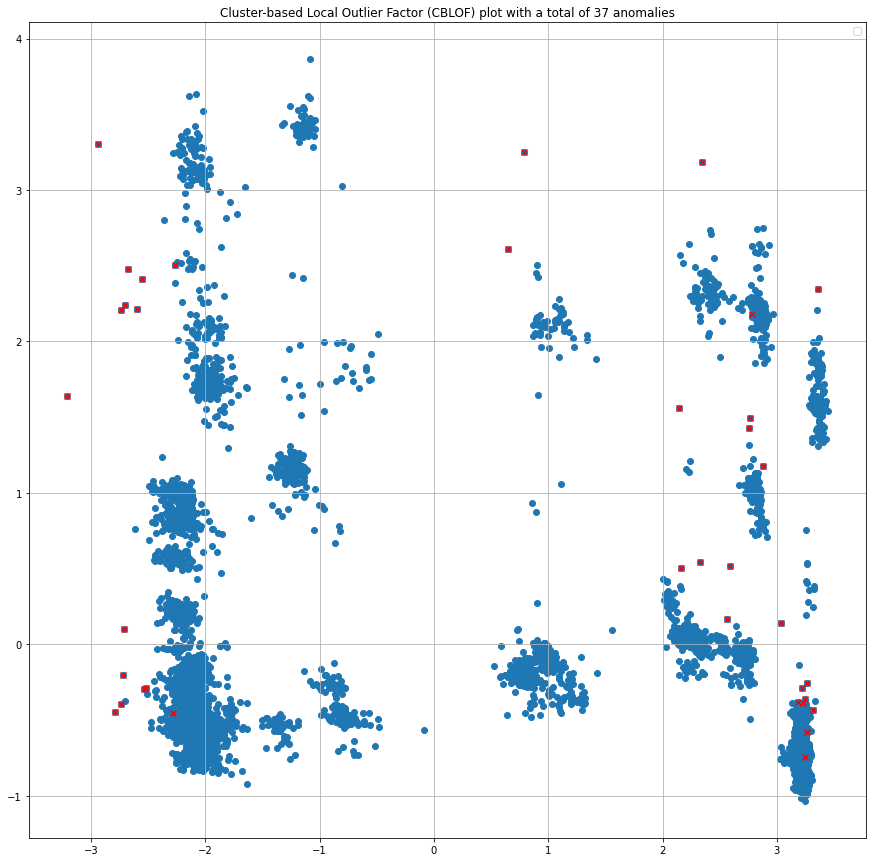

(7237, 3)


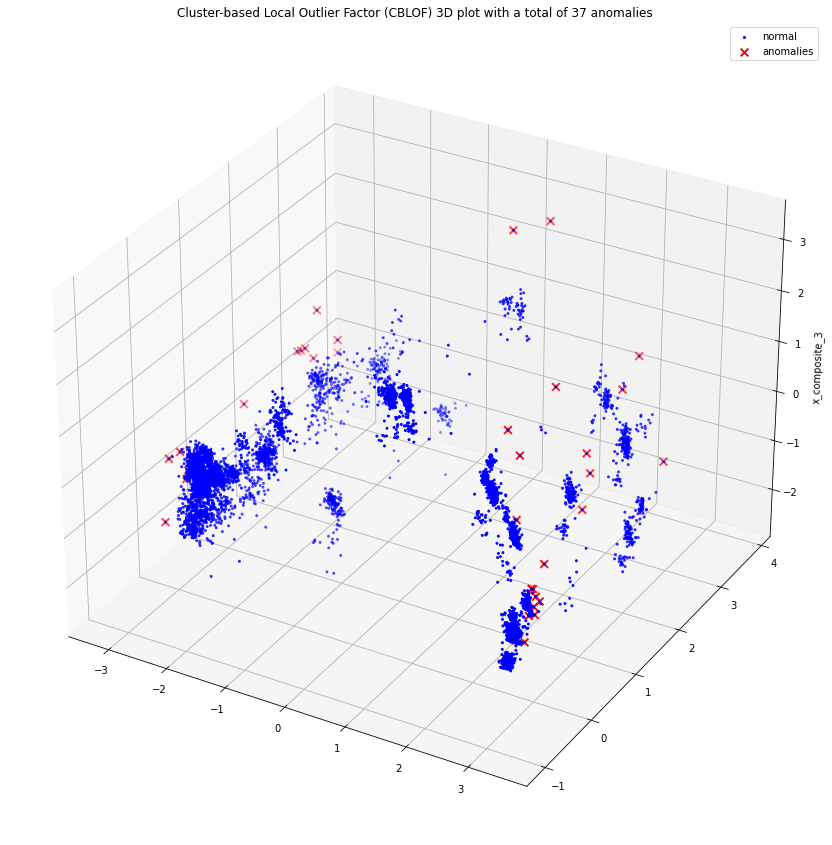

Number of anomalies: 37


Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


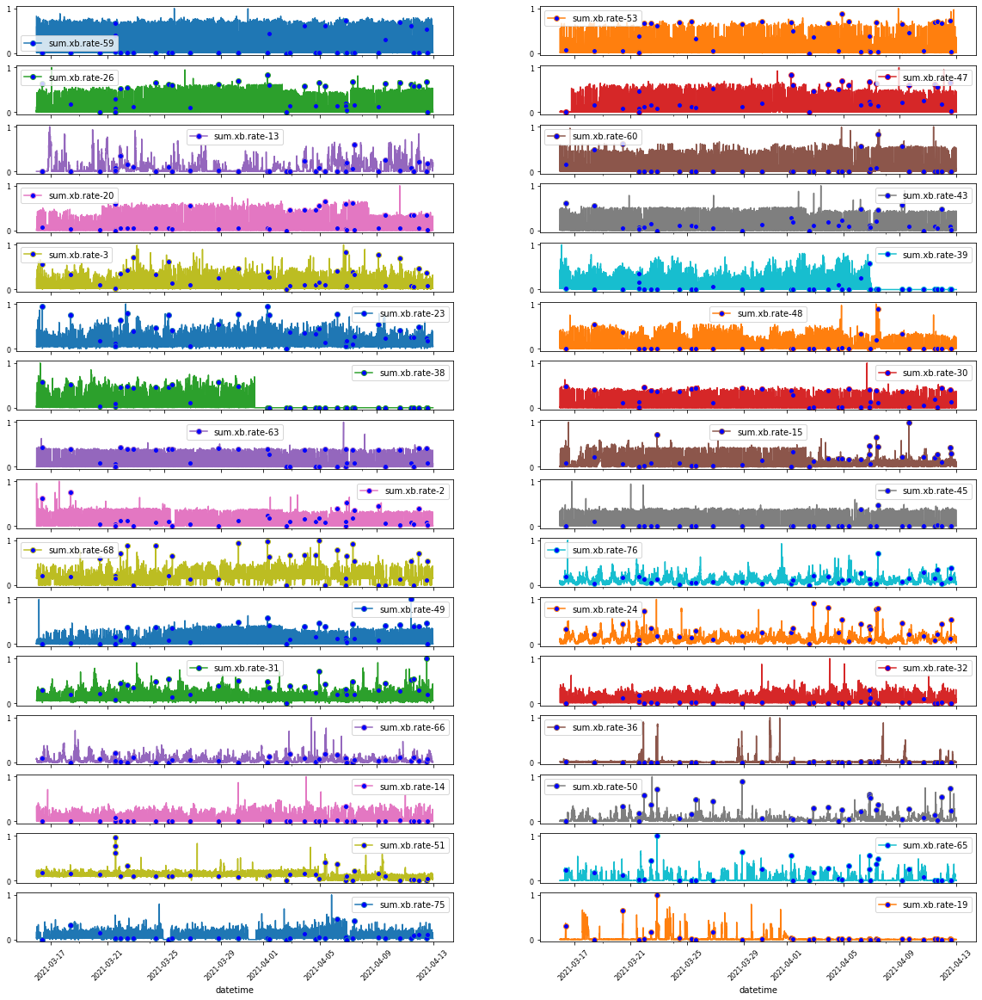

Anomalies in test dataset of size 694 found: 125
Number of anomalies: 125


Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


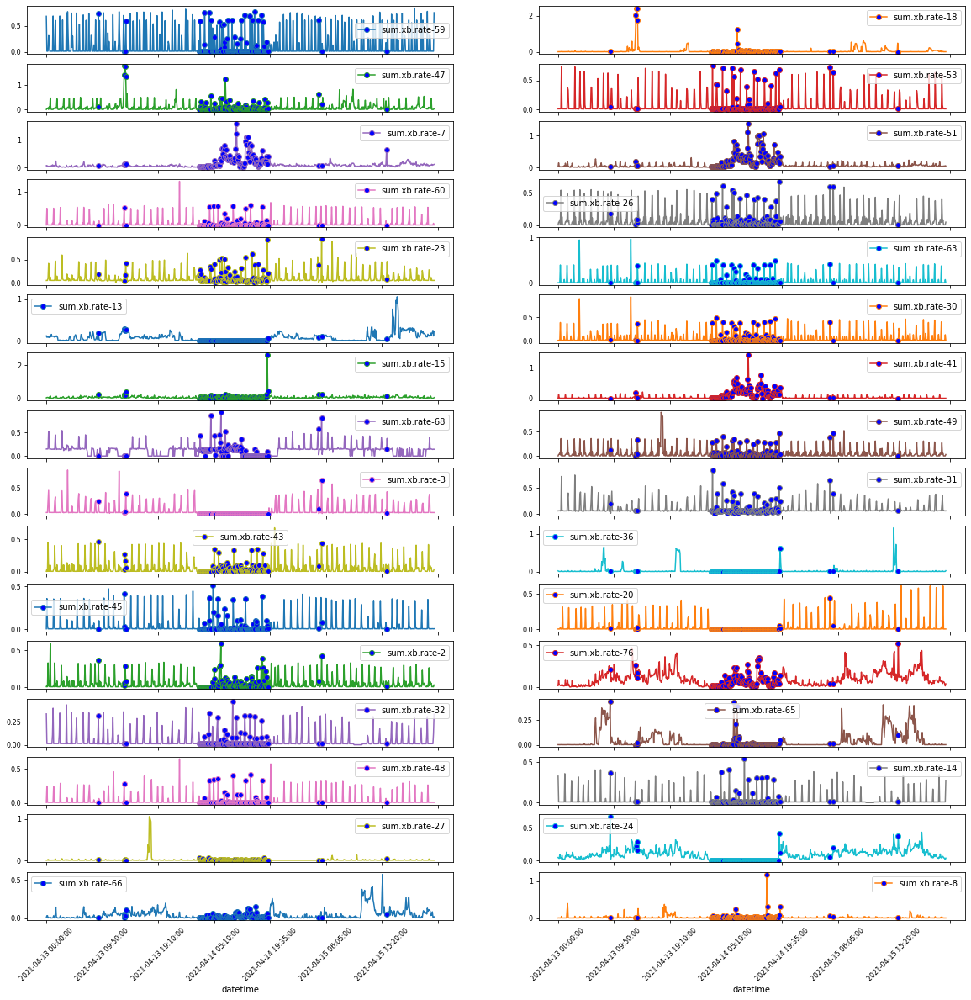

Saving model Cluster-based Local Outlier Factor (CBLOF) ...


'n_jobs' was deprecated in version 0.23 and will be removed in 1.0 (renaming of 0.25).
No contour levels were found within the data range.


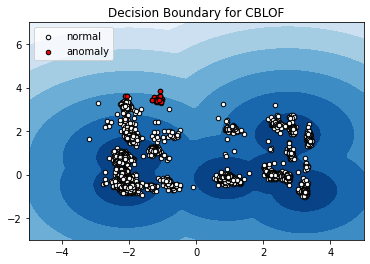

2 fitting Isolation Forest
Completed Isolation Forest training in:  3.222717761993408
Completed Isolation Forest prediction in:  1.4826927185058594
Training decision function ...
[0.1168516  0.11934867 0.11006062 ... 0.12860587 0.14308712 0.14022328]


No handles with labels found to put in legend.


Initial shape: (7237, 1585)
PCA data shape: (7237, 2)
[0 0 0 ... 0 0 0]
Anomalies in dataset of size 7237 found: 37


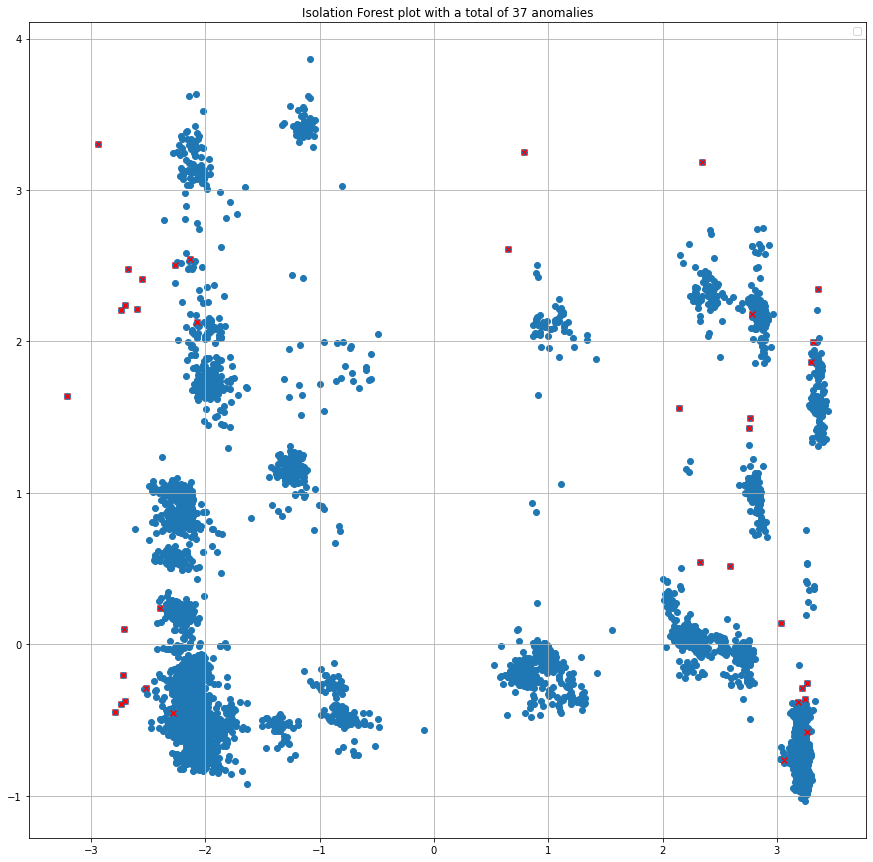

(7237, 3)


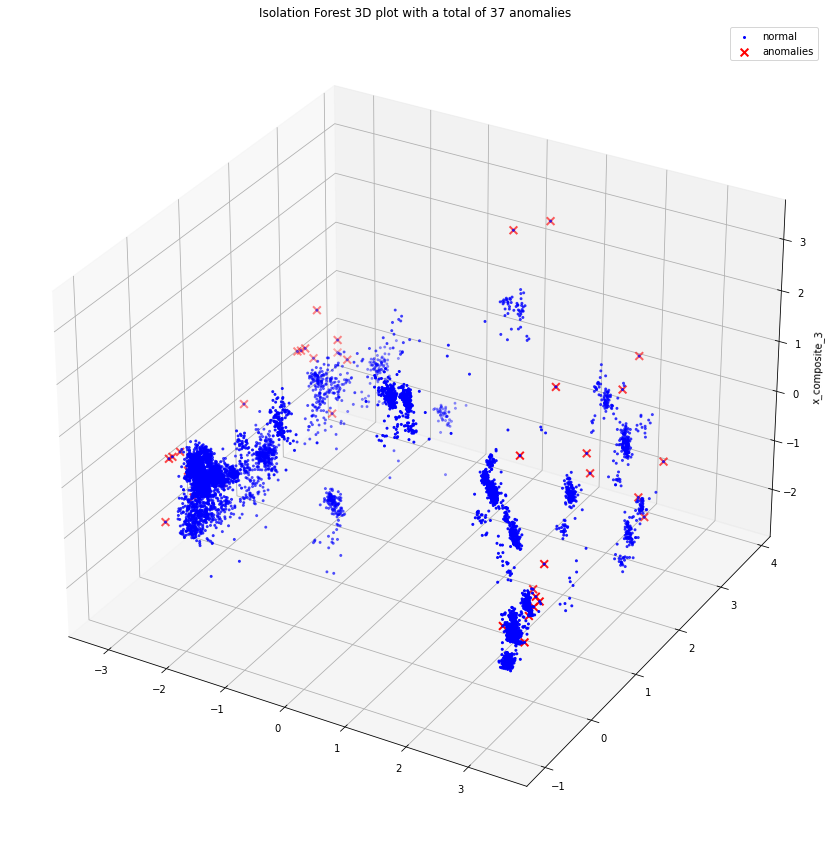

Number of anomalies: 37


Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


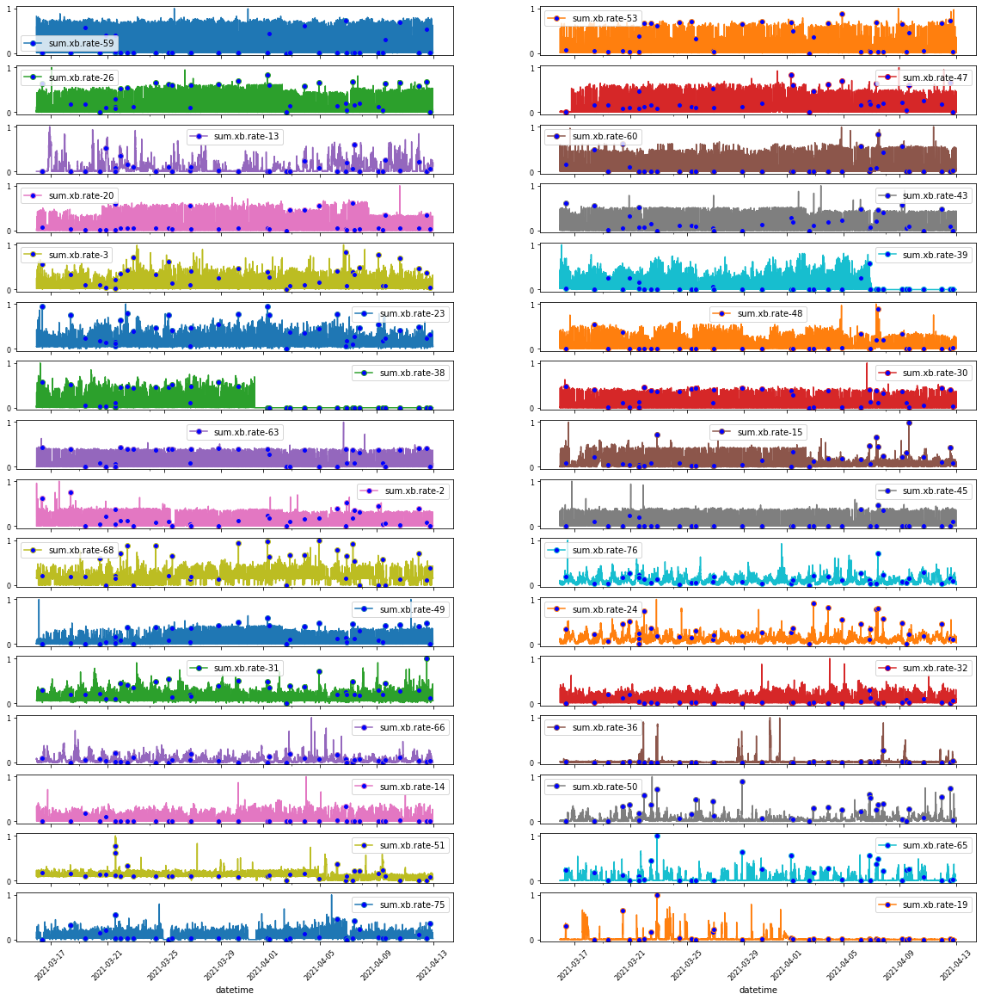

Anomalies in test dataset of size 694 found: 74
Number of anomalies: 74


Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


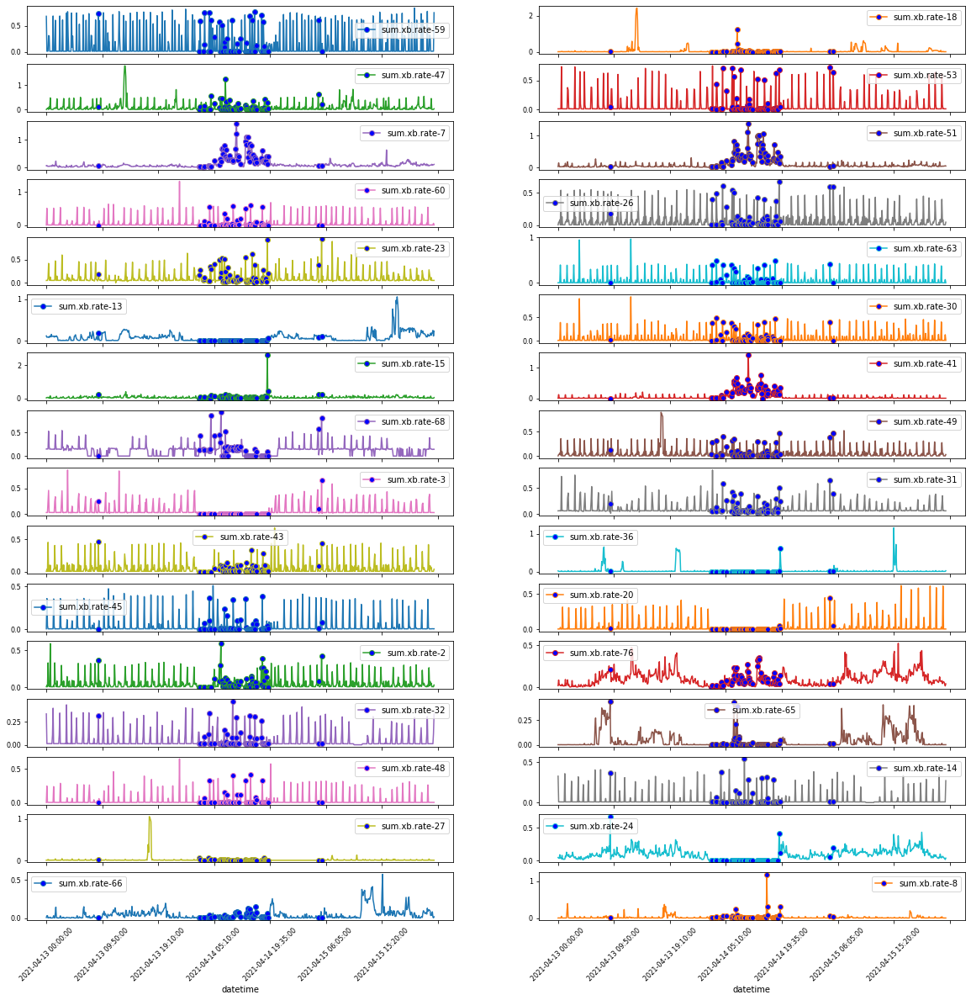

Saving model Isolation Forest ...


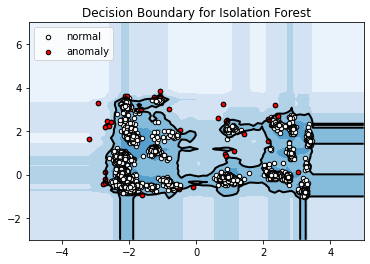

3 fitting Variational auto encoder (VAE)
Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 1585)]       0                                            
__________________________________________________________________________________________________
dense (Dense)                   (None, 1585)         2513810     input_1[0][0]                    
__________________________________________________________________________________________________
dense_1 (Dense)                 (None, 128)          203008      dense[0][0]                      
__________________________________________________________________________________________________
dropout (Dropout)               (None, 128)          0           dense_1[0][0]                    
_____________________________________________________

No handles with labels found to put in legend.


Initial shape: (7237, 1585)
PCA data shape: (7237, 2)
[0 0 0 ... 0 0 0]
Anomalies in dataset of size 7237 found: 37


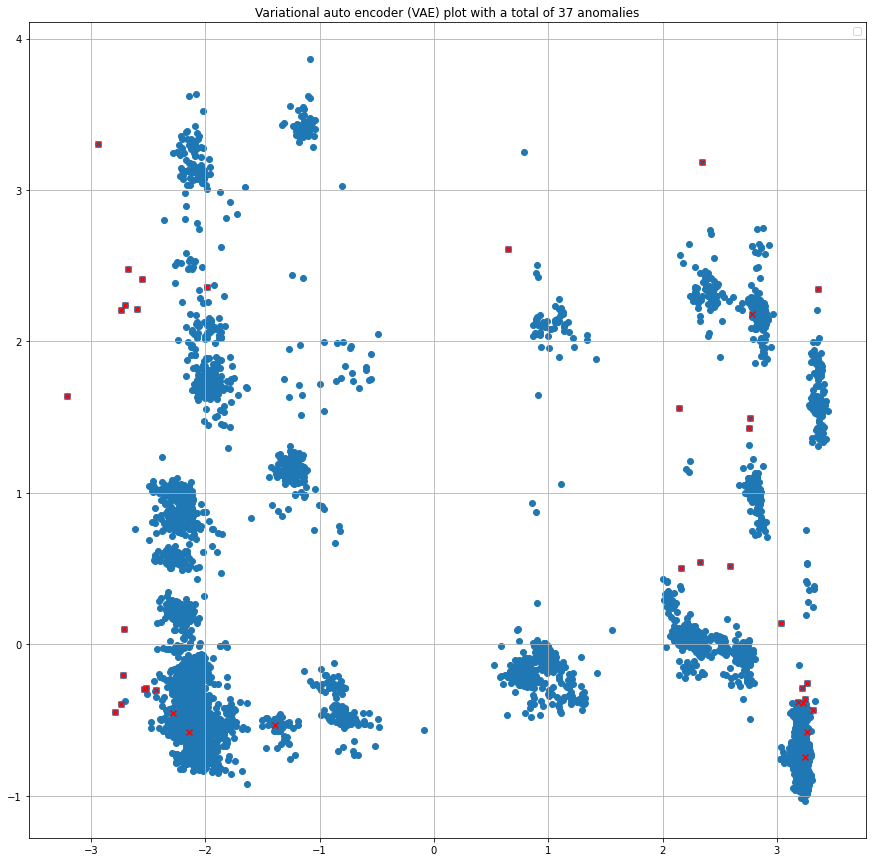

(7237, 3)


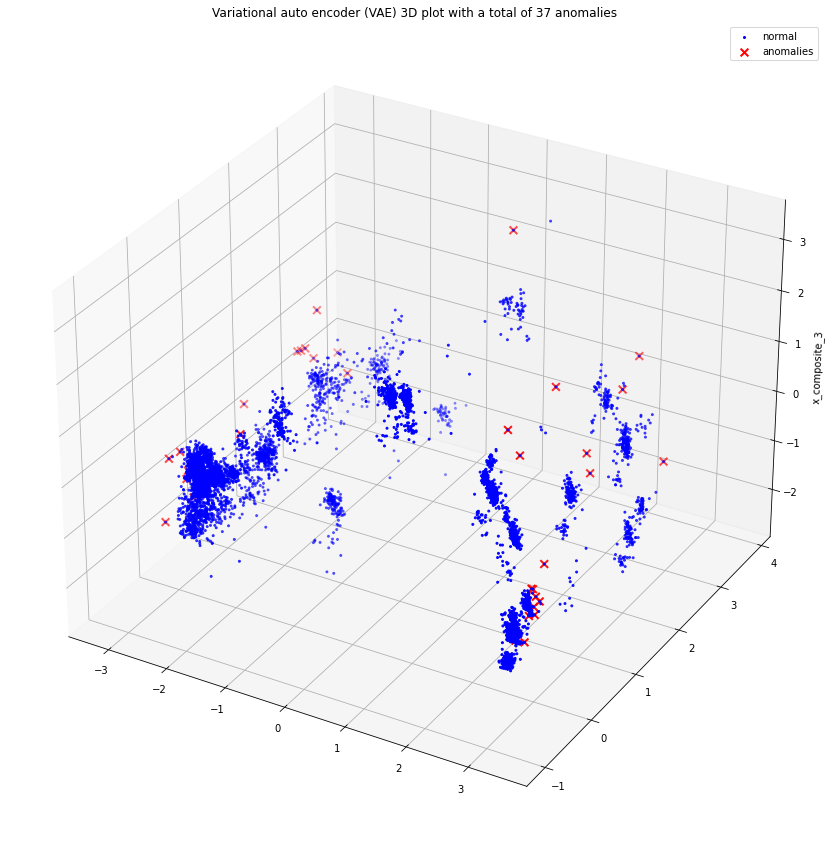

Number of anomalies: 37


Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


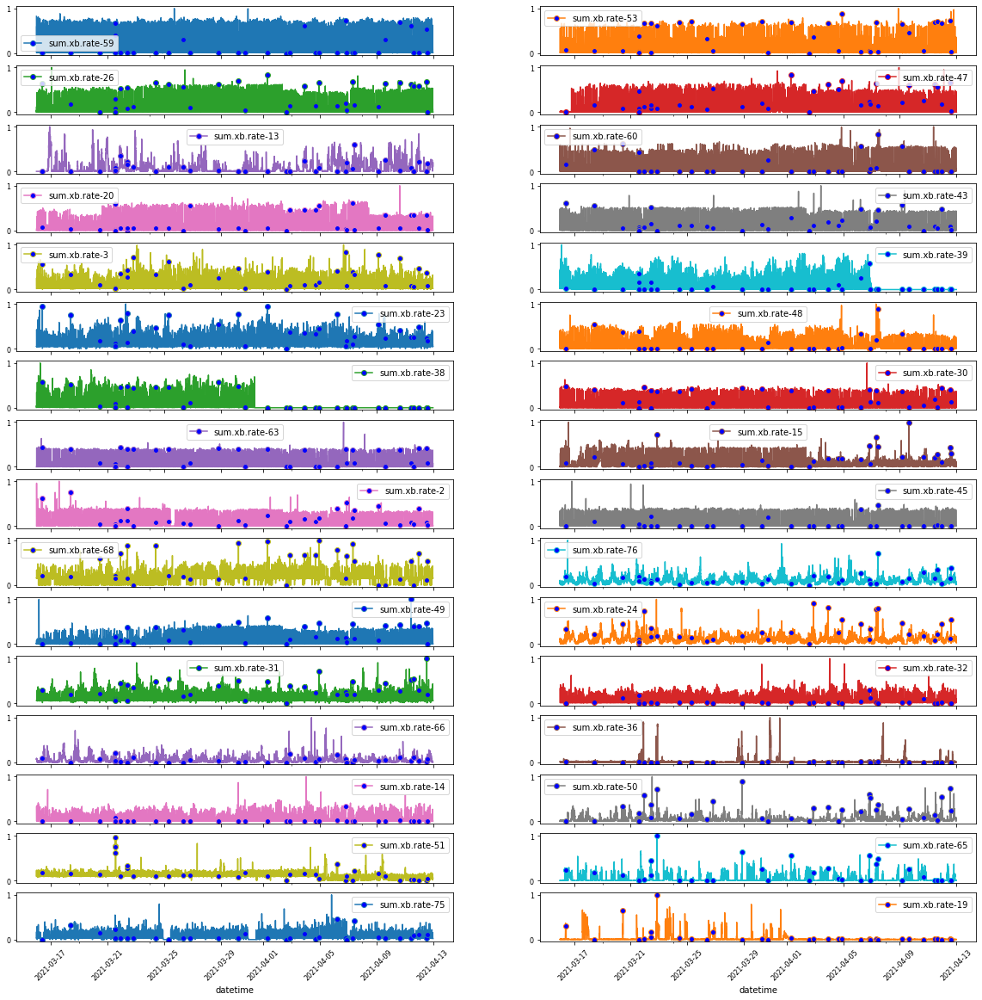

Anomalies in test dataset of size 694 found: 134
Number of anomalies: 134


Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


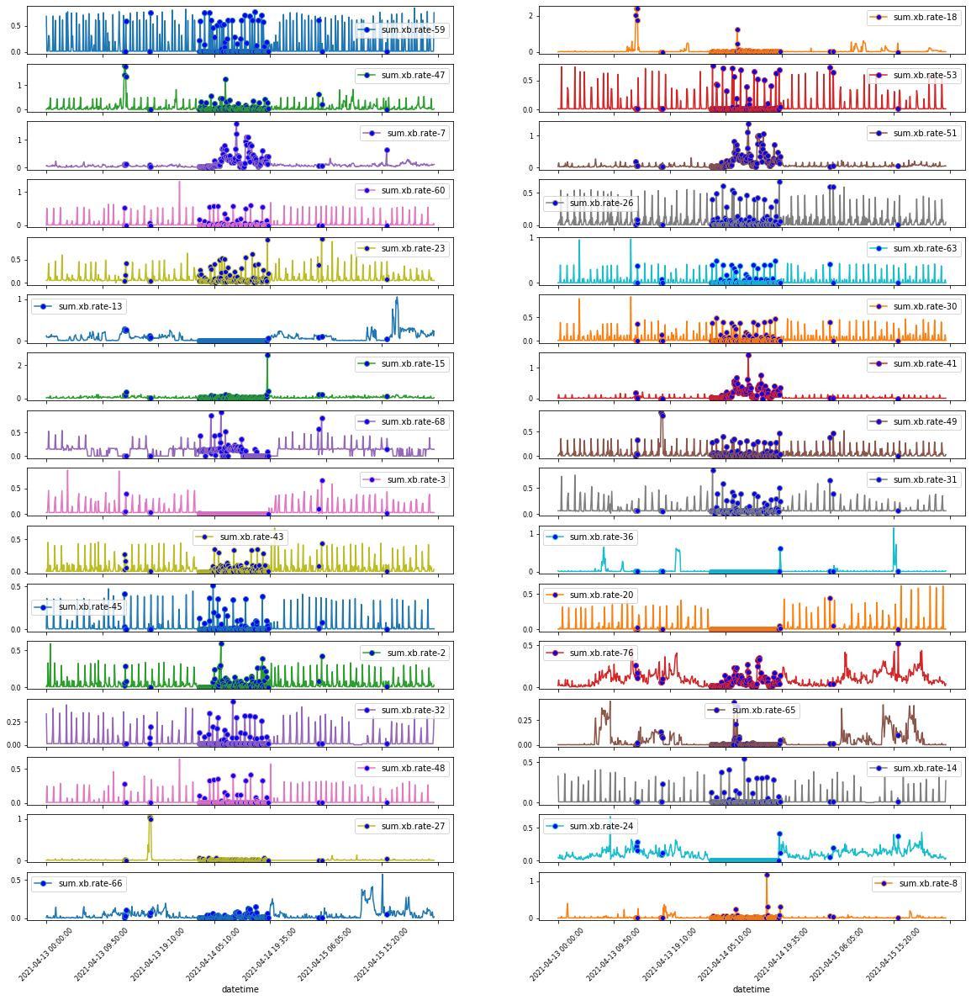

Saving model Variational auto encoder (VAE) ...
Exception <class 'TypeError'> while saving model VAE with ("can't pickle _thread.RLock objects",) ... trying workaround ...
Exception <class 'AttributeError'> while saving model VAE with ("'VAE' object has no attribute 'to_json'",), model save failed ...
DNN detected
Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 2)]          0                                            
__________________________________________________________________________________________________
dense_11 (Dense)                (None, 2)            6           input_3[0][0]                    
__________________________________________________________________________________________________
dense_12 (Dense)                (None, 2)            6           dense_11

No contour levels were found within the data range.


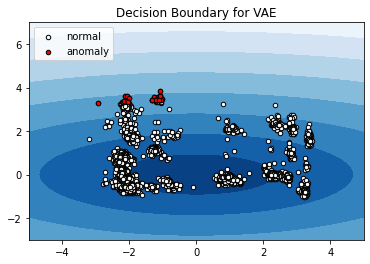

In [21]:
#Preprocess dataset
# dataset_cmp = dataset_raw
import time
# Fit the models with the GUIFI data and
classifier_stor = {}
predictions_training = {}
predictions_testing = {}
print("="*15)
for i, (clf_name, clf) in enumerate(classifiers.items()):
    start_training_time = time.time()
    print(i + 1, 'fitting', clf_name)
    clf.fit(df_work_filtered_scaled)
    stop_training_time = time.time() - start_training_time
    print("Completed {} training in:  {}".format(clf_name, stop_training_time))
    scores_pred = clf.decision_function(df_work_filtered_scaled) * -1
    predictions_training[f'{clf_name} df'] = scores_pred
    start_prediciton_time = time.time()
    y_pred_n = clf.predict(df_work_filtered_scaled)
    predictions_training[f'{clf_name} pred'] = y_pred_n
    stop_prediction_time = time.time() - start_prediciton_time
    print("Completed {} prediction in:  {}".format(clf_name, stop_prediction_time))
    print("Training decision function ...")
    print(scores_pred)

    transformer = PCA(n_components=2)
    transformer.fit(df_work_filtered_scaled)
    X_transformed = transformer.transform(df_work_filtered_scaled)
    print("Initial shape: {}".format(df_work_filtered_scaled.shape))
    print("PCA data shape: {}".format(X_transformed.shape))

    dataset_cmp  = X_transformed
    anomaly_index_n = np.where(y_pred_n==1)
    values_n = dataset_cmp[anomaly_index_n]
    print(y_pred_n)
    print("Anomalies in dataset of size {} found: {}".format(len(list(y_pred_n)),list(y_pred_n).count(anomaly_label)))
    # print(values)

    #Plot prediction on 2d
    fig = plt.figure(figsize=(15,15))
    plt.scatter(dataset_cmp[:,0], dataset_cmp[:,1])
    plt.scatter(values_n[:,0], values_n[:,1], color='r', marker='x')
    plt.legend()
    plt.grid()
    plt.title("{} plot with a total of {} anomalies".format(clf_name, list(y_pred_n).count(anomaly_label)))
    plt.show()

    # Data preprocessing options (3d)
    transformer_3d = PCA(n_components=3)
    transformer_3d.fit(df_work_filtered_scaled)
    X_transformed_3d_n = transformer_3d.transform(df_work_filtered_scaled)
    print(X_transformed_3d_n.shape)


    # Plot 3D anomaly map
    fig = plt.figure(figsize=(15,15))

    ax = fig.add_subplot(111, projection='3d')
    ax.set_zlabel("x_composite_3")
    # Plot the compressed data points
    ax.scatter(X_transformed_3d_n[:, 0], X_transformed_3d_n[:, 1], zs=X_transformed_3d_n[:, 2], s=4, lw=1, label="normal",c="blue")
    # Plot x's for the ground truth outliers
    ax.scatter(X_transformed_3d_n[anomaly_index_n,0],X_transformed_3d_n[anomaly_index_n,1], X_transformed_3d_n[anomaly_index_n,2],
               lw=2, s=60, marker="x", c="red", label="anomalies")
    ax.legend()
    plt.title("{} 3D plot with a total of {} anomalies".format(clf_name, list(y_pred_n).count(anomaly_label)))
    plt.show()

    l_plot(df=df_work_filtered_scaled, pred=y_pred_n, anomaly_label=anomaly_label, title="{} feature with a total of {} anomalies".format(clf_name, list(y_pred_n).count(anomaly_label)))

    # Run on test set
    y_pred_test = clf.predict(df_work_filtered_scaled_testing)
    predictions_testing[f'{clf_name} pred test'] = y_pred_test
    scores_pred_test = clf.decision_function(df_work_filtered_scaled_testing) * -1
    predictions_testing[f'{clf_name} df test'] = scores_pred_test
    print("Anomalies in test dataset of size {} found: {}".format(len(list(y_pred_test)),list(y_pred_test).count(anomaly_label)))
    l_plot(df=df_work_filtered_scaled_testing, pred=y_pred_test, anomaly_label=anomaly_label, title="{} feature with a total of {} anomalies, test data".format(clf_name, list(y_pred_n).count(anomaly_label)))

    
    print(f"Saving model {clf_name} ...")
    classifier_stor[clf_name] = clf
    short_name = clf_name.split('(')[-1].split(')')[0] # todo nicer short name gen
    try:
        dump(clf, os.path.join(model_dir,f'clf_{short_name}.joblib'))
    except Exception as inst:
        print(f"Exception {type(inst)} while saving model {short_name} with {inst.args} ... trying workaround ...")
        # serialize to JSON
        # serialize weights to HDF5
        try:
            json_file = clf.to_json()
            with open(os.path.join(model_dir,f'clf_{short_name}.json'), "w") as file:
               file.write(json_file)
            clf.save_weights(os.path.join(model_dir,f'clf_{short_name}.hdf5'))
        except Exception as inst:
            print(f"Exception {type(inst)} while saving model {short_name} with {inst.args}, model save failed ...")
    #Plotting decision boundary
    decision_boundary(clf,
                      df_work_filtered_scaled,
                      method=short_name,
                      anomaly_label=1)
    print("="*15)

In [22]:
# Saving results of experiments
exp_name = "dipet_exp_v5_2"
df_pred_training = pd.DataFrame.from_dict(predictions_training)
df_pred_testing = pd.DataFrame.from_dict(predictions_testing)
if os.path.isfile(os.path.join(model_dir,f'{exp_name}_training.csv')):
    print("Training exists ....")
else:
    df_pred_training.to_csv(os.path.join(model_dir,f'{exp_name}_training.csv'))

if os.path.isfile(os.path.join(model_dir,f'{exp_name}_testing.csv')):
    print("Testing exists ....")
else:
    df_pred_testing.to_csv(os.path.join(model_dir,f'{exp_name}_testing.csv'))

In [23]:
df_pred_training

,Cluster-based Local Outlier Factor (CBLOF) df,Cluster-based Local Outlier Factor (CBLOF) pred,Isolation Forest df,Isolation Forest pred,Variational auto encoder (VAE) df,Variational auto encoder (VAE) pred
0,-3.472377,0,0.116852,0,-37.301887,0
1,-2.940703,0,0.119349,0,-36.157001,0
2,-2.337558,0,0.110061,0,-33.771624,0
3,-3.368482,0,0.097991,0,-41.847827,0
4,-2.669641,0,0.128182,0,-37.163701,0
...,...,...,...,...,...,...
7232,-2.297543,0,0.130319,0,-32.353945,0
7233,-1.451093,0,0.128630,0,-26.500338,0
7234,-1.370126,0,0.128606,0,-25.184846,0
7235,-1.373640,0,0.143087,0,-24.968591,0


In [24]:
df_pred_testing

,Cluster-based Local Outlier Factor (CBLOF) pred test,Cluster-based Local Outlier Factor (CBLOF) df test,Isolation Forest pred test,Isolation Forest df test,Variational auto encoder (VAE) pred test,Variational auto encoder (VAE) df test
0,0,-2.607258,0,0.141849,0,-34.254124
1,0,-2.273915,0,0.128467,0,-33.118541
2,0,-1.462713,0,0.140534,0,-25.511301
3,0,-2.072859,0,0.136076,0,-27.494395
4,0,-3.139295,0,0.109653,0,-38.199551
...,...,...,...,...,...,...
689,0,-2.649056,0,0.133036,0,-51.377894
690,0,-2.606739,0,0.125721,0,-50.667739
691,0,-2.659656,0,0.133036,0,-51.157484
692,0,-2.891089,0,0.126462,0,-52.385705


SHAP analysis

In [25]:

df_work_filtered_scaled

,processes-23,loadavg-m1-23,softirq.rate-23,intr.rate-23,system.rate-23,idle.rate-23,user.rate-23,ctxt.rate-23,nr_slab_unreclaimable-23,nr_anon_pages-23,...,eth.txp.rate-62,eth.rxp.rate-62,txb.rate-62,rxb.rate-62,txp.rate-62,rxp.rate-62,sum.xb.rate-62,diff.xb.rate-62,sum.xp.rate-62,diff.xp.rate-62
datetime,,,,,,,,,,,,,,,,,,,,,
2021-03-16 00:00:00,0.877193,0.057143,0.119077,0.126785,0.118128,0.144982,0.086546,0.112358,0.941169,0.645110,...,0.043362,0.006176,0.013045,0.000288,0.043362,0.006176,0.008838,0.651142,0.041292,0.658631
2021-03-16 00:05:00,0.877193,0.071429,0.118275,0.121665,0.120610,0.143189,0.127555,0.104891,0.941426,0.644716,...,0.002013,0.010727,0.000088,0.005339,0.002013,0.010727,0.001898,0.661708,0.005708,0.692145
2021-03-16 00:10:00,0.877193,0.200000,0.116830,0.124893,0.115025,0.144250,0.107891,0.106704,0.941941,0.644716,...,0.000403,0.006196,0.000033,0.000290,0.000403,0.006196,0.000122,0.659982,0.002613,0.691976
2021-03-16 00:15:00,0.877193,0.057143,0.106399,0.121204,0.127230,0.143941,0.103364,0.101450,0.942456,0.645110,...,0.004612,0.018808,0.000199,0.014212,0.004612,0.018808,0.005030,0.664733,0.010983,0.692657
2021-03-16 00:20:00,0.877193,0.057143,0.114744,0.118868,0.125162,0.143024,0.114748,0.102880,0.942585,0.645110,...,0.000391,0.006090,0.000033,0.000284,0.000391,0.006090,0.000120,0.659980,0.002564,0.691952
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-04-12 23:35:00,0.894737,0.014286,0.154544,0.147502,0.178536,0.137398,0.156792,0.150332,0.934861,0.990536,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.659903,0.000000,0.690350
2021-04-12 23:40:00,0.877193,0.142857,0.152136,0.146945,0.148539,0.141530,0.112290,0.150366,0.934861,0.980678,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.659903,0.000000,0.690350
2021-04-12 23:45:00,0.877193,0.214286,0.155346,0.150927,0.156607,0.143627,0.184864,0.151680,0.934861,0.979890,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.659903,0.000000,0.690350


In [26]:
# Subsample the data for shap

# df_work_filtered_scaled_sample = df_work_filtered_scaled.sample(frac = 0.05)
df_work_filtered_scaled_sample = df_work_filtered_scaled_testing.loc["2021-04-14 01:55:00":"2021-04-14 23:50:00"] # exact anomaly frames
print(f"Sample size for shape analysis: {df_work_filtered_scaled_testing.shape}")
df_work_filtered_scaled_testing

Sample size for shape analysis: (694, 1585)


,processes-23,loadavg-m1-23,softirq.rate-23,intr.rate-23,system.rate-23,idle.rate-23,user.rate-23,ctxt.rate-23,nr_slab_unreclaimable-23,nr_anon_pages-23,...,eth.txp.rate-62,eth.rxp.rate-62,txb.rate-62,rxb.rate-62,txp.rate-62,rxp.rate-62,sum.xb.rate-62,diff.xb.rate-62,sum.xp.rate-62,diff.xp.rate-62
datetime,,,,,,,,,,,,,,,,,,,,,
2021-04-13 00:00:00,0.877193,0.128571,0.156309,0.147367,0.151642,0.138758,0.139715,0.149279,0.935118,0.979890,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.659903,0.0,0.69035
2021-04-13 00:05:00,0.877193,0.000000,0.149248,0.143671,0.163227,0.140927,0.157697,0.146988,0.935376,0.980678,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.659903,0.0,0.69035
2021-04-13 00:10:00,0.877193,0.185714,0.132397,0.141748,0.148125,0.139933,0.139198,0.139662,0.935891,0.980678,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.659903,0.0,0.69035
2021-04-13 00:15:00,0.877193,0.028571,0.158235,0.155173,0.163848,0.150407,0.132600,0.155568,0.936921,0.980284,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.659903,0.0,0.69035
2021-04-13 00:20:00,0.859649,0.385714,0.145878,0.143442,0.154332,0.128346,0.177361,0.146328,0.935891,0.980284,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.659903,0.0,0.69035
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-04-15 23:40:00,0.877193,0.585714,0.149087,0.142930,0.145849,0.140721,0.123545,0.147636,0.917611,1.007098,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.659903,0.0,0.69035
2021-04-15 23:45:00,0.877193,0.042857,0.140582,0.138113,0.139229,0.141164,0.136611,0.140214,0.918126,1.006309,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.659903,0.0,0.69035
2021-04-15 23:50:00,0.877193,0.742857,0.145878,0.139956,0.144815,0.141303,0.123674,0.139423,0.917739,1.006309,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.659903,0.0,0.69035


In [27]:
# %%capture output
# Isolation forest shap
clf_if5 = classifier_stor['Isolation Forest']
print("Start Shap explainer Isolation Forest...")
explainer_if5 = shap.Explainer(clf_if5.predict, df_work_filtered_scaled_sample)
shap_values_if5 = explainer_if5(df_work_filtered_scaled_sample, max_evals=2821)
print("Analysis finished.")


Start Shap explainer Isolation Forest...


Permutation explainer: 164it [15:53:20, 350.92s/it]                           

Analysis finished.


In [28]:
shap.initjs()

In [29]:
# shap_values
clf_if5

IForest(behaviour='old', bootstrap=False, contamination=0.005,
    max_features=1.0, max_samples=0.7, n_estimators=20, n_jobs=-1,
    random_state=42, verbose=0)

In [30]:
sample_pred = clf_if5.predict(df_work_filtered_scaled_sample)

sample_anomaly_index = np.where(sample_pred==1)
sample_normal_index = np.where(sample_pred!=1)
print("Index of found anomalies")
print(sample_anomaly_index)
print("Normal index")
print(sample_normal_index)
print("Sample columns")
print(df_work_filtered_scaled_sample.columns)


Index of found anomalies
(array([  2,   3,   9,  10,  11,  18,  19,  20,  21,  22,  29,  38,  39,
        40,  42,  43,  44,  46,  47,  48,  49,  50,  51,  52,  54,  55,
        56,  57,  60,  61,  62,  66,  67,  68,  69,  70,  71,  72,  75,
        84,  85,  86,  87,  88,  89,  90,  91,  92,  93,  94,  95,  96,
        97,  98,  99, 100, 101, 102, 103, 112, 113, 114, 115, 116, 117,
       118, 119, 120, 121, 123, 125]),)
Normal index
(array([  0,   1,   4,   5,   6,   7,   8,  12,  13,  14,  15,  16,  17,
        23,  24,  25,  26,  27,  28,  30,  31,  32,  33,  34,  35,  36,
        37,  41,  45,  53,  58,  59,  63,  64,  65,  73,  74,  76,  77,
        78,  79,  80,  81,  82,  83, 104, 105, 106, 107, 108, 109, 110,
       111, 122, 124, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135,
       136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148,
       149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161,
       162]),)
Sample columns
Index(['processes-23', 'lo

In [31]:
# Saving shape explainer instance and shap values
import pickle

#Shape explainer
shap_explainer = os.path.join(model_dir,f'{exp_name}_explainer_shap.sav')
pickle.dump(explainer_if5, open(shap_explainer, 'wb'))

# Load explainer
# load_explainer = pickle.load(open(shap_explainer, 'rb'))


# Shap Values
shap_values_file = os.path.join(model_dir,f'{exp_name}_shap_values.sav')
pickle.dump(shap_values_if5, open(shap_values_file, 'wb'))

# Load shap values
# load_shap_values = pickle.load(open(shap_values_file, 'rb'))

Annomaly loc 2


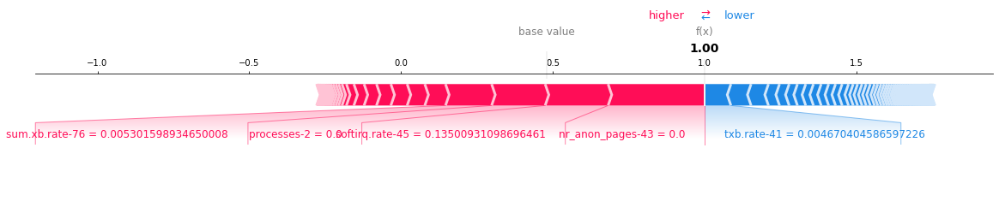

Annomaly loc 3


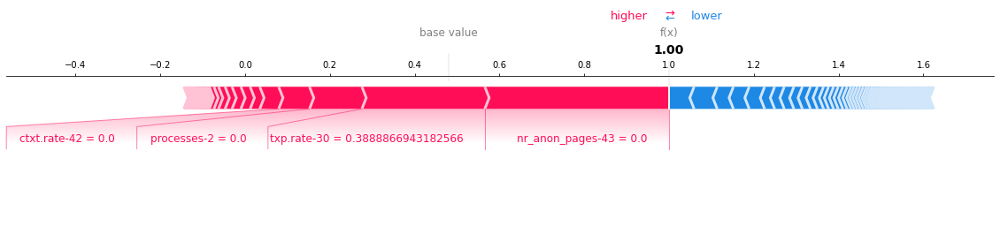

Annomaly loc 9


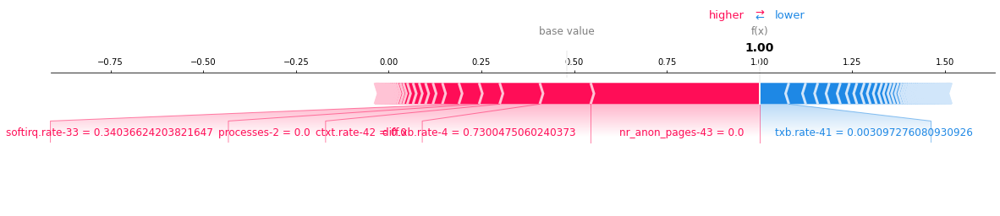

Annomaly loc 10


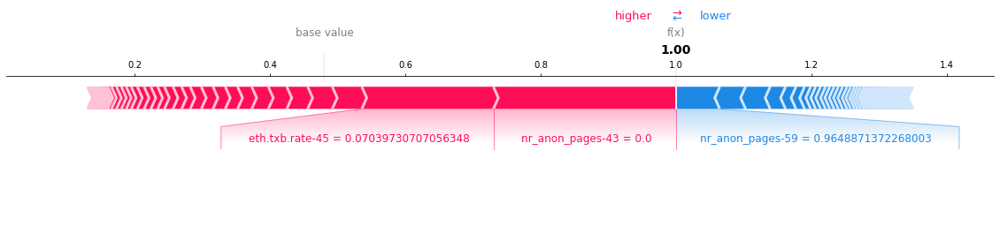

Annomaly loc 11


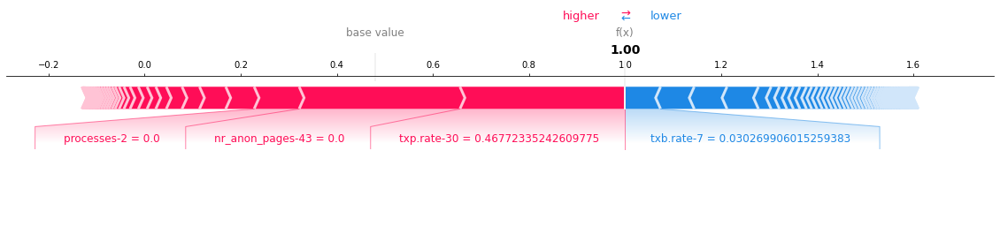

Annomaly loc 18


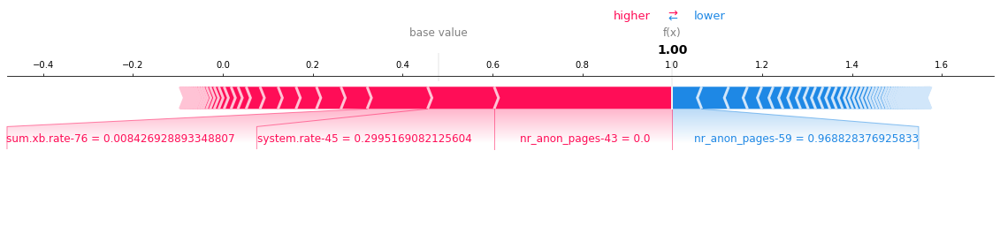

Annomaly loc 19


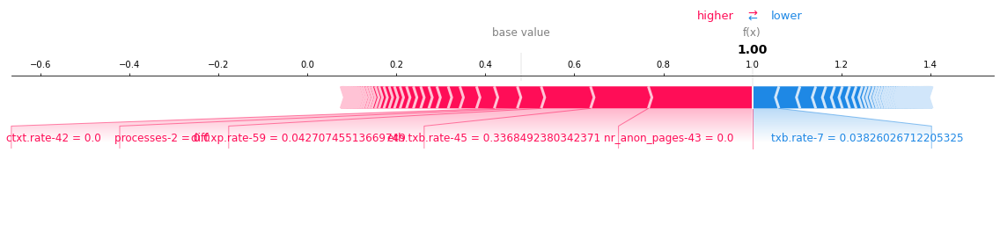

Annomaly loc 20


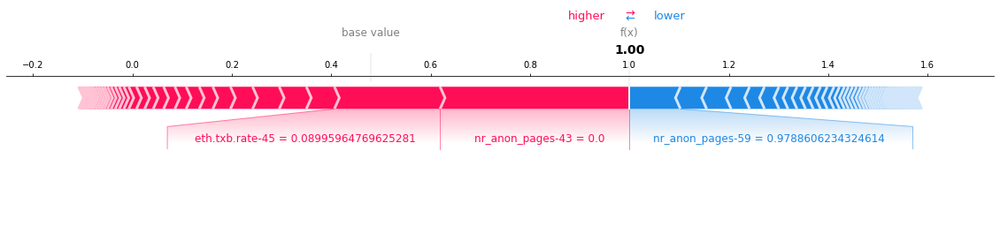

Annomaly loc 21


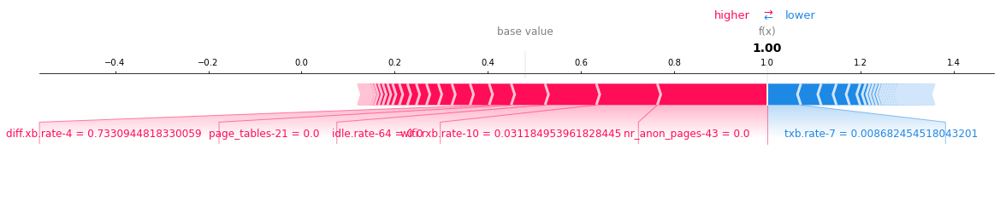

Annomaly loc 22


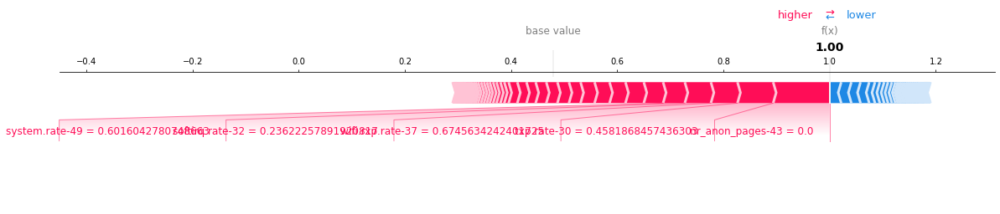

Annomaly loc 29


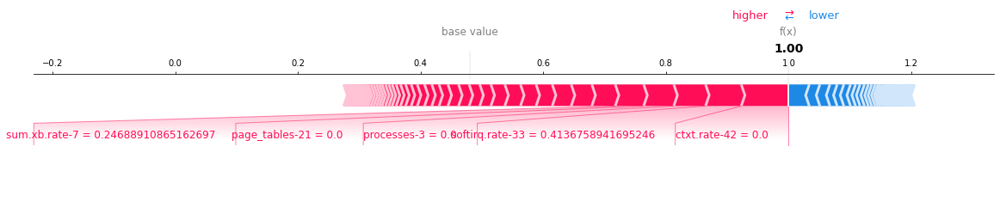

Annomaly loc 38


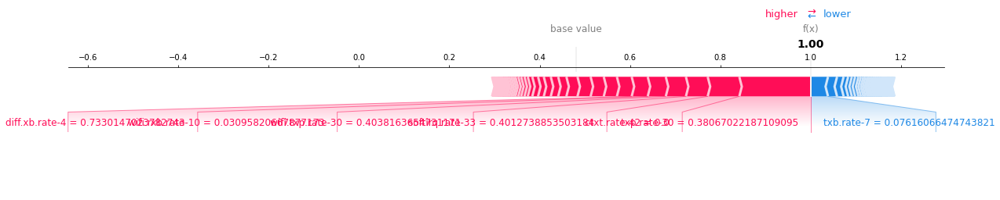

Annomaly loc 39


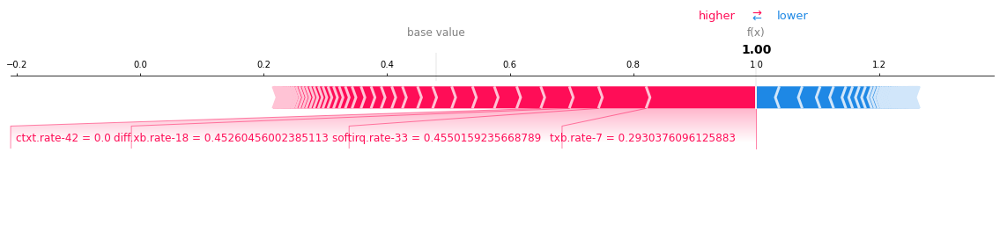

Annomaly loc 40


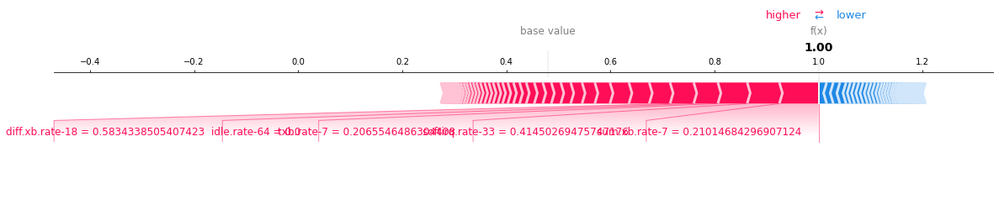

Annomaly loc 42


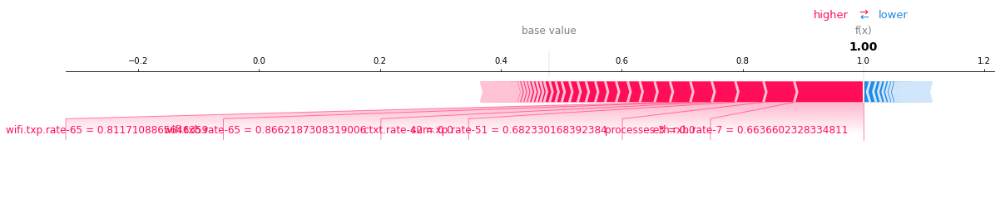

Annomaly loc 43


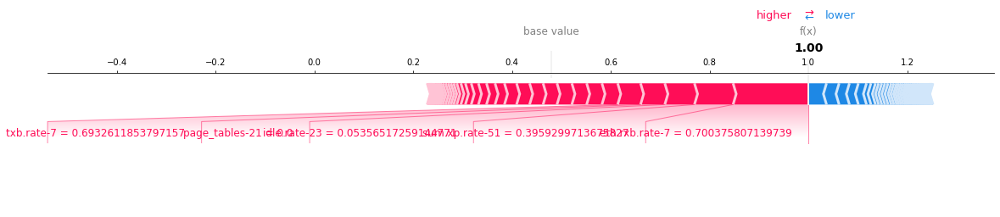

Annomaly loc 44


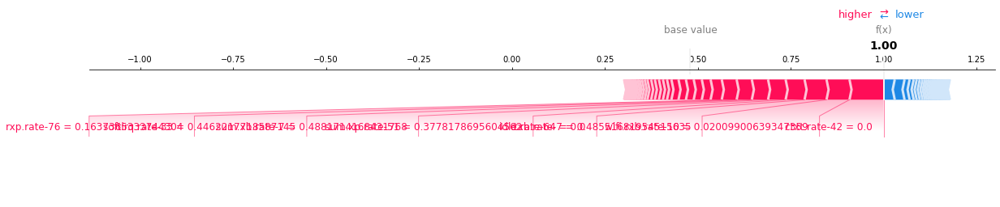

Annomaly loc 46


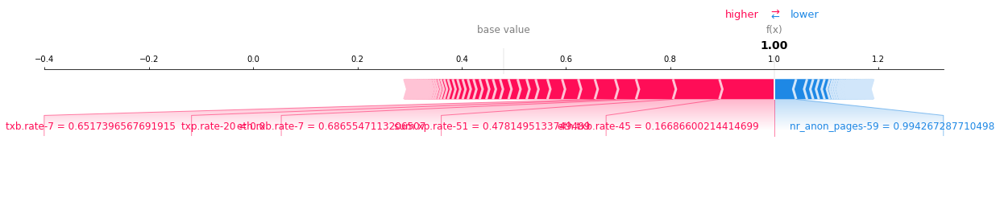

Annomaly loc 47


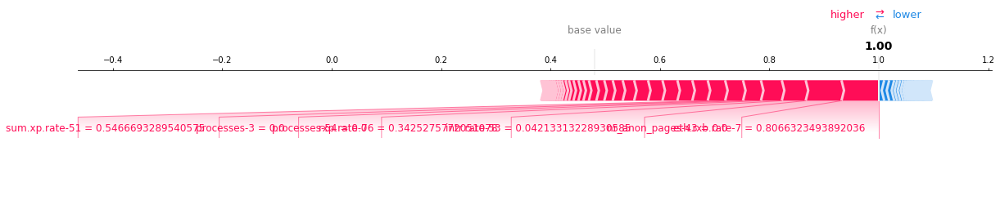

Annomaly loc 48


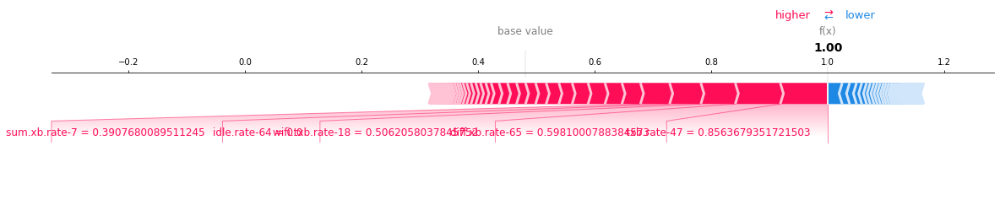

Annomaly loc 49


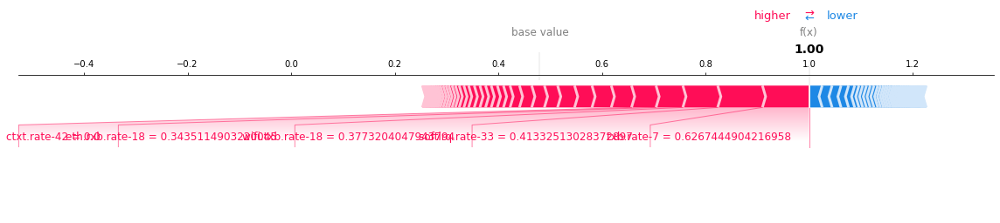

Annomaly loc 50


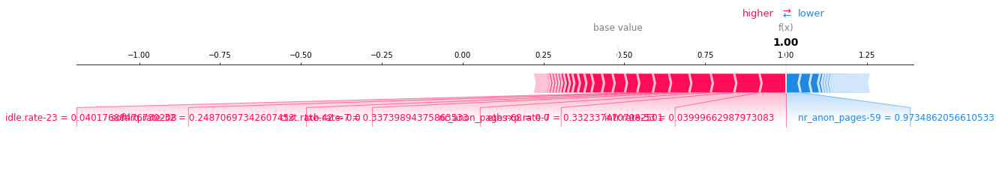

Annomaly loc 51


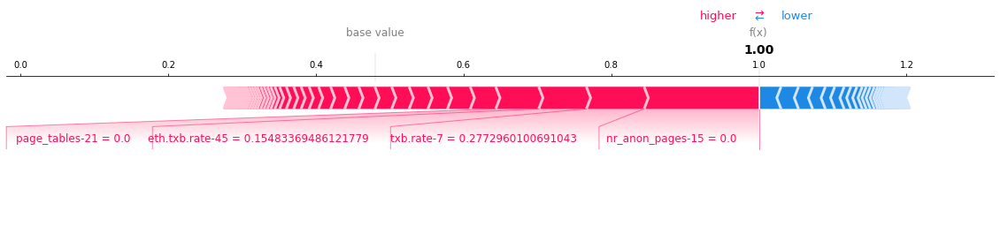

Annomaly loc 52


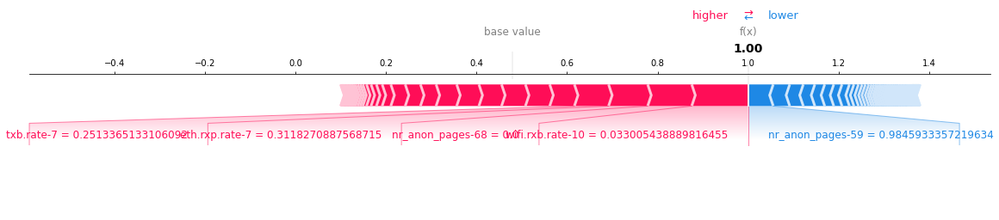

Annomaly loc 54


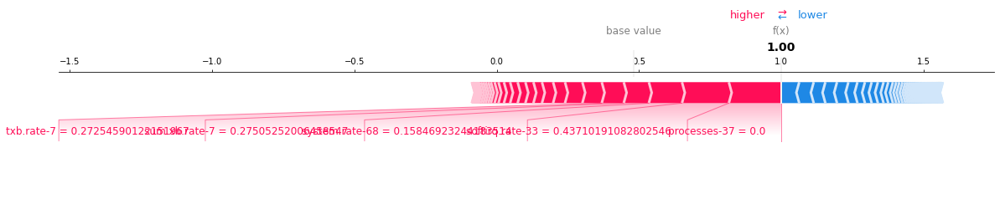

Annomaly loc 55


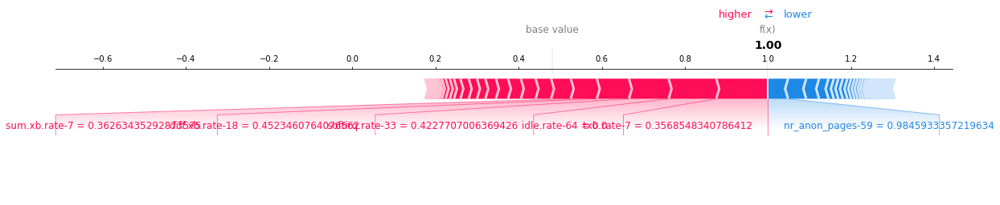

Annomaly loc 56


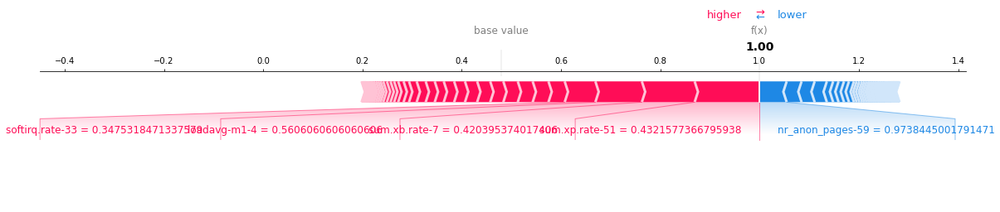

Annomaly loc 57


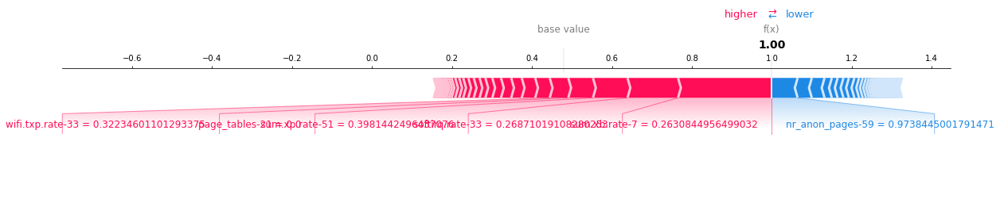

Annomaly loc 60


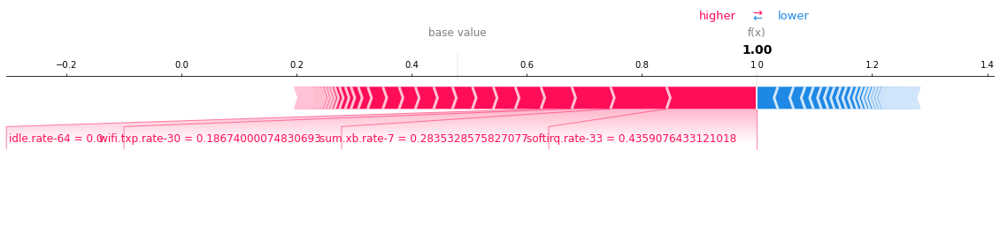

Annomaly loc 61


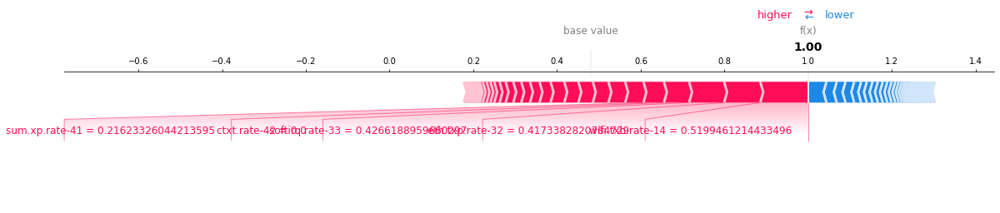

Annomaly loc 62


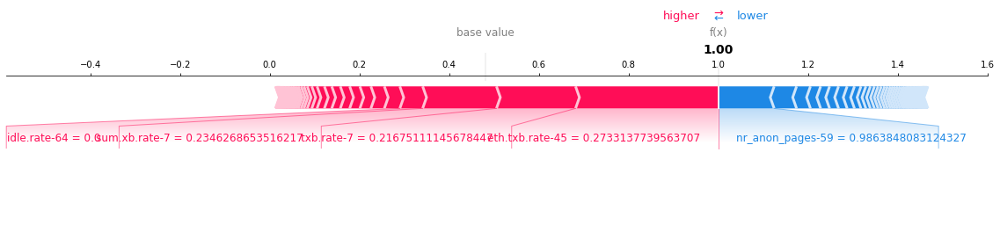

Annomaly loc 66


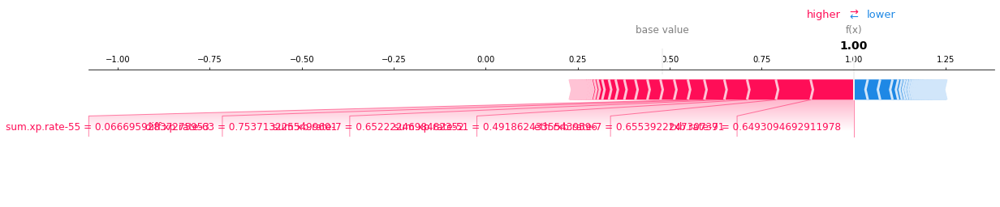

Annomaly loc 67


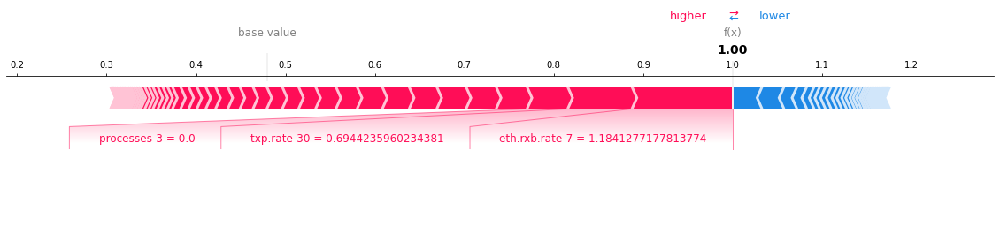

Annomaly loc 68


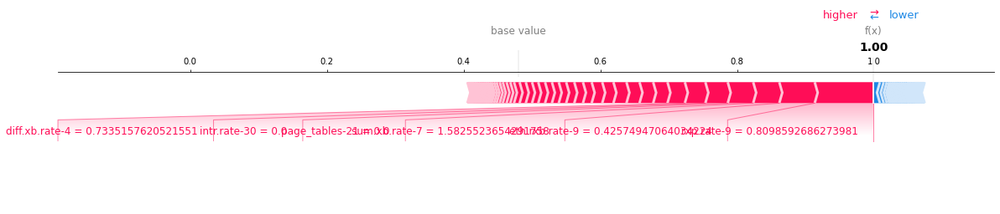

Annomaly loc 69


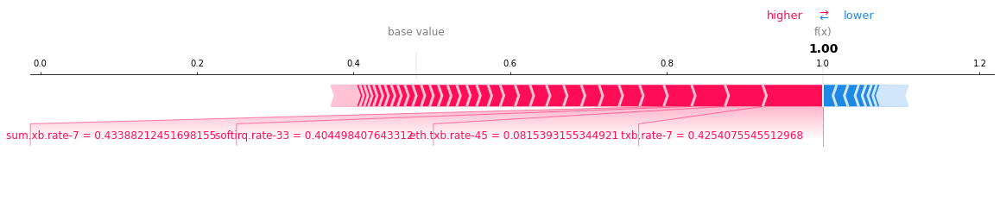

Annomaly loc 70


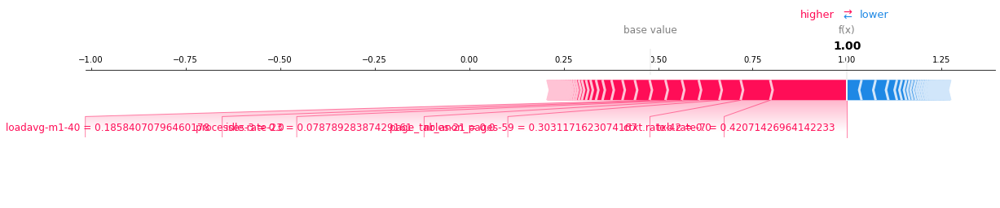

Annomaly loc 71


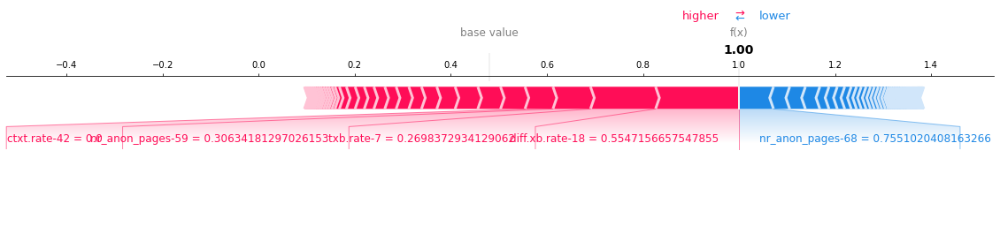

Annomaly loc 72


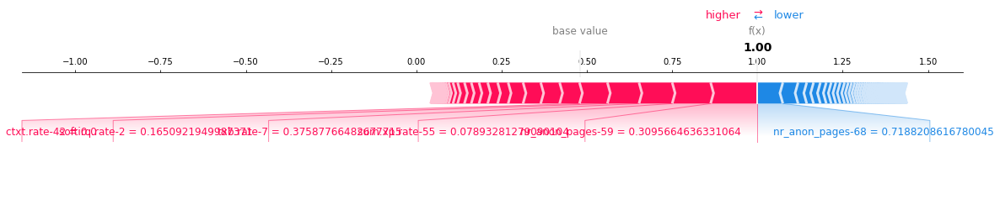

Annomaly loc 75


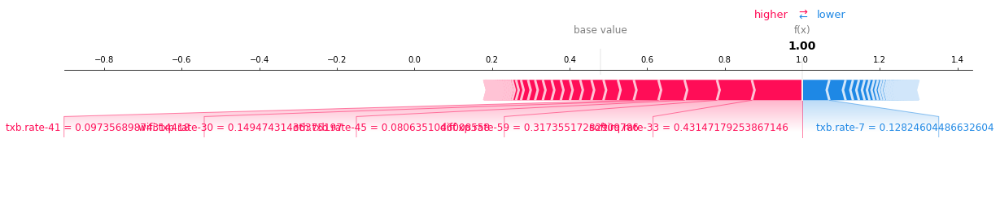

Annomaly loc 84


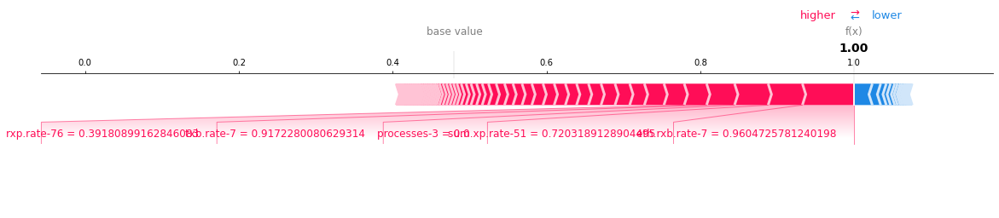

Annomaly loc 85


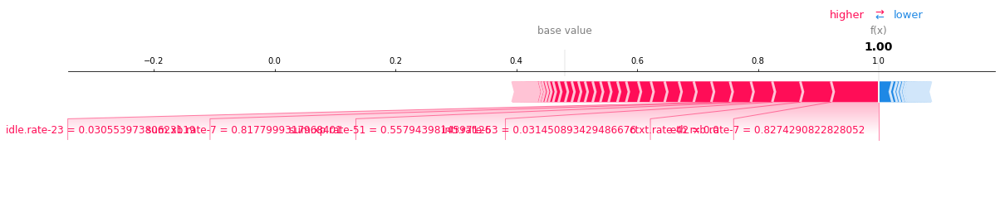

Annomaly loc 86


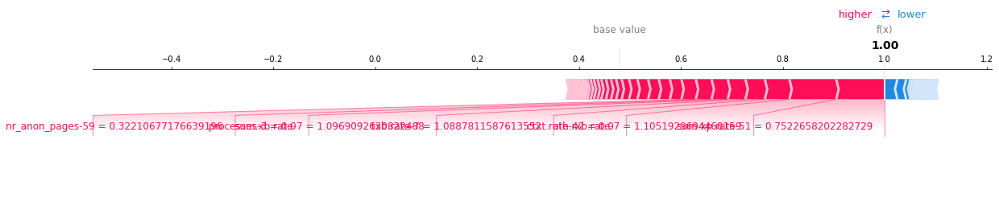

Annomaly loc 87


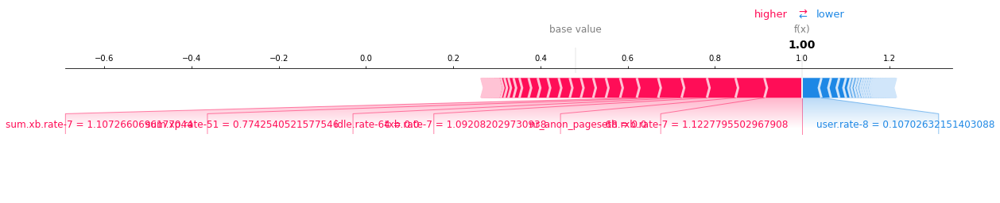

Annomaly loc 88


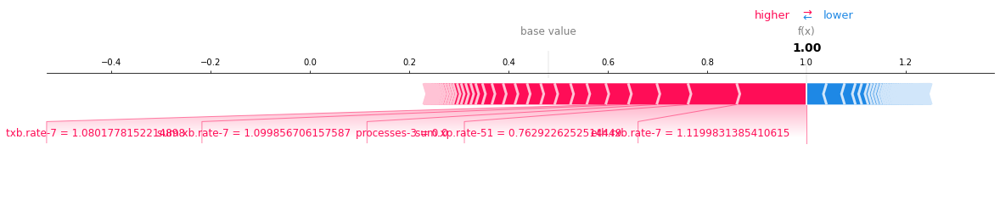

Annomaly loc 89


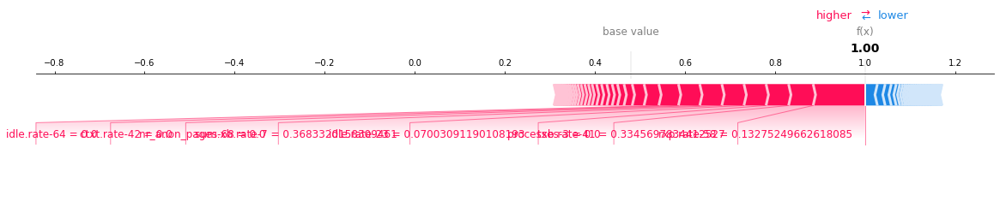

Annomaly loc 90


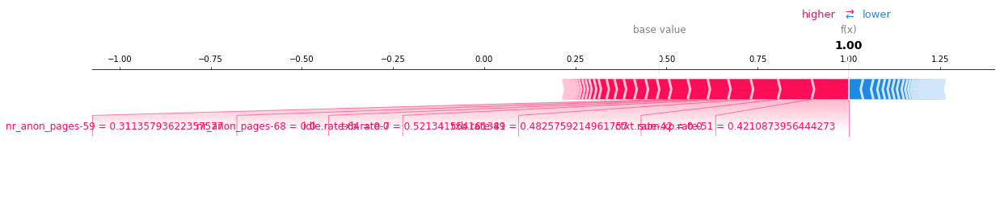

Annomaly loc 91


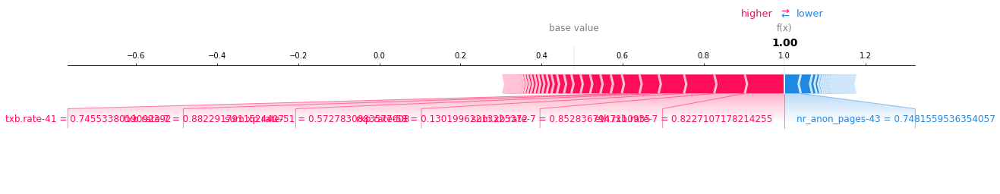

Annomaly loc 92


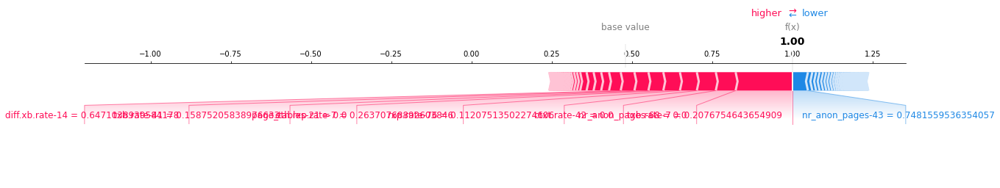

Annomaly loc 93


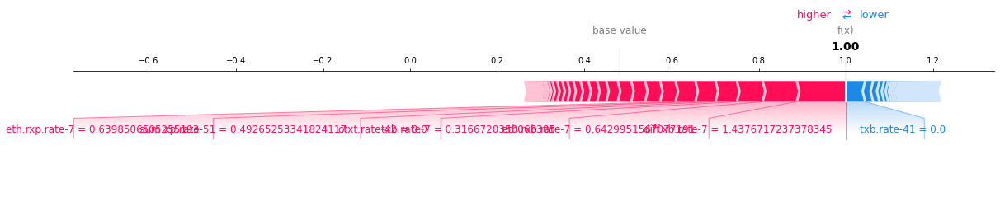

Annomaly loc 94


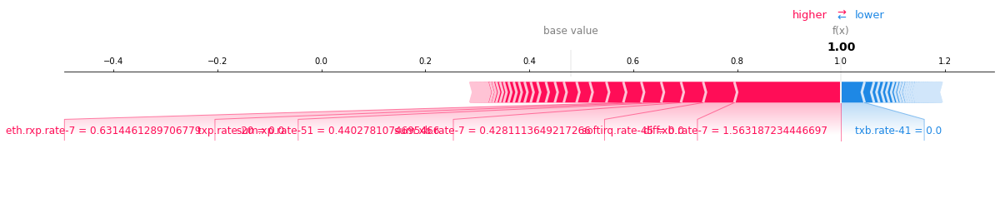

Annomaly loc 95


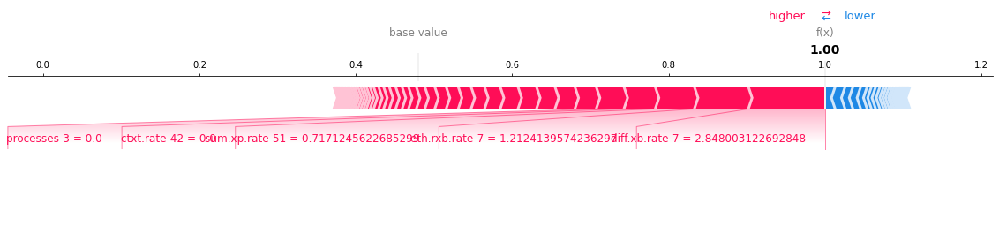

Annomaly loc 96


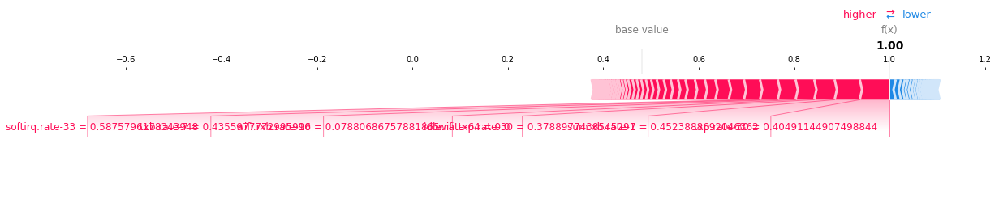

Annomaly loc 97


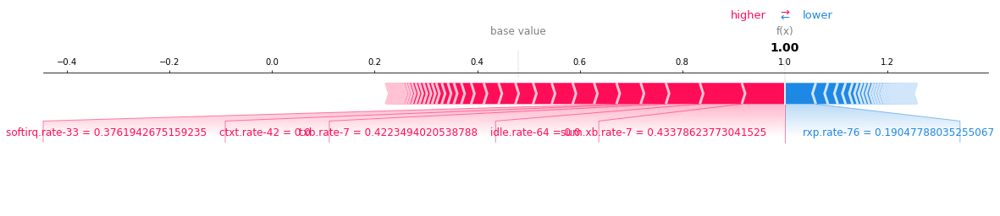

Annomaly loc 98


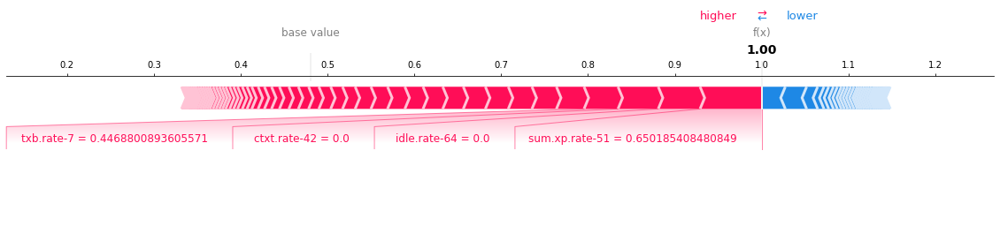

Annomaly loc 99


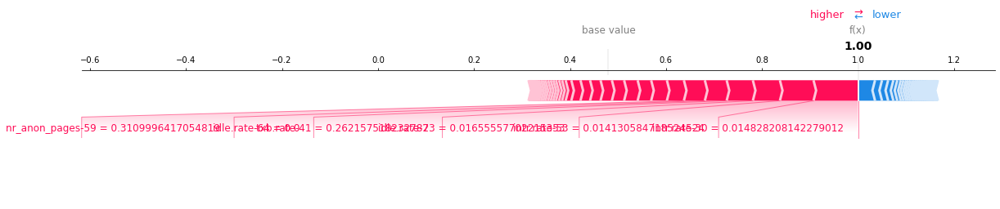

Annomaly loc 100


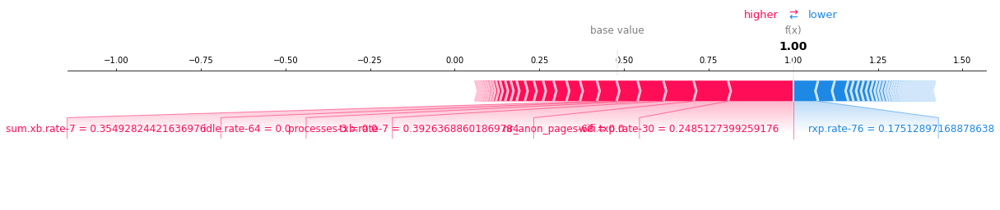

Annomaly loc 101


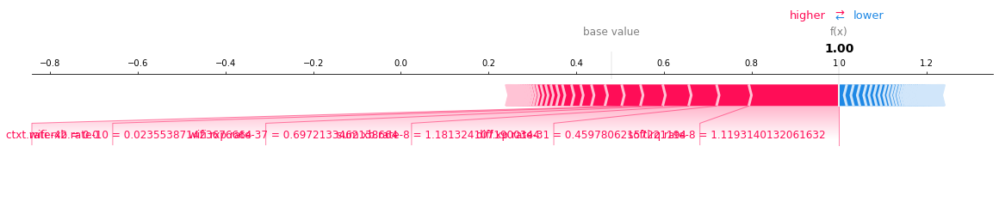

Annomaly loc 102


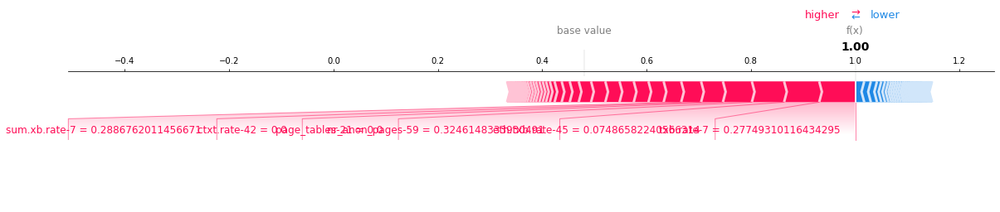

Annomaly loc 103


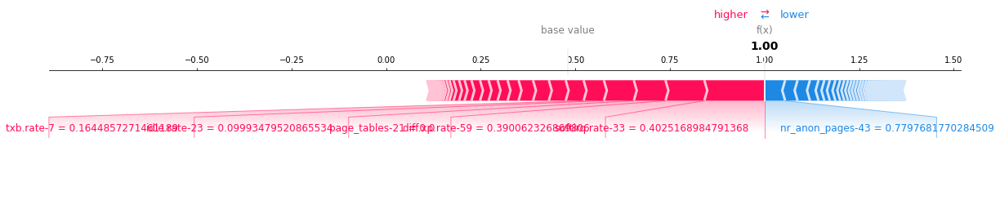

Annomaly loc 112


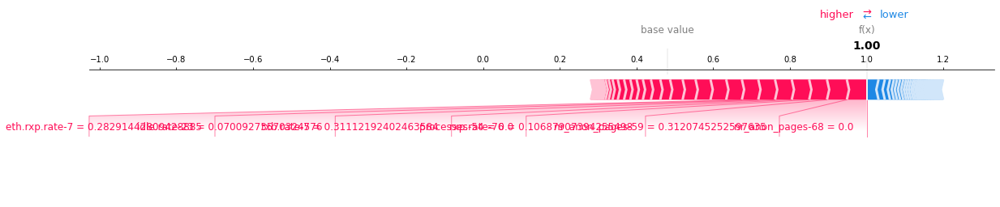

Annomaly loc 113


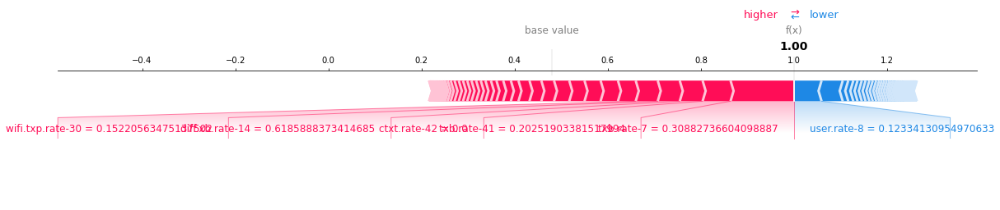

Annomaly loc 114


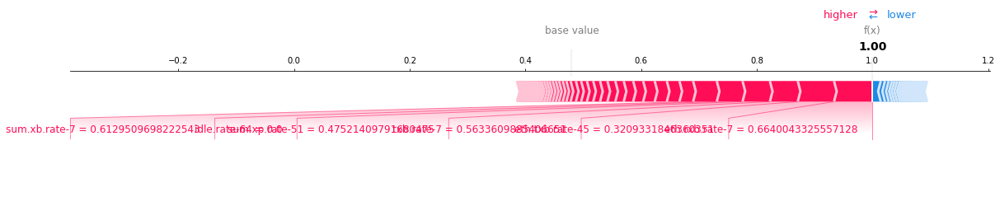

Annomaly loc 115


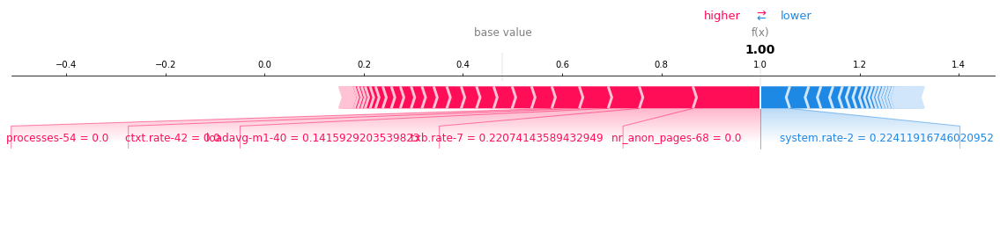

Annomaly loc 116


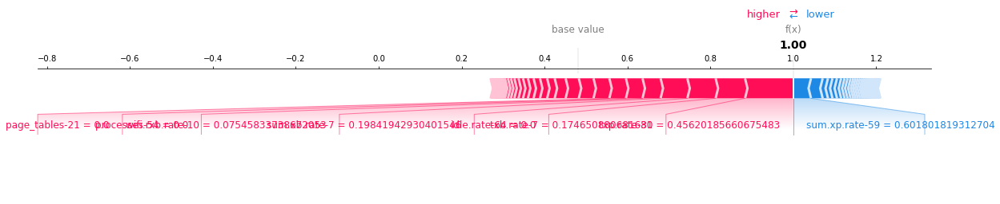

Annomaly loc 117


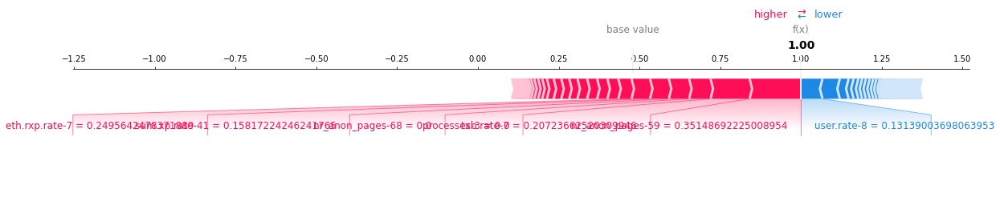

Annomaly loc 118


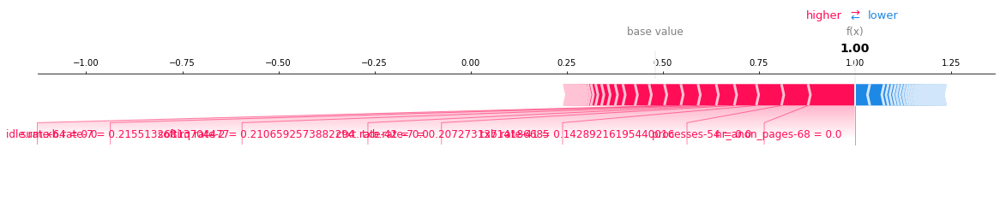

Annomaly loc 119


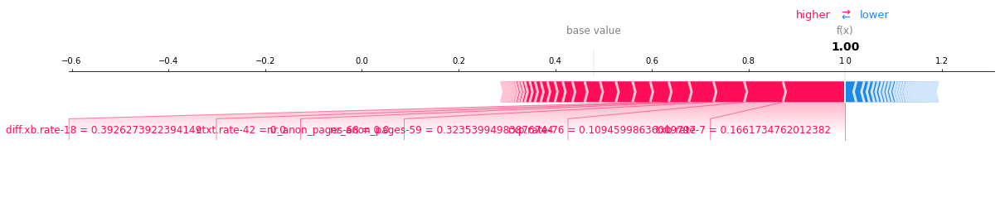

Annomaly loc 120


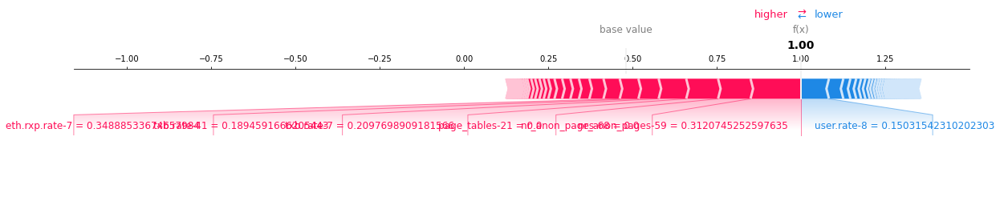

Annomaly loc 121


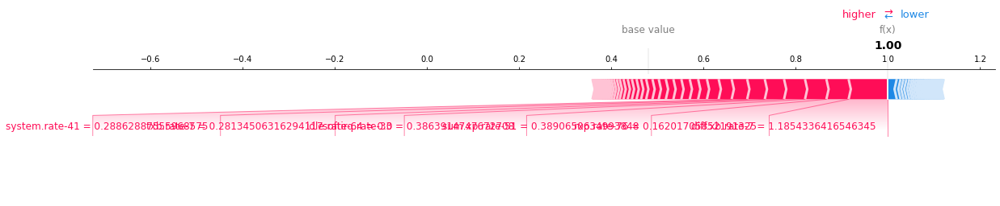

Annomaly loc 123


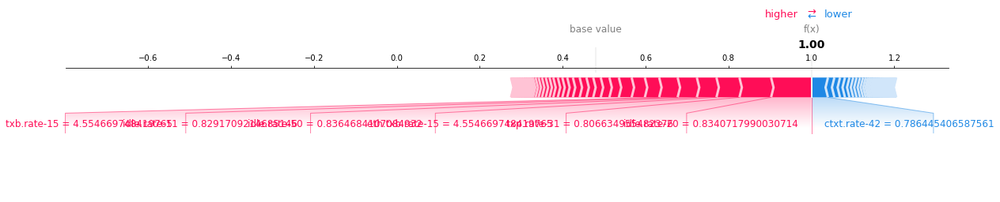

Annomaly loc 125


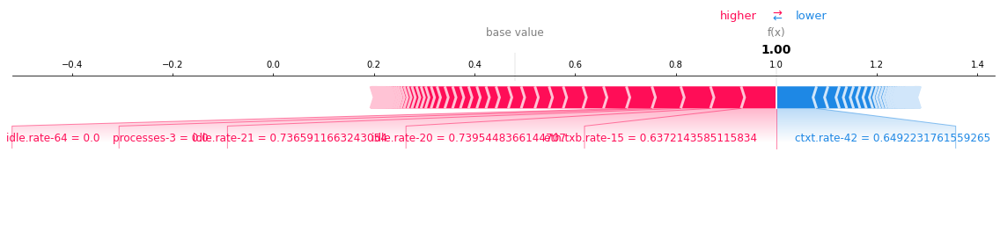

In [32]:
# shap_values[-1][18]
for e in sample_anomaly_index[0]:
    print(f"Annomaly loc {e}")
    shap.plots.force(shap_values_if5[e], matplotlib=True)

In [33]:
# df_work_filtered_scaled_sample.values[18]

In [46]:
shap.plots.force(shap_values_if5[6])
# shap.force_plot(explainer.expected_value, shap_values[-1][18], df_work_filtered_scaled_sample.values[18], feature_names=df_work_filtered_scaled_sample.columns)

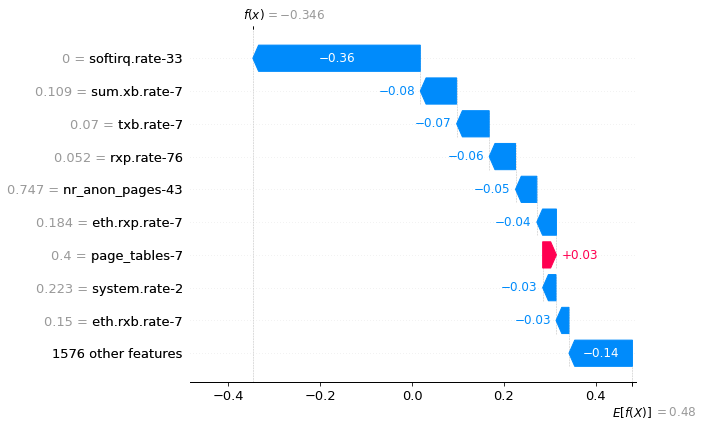

In [47]:
#local feature importance plot, where the bars are the SHAP values for each feature.
shap.plots.waterfall(shap_values_if5[105])

In [ ]:
shap.plots.waterfall(shap_values_if5[6])

Annomaly loc 2


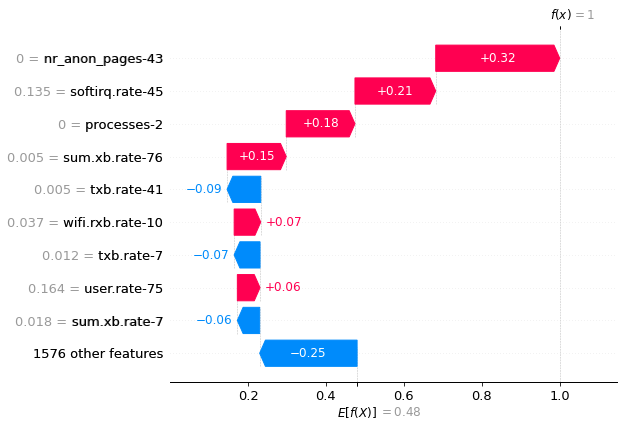

Annomaly loc 3


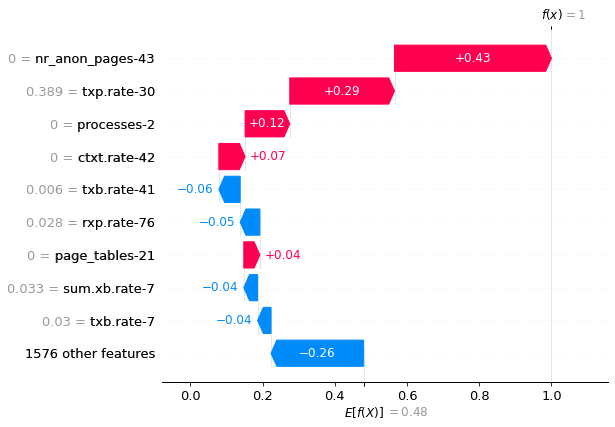

Annomaly loc 9


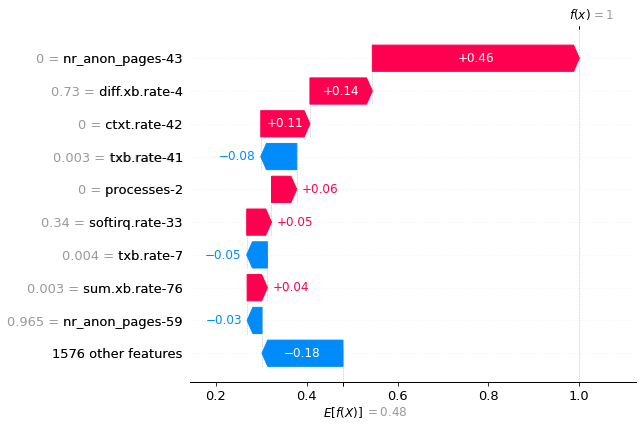

Annomaly loc 10


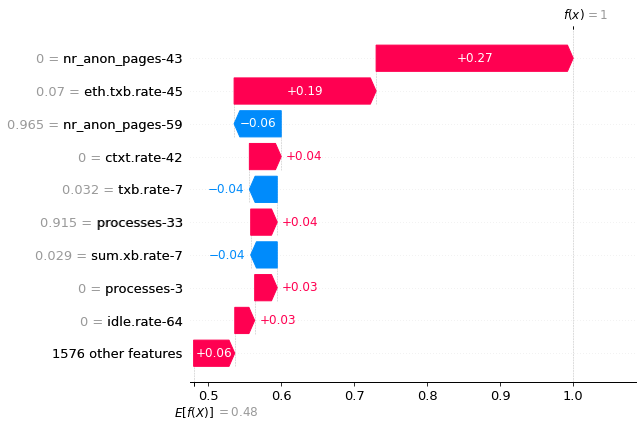

Annomaly loc 11


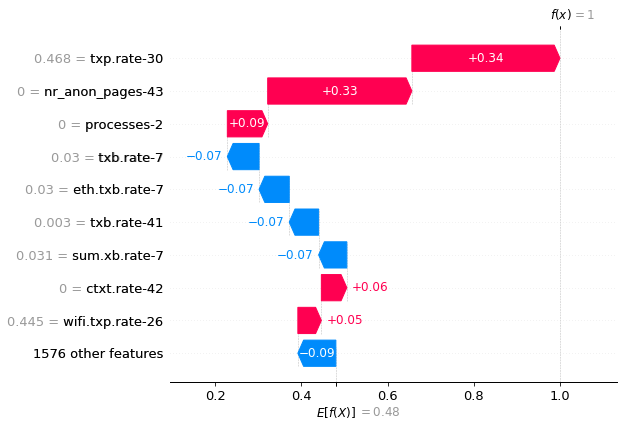

Annomaly loc 18


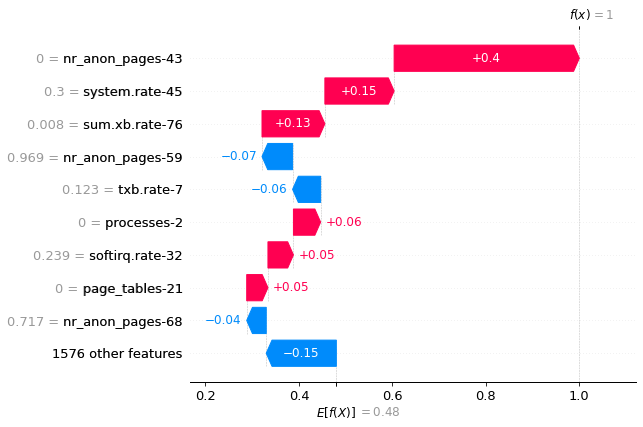

Annomaly loc 19


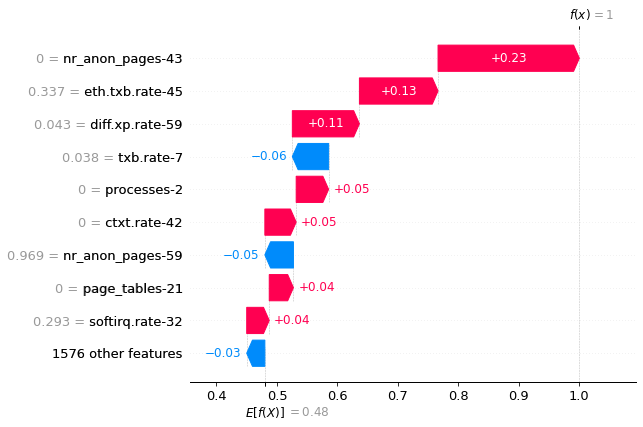

Annomaly loc 20


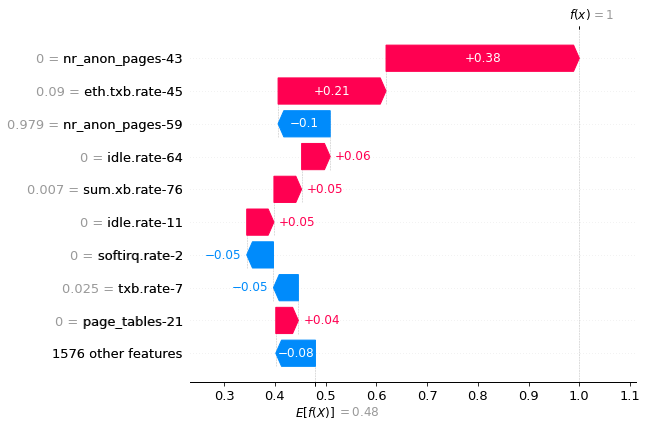

Annomaly loc 21


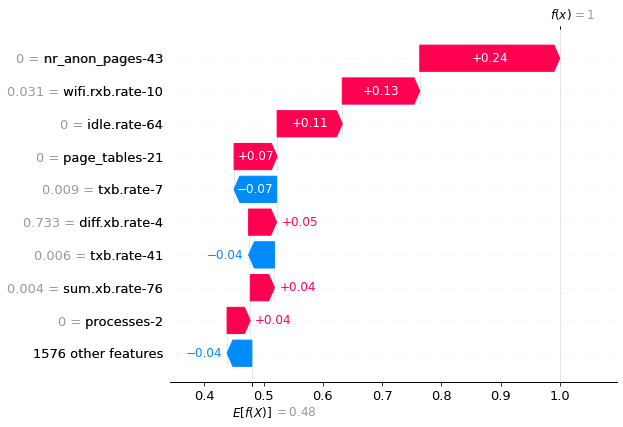

Annomaly loc 22


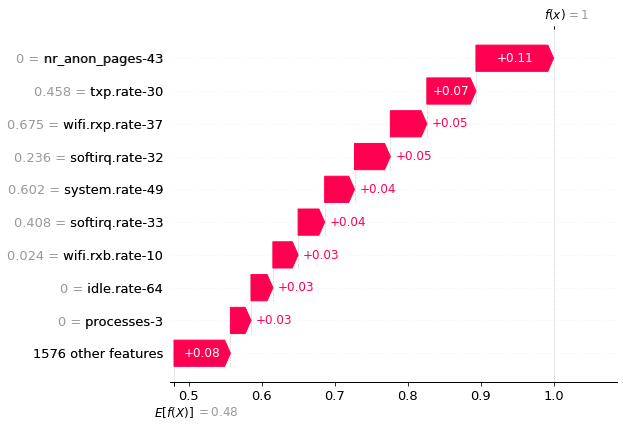

Annomaly loc 29


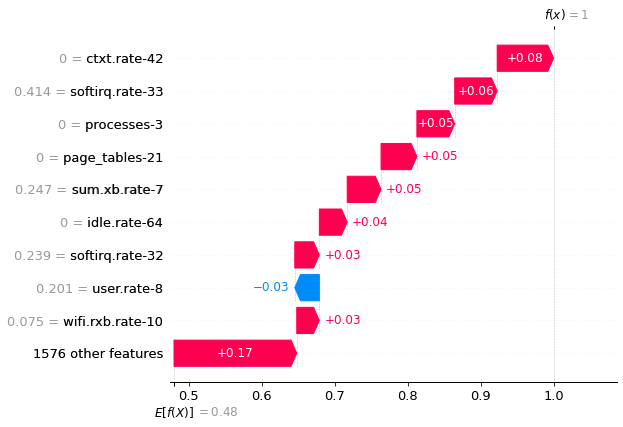

Annomaly loc 38


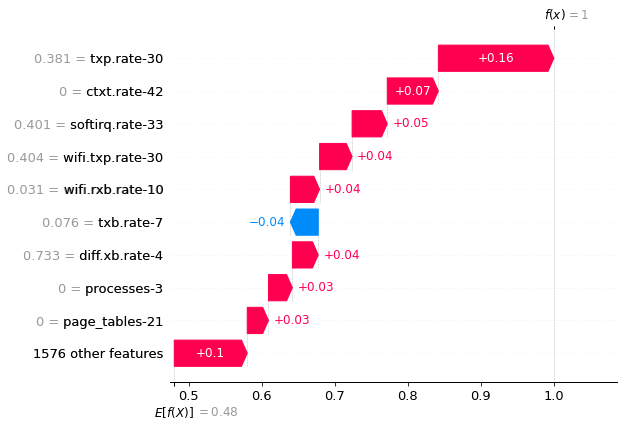

Annomaly loc 39


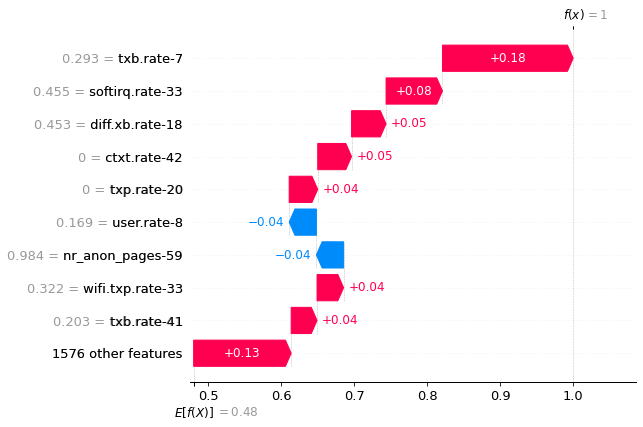

Annomaly loc 40


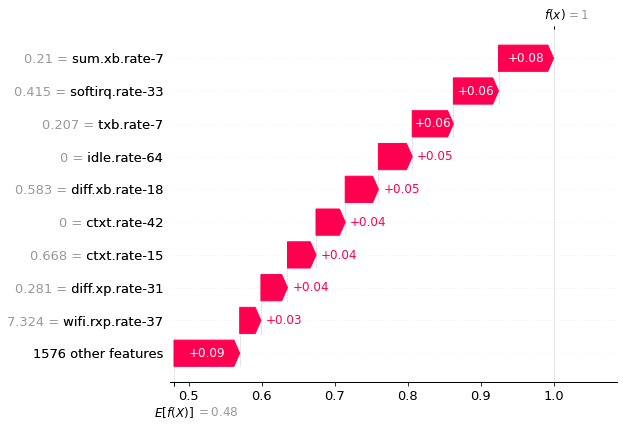

Annomaly loc 42


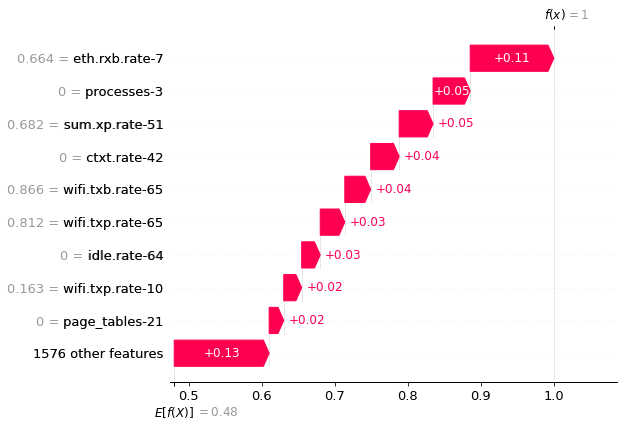

Annomaly loc 43


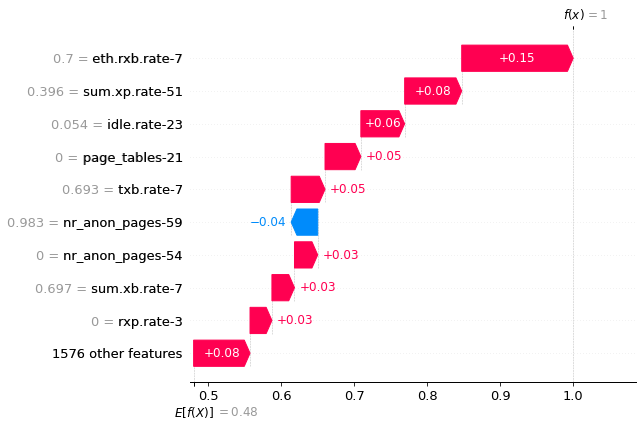

Annomaly loc 44


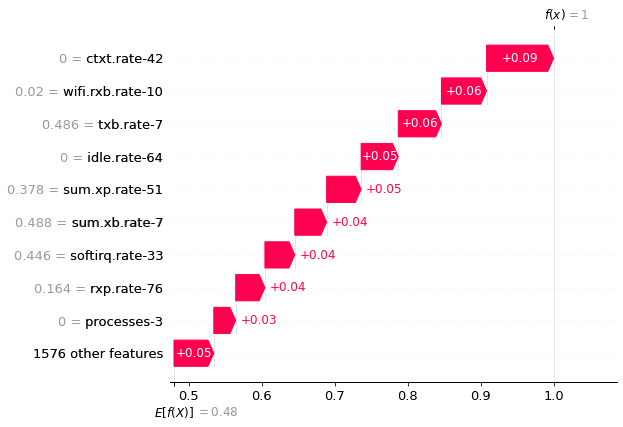

Annomaly loc 46


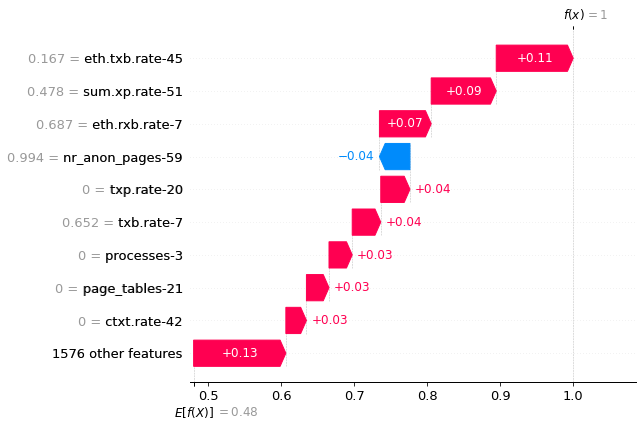

Annomaly loc 47


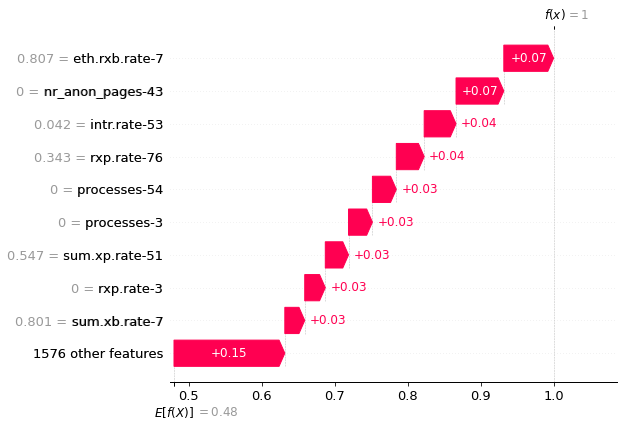

Annomaly loc 48


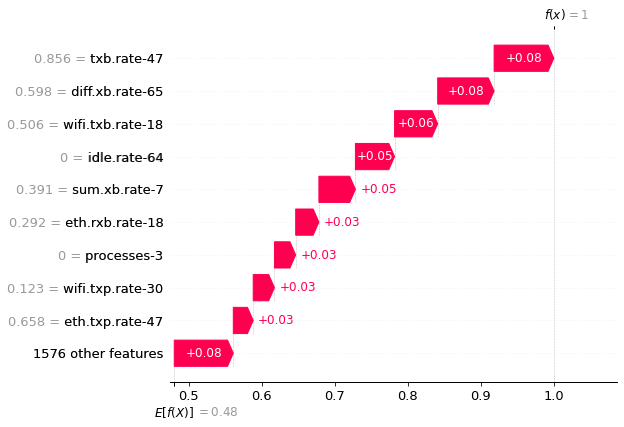

Annomaly loc 49


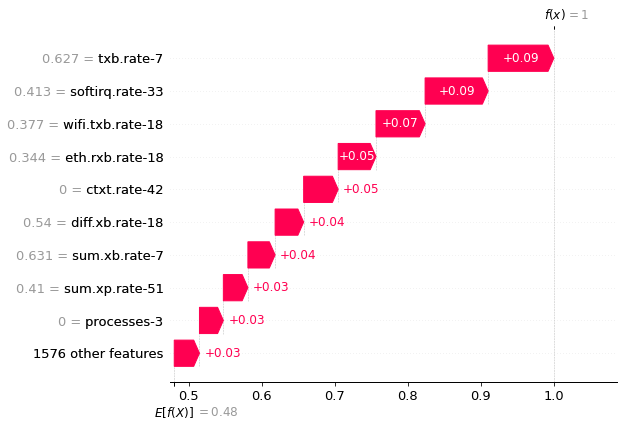

Annomaly loc 50


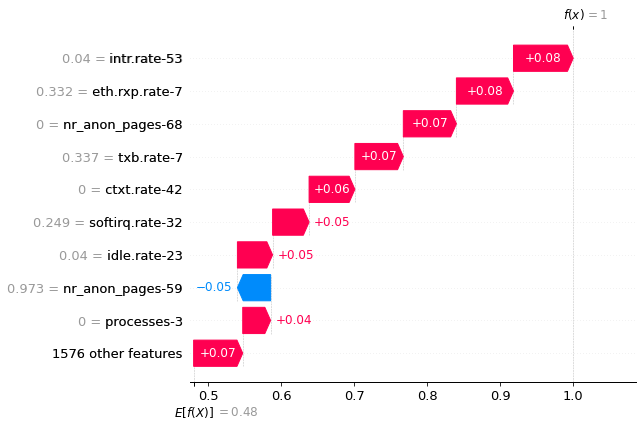

Annomaly loc 51


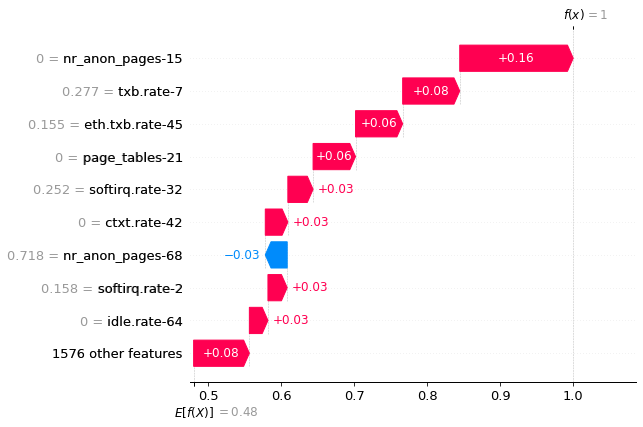

Annomaly loc 52


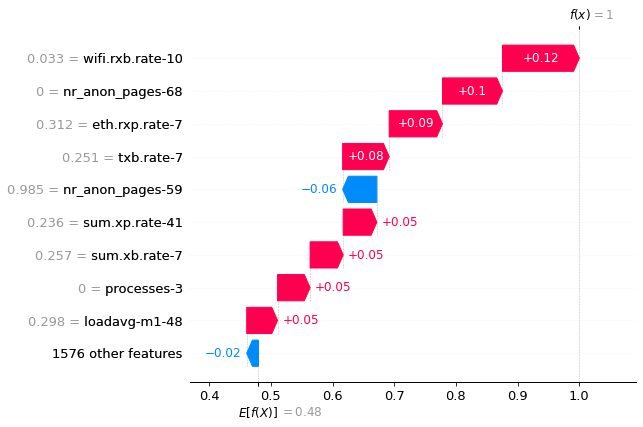

Annomaly loc 54


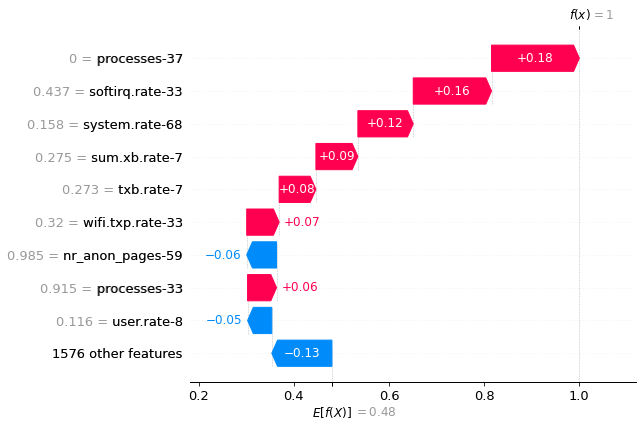

Annomaly loc 55


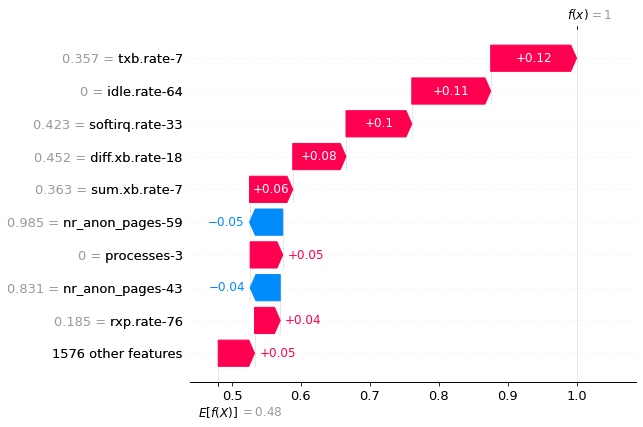

Annomaly loc 56


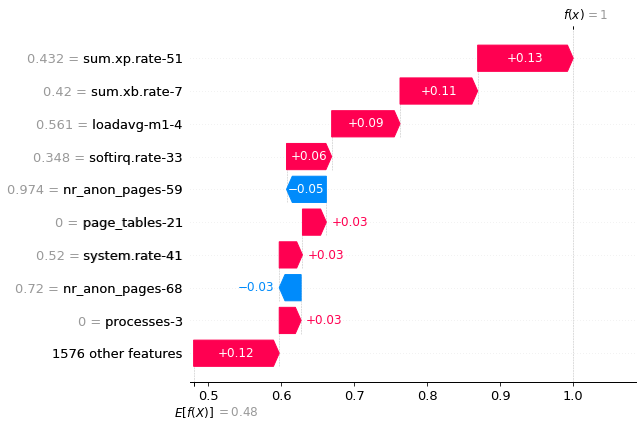

Annomaly loc 57


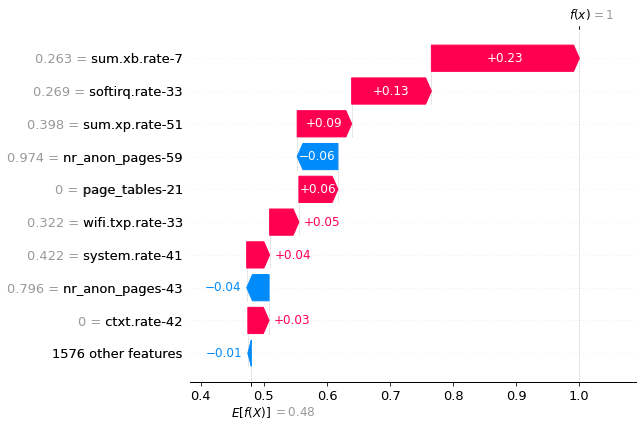

Annomaly loc 60


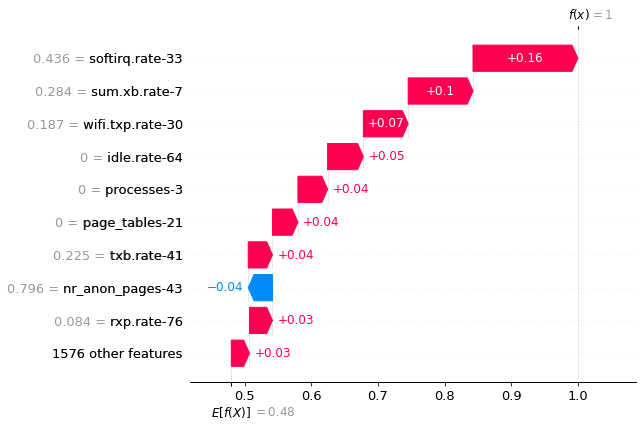

Annomaly loc 61


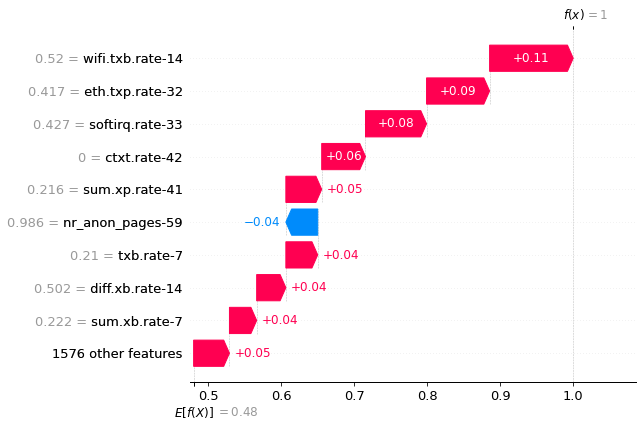

Annomaly loc 62


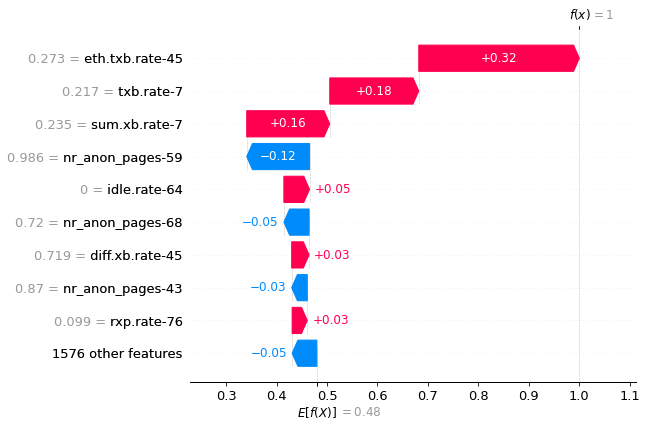

Annomaly loc 66


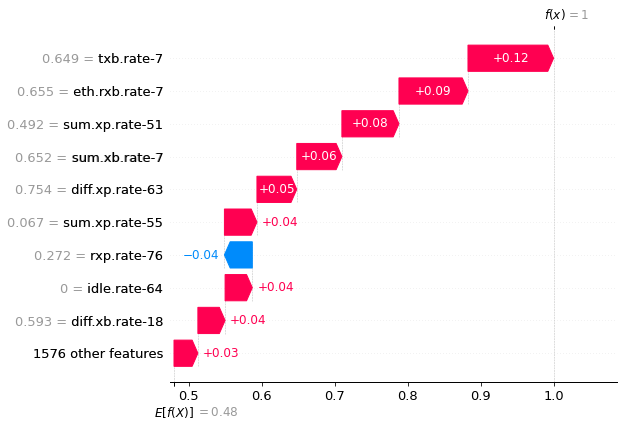

Annomaly loc 67


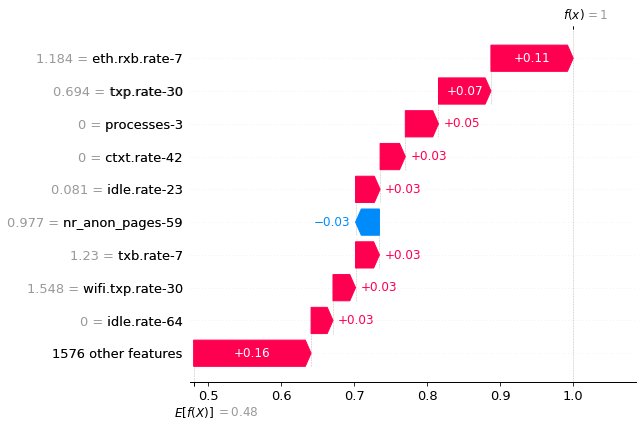

Annomaly loc 68


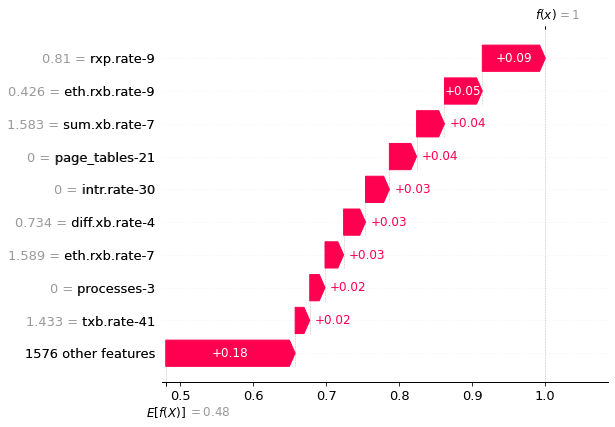

Annomaly loc 69


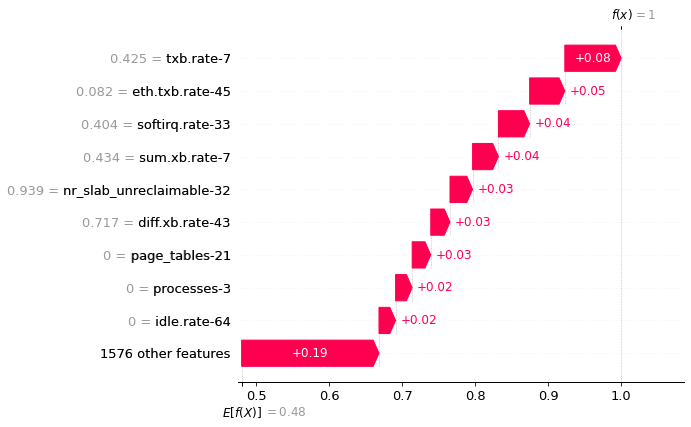

Annomaly loc 70


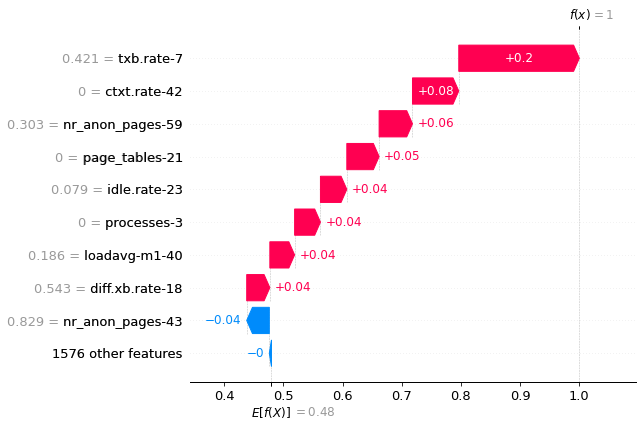

Annomaly loc 71


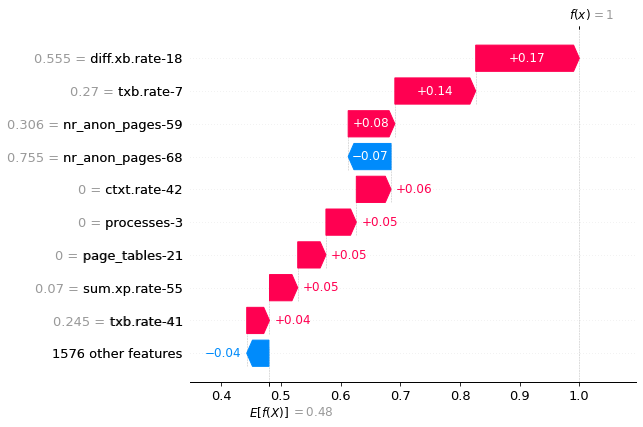

Annomaly loc 72


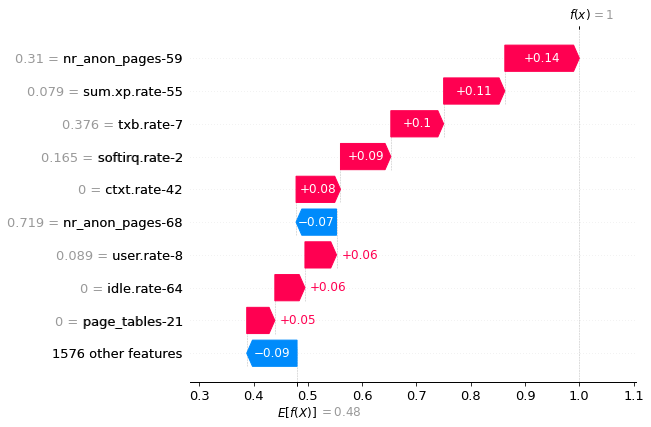

Annomaly loc 75


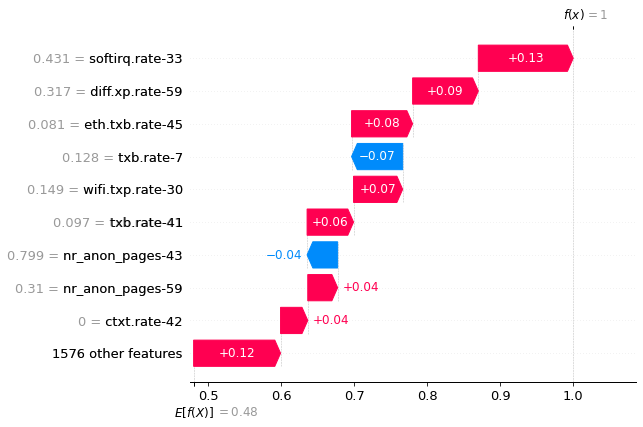

Annomaly loc 84


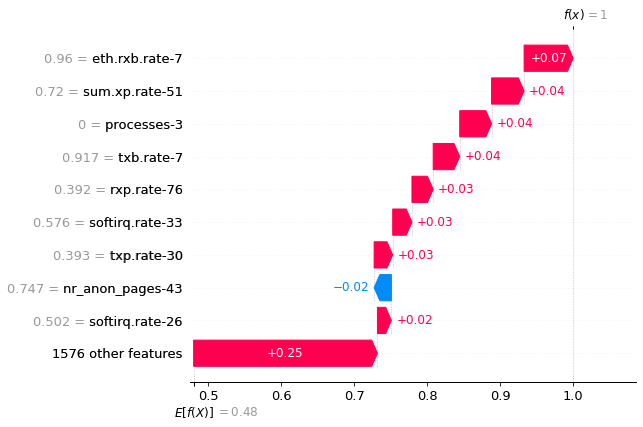

Annomaly loc 85


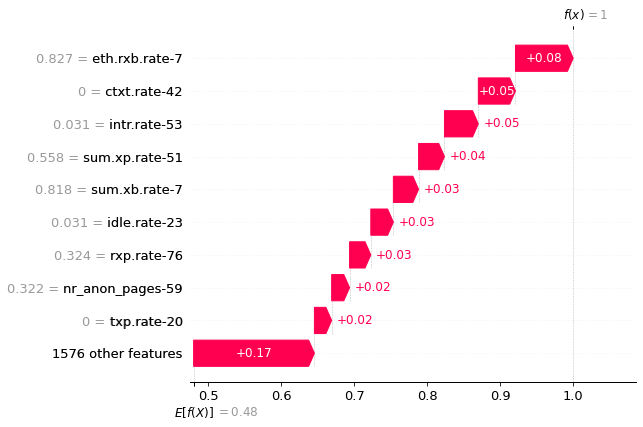

Annomaly loc 86


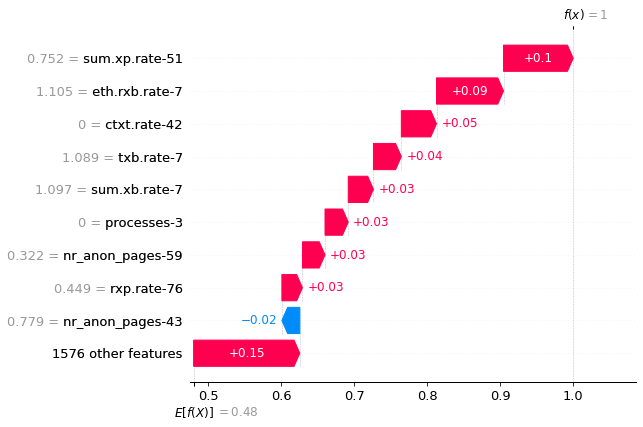

Annomaly loc 87


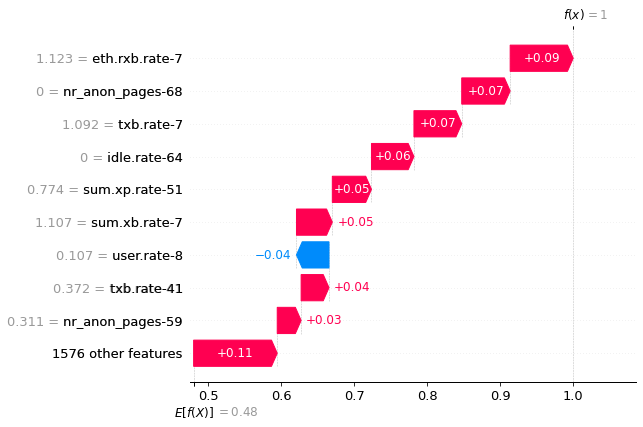

Annomaly loc 88


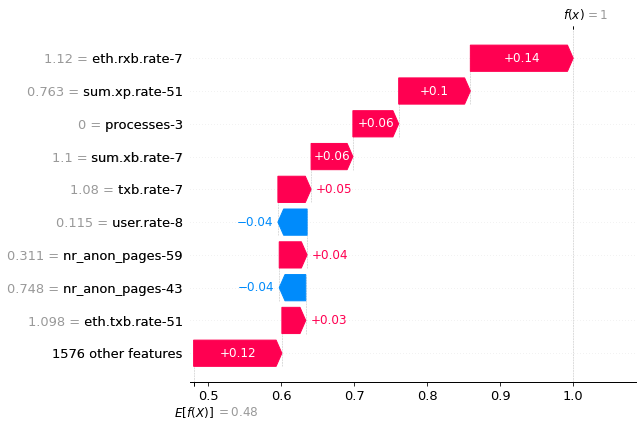

Annomaly loc 89


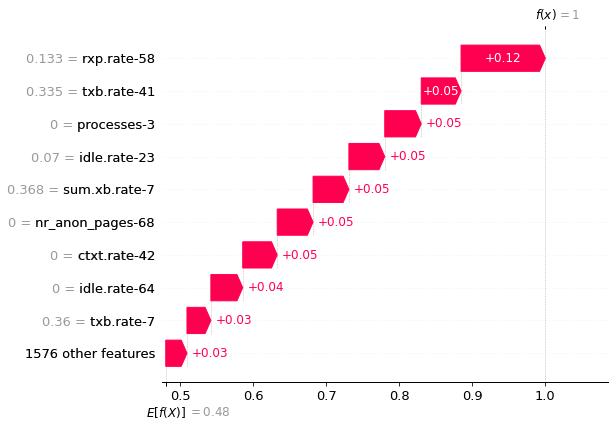

Annomaly loc 90


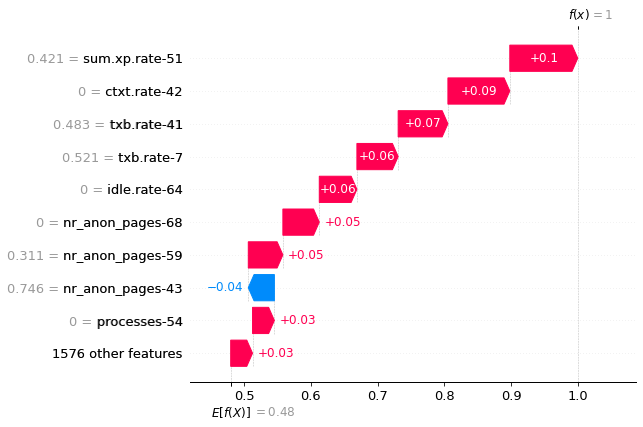

Annomaly loc 91


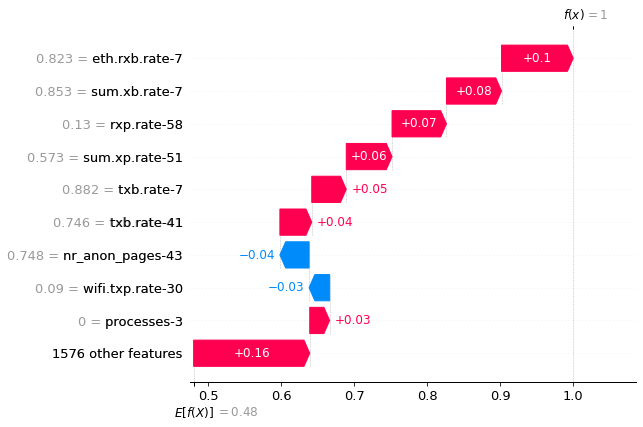

Annomaly loc 92


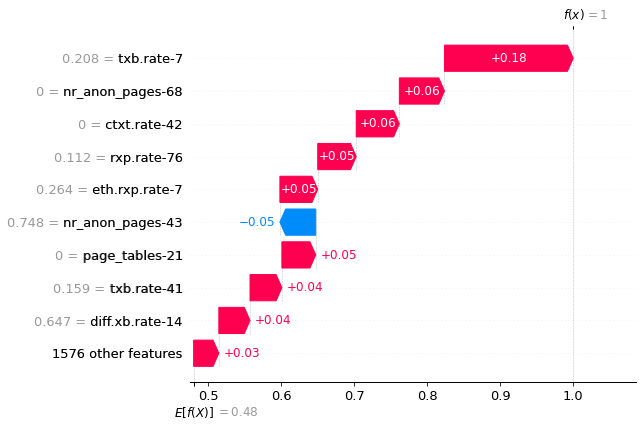

Annomaly loc 93


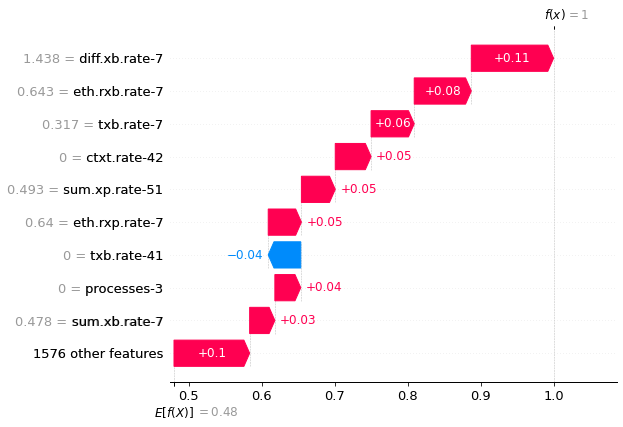

Annomaly loc 94


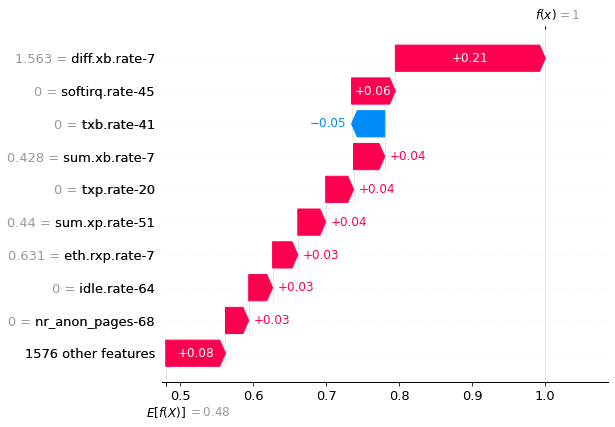

Annomaly loc 95


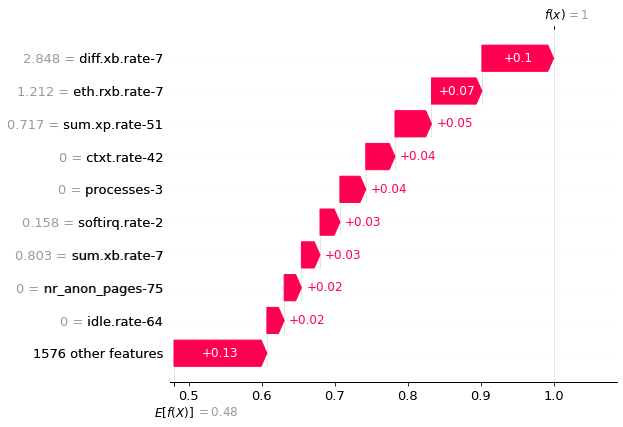

Annomaly loc 96


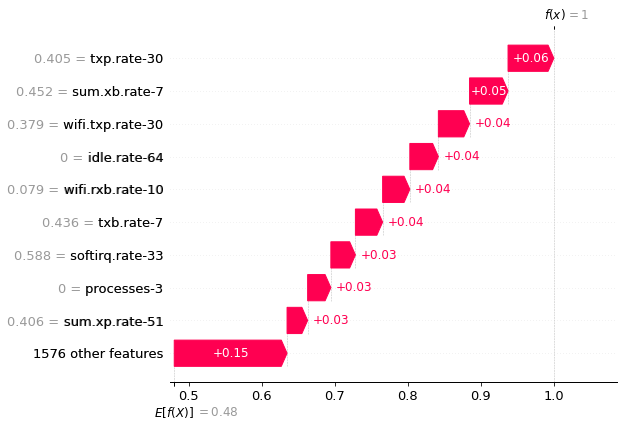

Annomaly loc 97


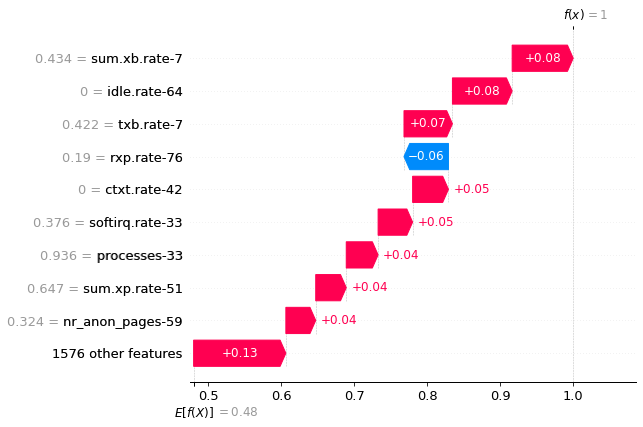

Annomaly loc 98


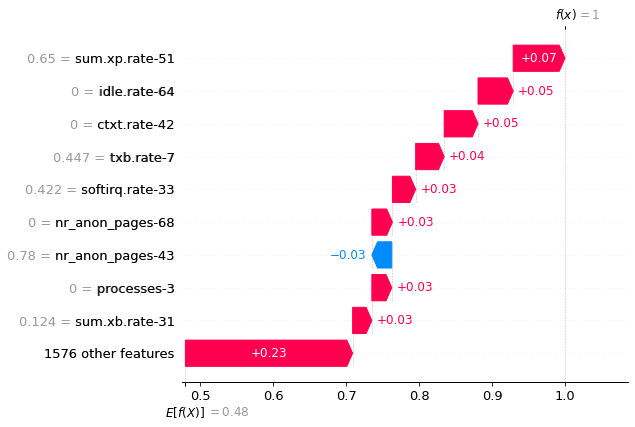

Annomaly loc 99


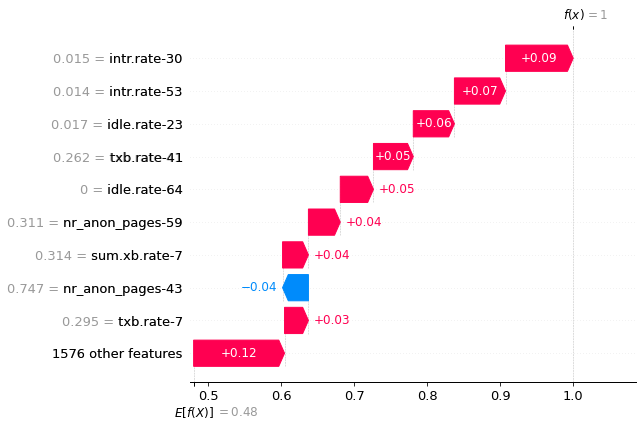

Annomaly loc 100


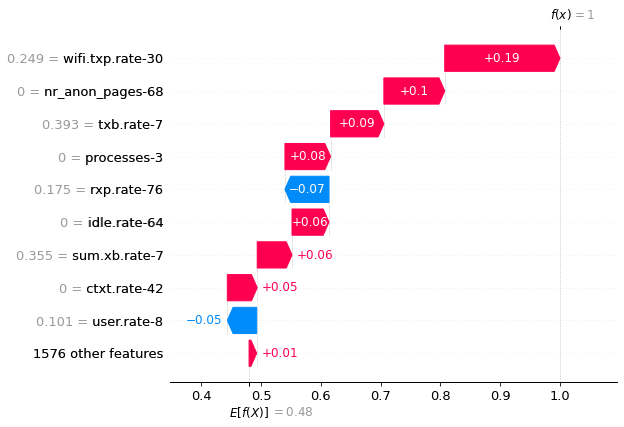

Annomaly loc 101


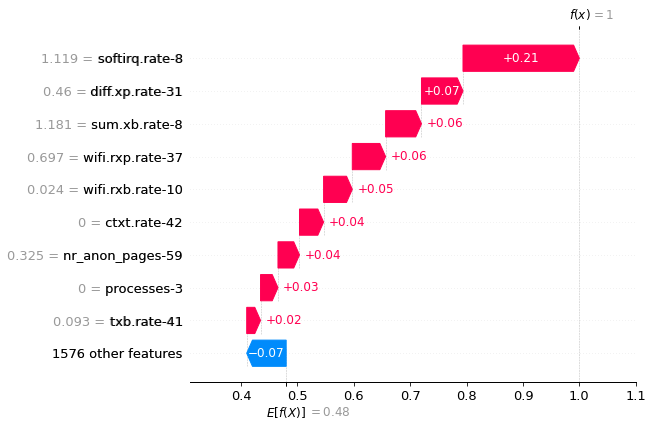

Annomaly loc 102


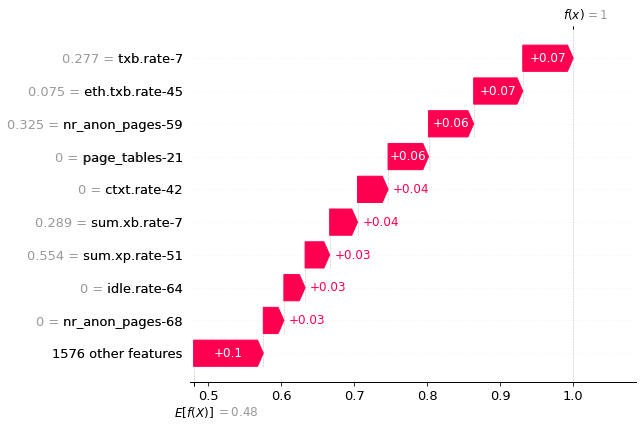

Annomaly loc 103


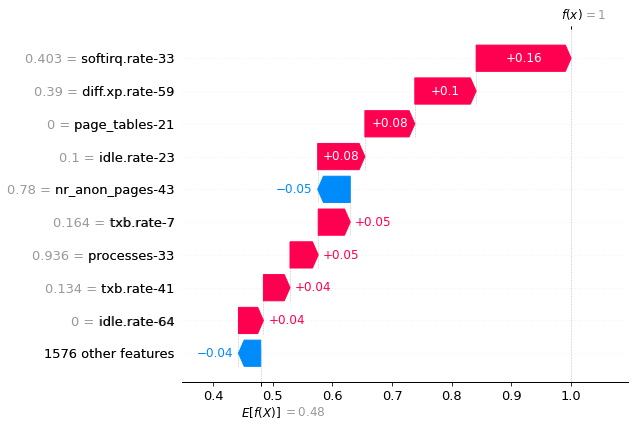

Annomaly loc 112


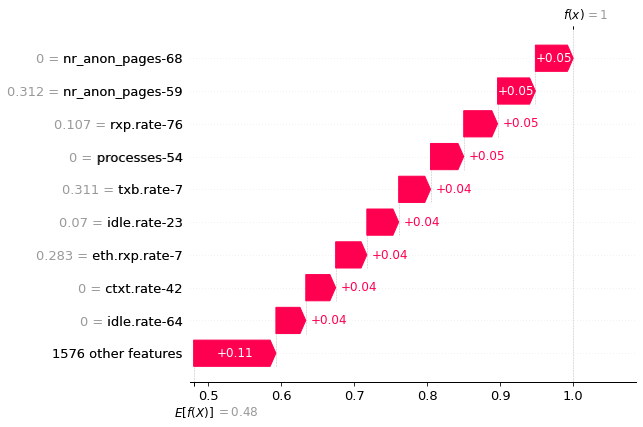

Annomaly loc 113


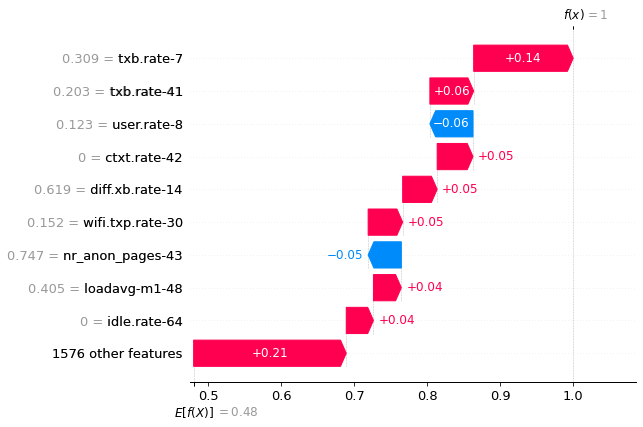

Annomaly loc 114


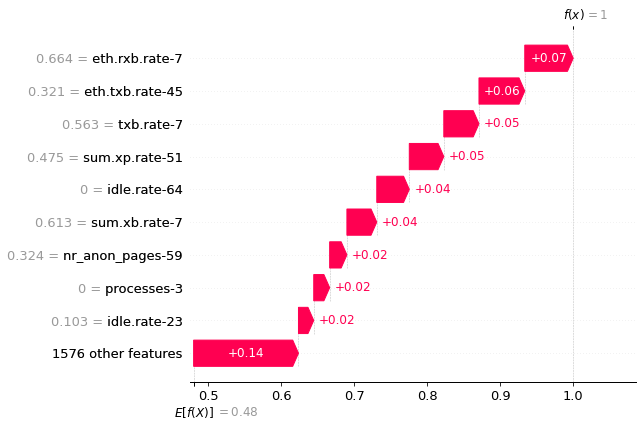

Annomaly loc 115


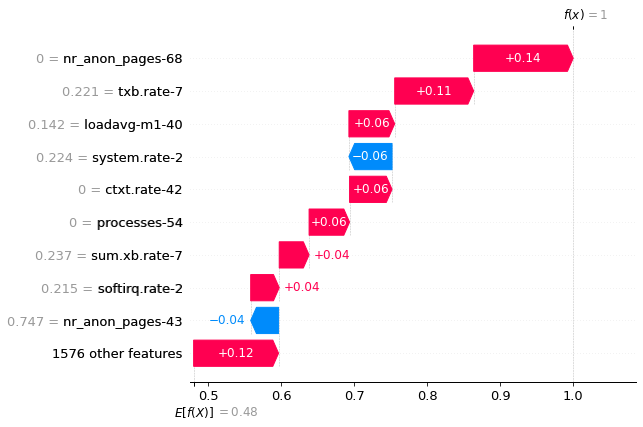

Annomaly loc 116


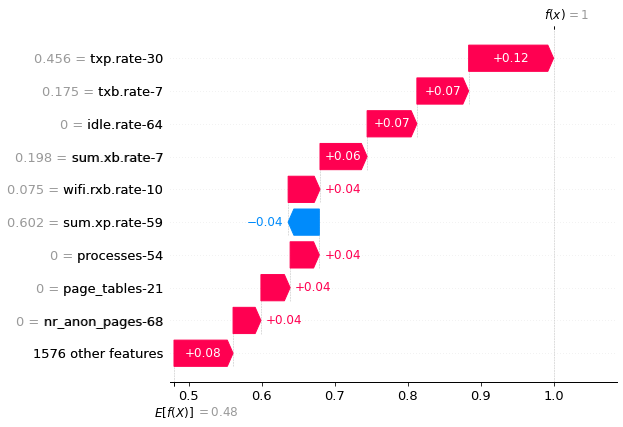

Annomaly loc 117


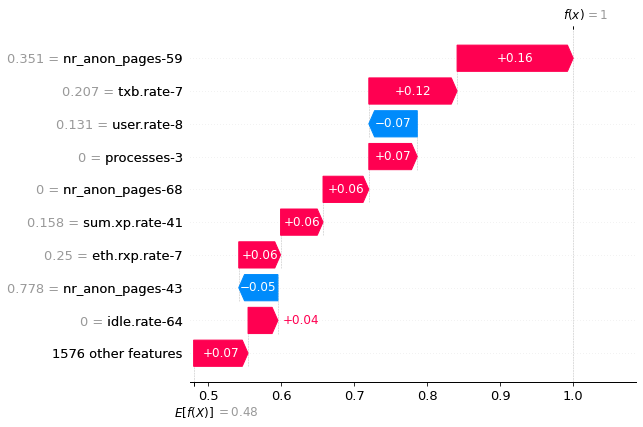

Annomaly loc 118


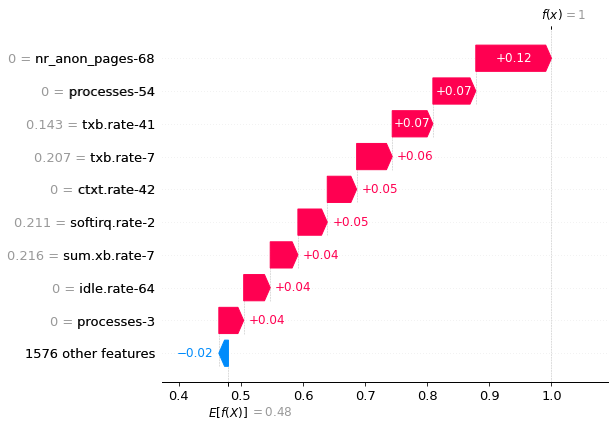

Annomaly loc 119


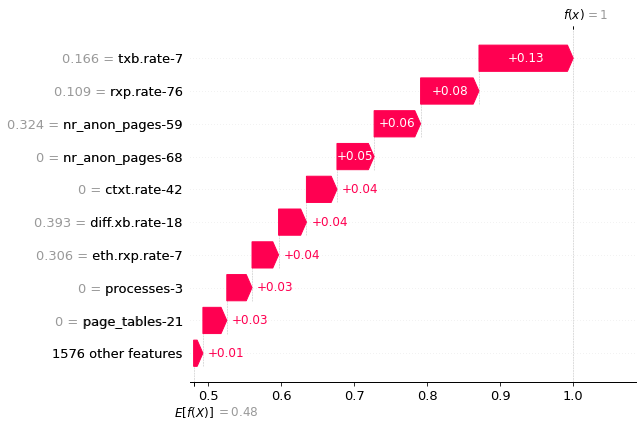

Annomaly loc 120


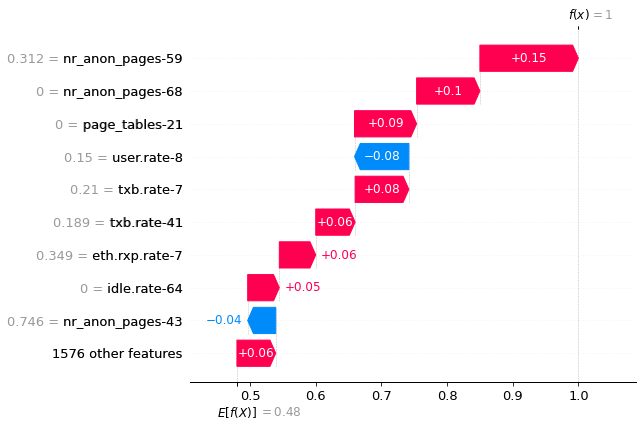

Annomaly loc 121


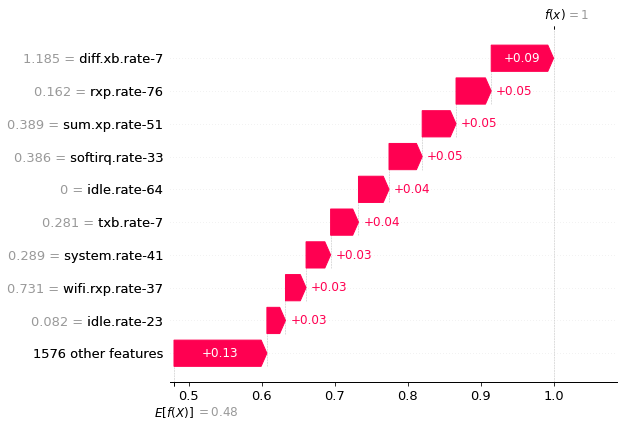

Annomaly loc 123


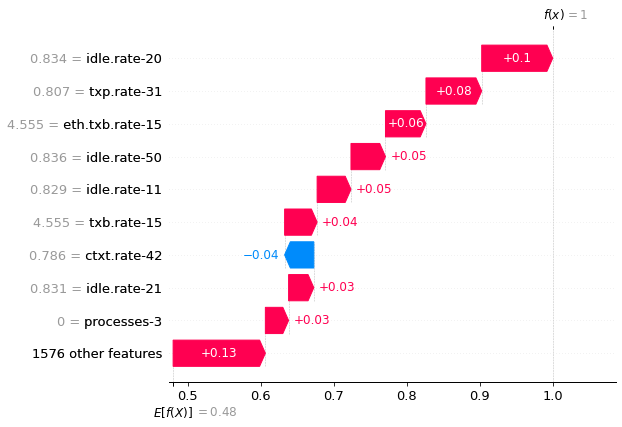

Annomaly loc 125


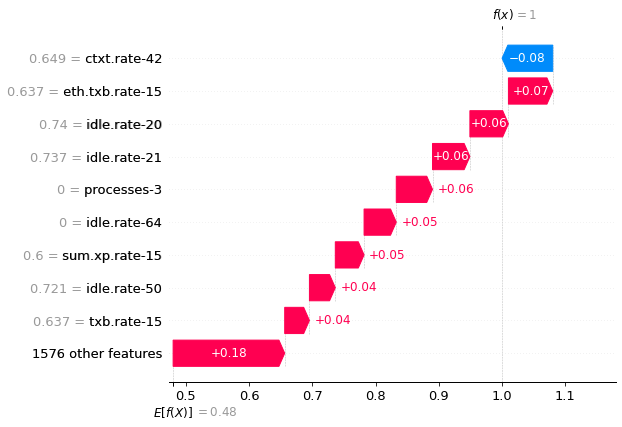

In [36]:
for e in sample_anomaly_index[0]:
    print(f"Annomaly loc {e}")
    shap.plots.waterfall(shap_values_if5[e])

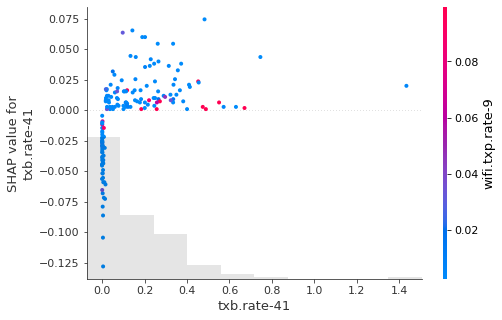

In [37]:
# Each dot is a single prediction (row) from the dataset.

# The x-axis is the value of the feature (from the X matrix, stored in shap_values.data).

# The y-axis is the SHAP value for that feature (stored in shap_values.values), 
# which represents how much knowing that feature’s value changes the output of the model for that sample’s prediction. 

# The light grey area at the bottom of the plot is a histogram showing the distribution of data values.

# To show which feature may be driving these interaction effects we can color our feature dependence scatter plot 
# by another feature. If we pass the entire Explanation object to the color parameter then the scatter plot 
# attempts to pick out the feature column with the strongest interaction with our feature. 
# If an interaction effect is present between this other feature and the feature we are plotting it 
# will show up as a distinct vertical pattern of coloring. 

shap.plots.scatter(shap_values_if5[:,'txb.rate-41'], color=shap_values_if5)




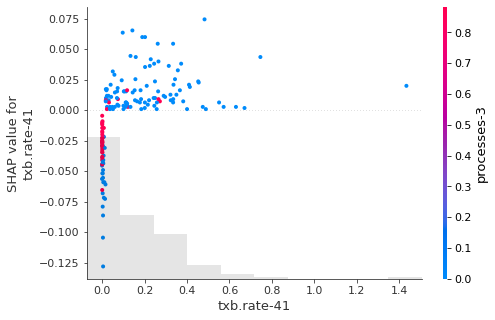

In [38]:
# Explicitly control which feature is used for coloring, pass specific feature
shap.plots.scatter(shap_values_if5[:,'txb.rate-41'], color=shap_values_if5[:,"processes-3"])

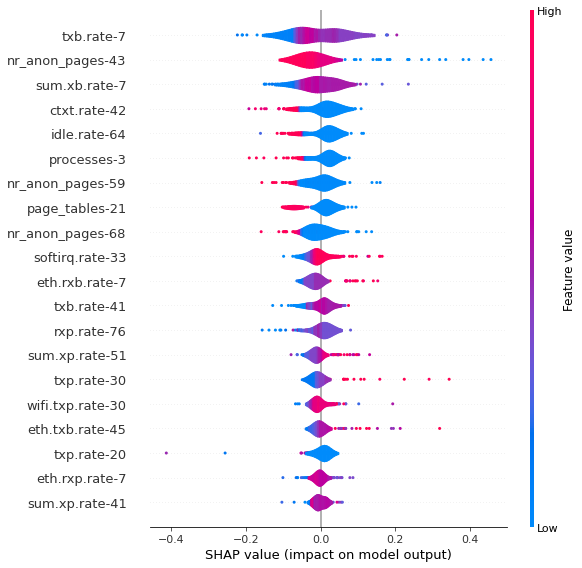

In [39]:
shap.summary_plot(shap_values_if5, df_work_filtered_scaled_sample, plot_type="violin")

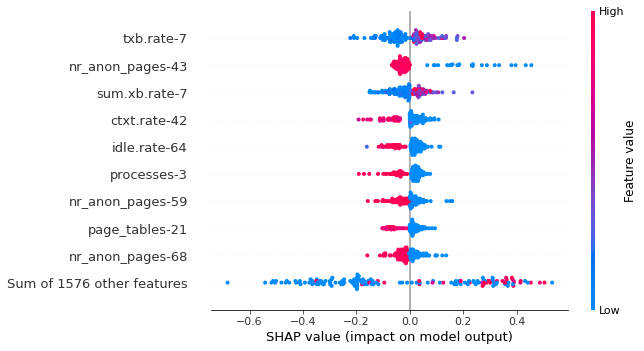

In [40]:
#The beeswarm plot is designed to display an information-dense summary of how the top features in a 
#dataset impact the model’s output. Each instance the given explanation is represented by a single 
#dot on each feature fow. The x position of the dot is determined by the SHAP value (shap_values.value[instance,feature]) of that feature, and dots “pile up” along each feature row to show density. 
#Color is used to display the original value of a feature (shap_values.data[instance,feature]). 
shap.plots.beeswarm(shap_values_if5)

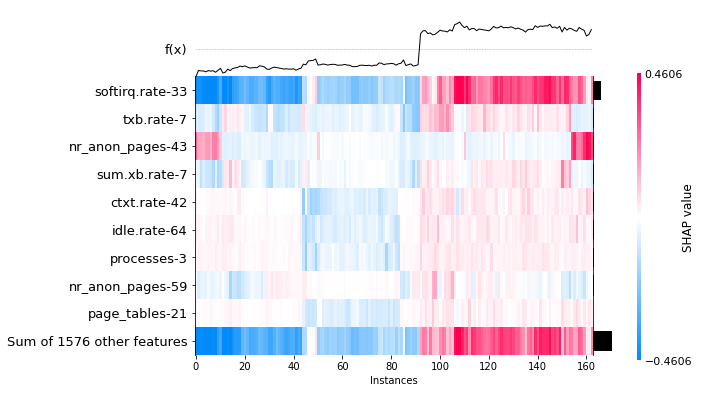

In [41]:
# heatmap plot function creates a plot with the instances on the x-axis, the model inputs on the y-axis, 
# and the SHAP values encoded on a color scale. By default the samples are ordered using shap.order.hclust, 
# which orders the samples based on a hierarchical clustering by their explanation similarity. 
# This results in samples that have the same model output for the same reason getting grouped together 
#(such as people with a high impact from capital gain in the plot below).
shap.plots.heatmap(shap_values_if5)

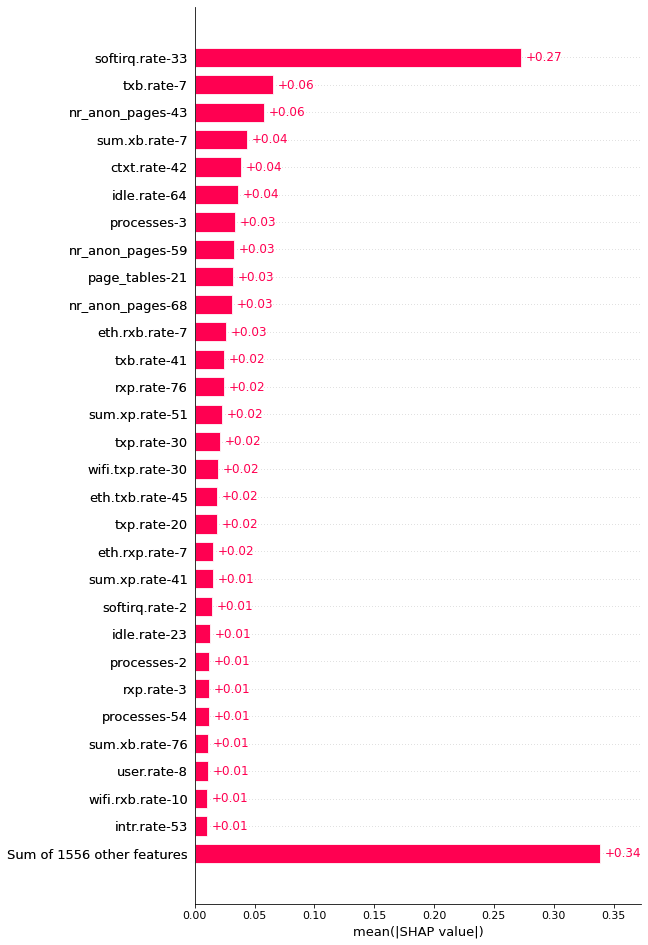

In [42]:
#bar plot function creates a global feature importance plot where the global importance of each feature is taken to be the mean absolute value for that feature over all the given samples.
shap.plots.bar(shap_values_if5, max_display=30)

In [43]:
# Get feature importance 
# vals= np.abs(shap_values).mean(0)
# feature_importance = pd.DataFrame(list(zip(shap_values.feature_names,vals)),columns=['feature_name','feature_importance_vals'])
# feature_importance.sort_values(by=['feature_importance_vals'],ascending=False,inplace=True)
# feature_importance.head()

In [44]:
## Feature importance

[
"txb.rate",
"processes-3",
"ctxt.rate-42",
"txb.rate-7",
"page_tables-21",
"idle.rate-64",
"nr_anon_pages-43",
"txp.rate-20",
"eth.rxb.rate-7",
"sum.xp.rate-51",
"nr_anon_pages-59",
"sum.xp.rate-51",
"softirq.rate-33",
"nr_anon_pages-68",
"eth.txb.rate-45",
"nr_anon_pages-54",
"rxp.rate-3",
"wifi.tcp.rate-30",
"txp.rate-30",
"processes-64",
"processes-54",
"softirq.rate-2",
"idle.rate-23",
"sum.xb.rate-37",
"rxp.rate-76",
"intr.rate-53",
"diff.xb.rate-7",
"user.rate-8",
"eth.rxp.rate-7"
]



['txb.rate',
 'processes-3',
 'ctxt.rate-42',
 'txb.rate-7',
 'page_tables-21',
 'idle.rate-64',
 'nr_anon_pages-43',
 'txp.rate-20',
 'eth.rxb.rate-7',
 'sum.xp.rate-51',
 'nr_anon_pages-59',
 'sum.xp.rate-51',
 'softirq.rate-33',
 'nr_anon_pages-68',
 'eth.txb.rate-45',
 'nr_anon_pages-54',
 'rxp.rate-3',
 'wifi.tcp.rate-30',
 'txp.rate-30',
 'processes-64',
 'processes-54',
 'softirq.rate-2',
 'idle.rate-23',
 'sum.xb.rate-37',
 'rxp.rate-76',
 'intr.rate-53',
 'diff.xb.rate-7',
 'user.rate-8',
 'eth.rxp.rate-7']